<a href="https://colab.research.google.com/github/JoanEjeta/A-Machine-Learning-Approach-to-Predict-the-Corrosion-Rate-of-CO2-Transport-Pipelines/blob/main/ML_corrosion_simulated_and_experiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from scipy import stats
%matplotlib inline

In [ ]:
%%capture
!pip install xgboost

In [ ]:
%%capture
!pip install catboost

## Load data synthetic and experimental

In [ ]:
#Load dataset with Corrosion Inbibitors
Xa = pd.read_csv("/content/Dataset_for_internal_CO2_corrosion_of_oil_pipeline.csv")
Xb = pd.read_csv("/content/China_pipeline_data.csv")
Xc = pd.read_csv("/content/New_corrosion.csv")

In [ ]:
Xa.describe()

,Temperature,Flow velocity,CO2 pressure,Internal pressure,Corrosion Inhibitor efficiency,Shear stress,pH,Corrosion rate
count,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000
mean,40.000000,1.500000,1.500000,65.000000,50.000000,4.000000,3.918519,4.379835
std,8.181818,0.245455,0.409091,4.090909,8.181818,0.818182,0.067010,1.259626
min,30.000000,1.200000,1.000000,60.000000,40.000000,3.000000,3.800000,2.100000
25%,30.000000,1.200000,1.000000,60.000000,40.000000,3.000000,3.900000,3.400000
50%,40.000000,1.500000,1.500000,65.000000,50.000000,4.000000,3.900000,4.300000
75%,50.000000,1.800000,2.000000,70.000000,60.000000,5.000000,4.000000,5.200000
max,50.000000,1.800000,2.000000,70.000000,60.000000,5.000000,4.000000,7.600000


In [ ]:
Xb.describe()

,Temperature,Flow velocity,CO2 pressure,Internal pressure,Shear stress,pH,Corrosion rate
count,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.00000
mean,50.333500,0.580000,2.468993,24.689917,1.899950,4.898333,2.87550
std,8.071108,0.109653,0.133254,1.332553,3.154465,0.021953,0.19219
min,38.420000,0.520000,1.812300,18.122800,0.385000,4.870000,2.54000
25%,43.330000,0.520000,2.484075,24.840250,0.393750,4.880000,2.73000
50%,49.350000,0.530000,2.499800,24.998300,0.395000,4.900000,2.86000
75%,56.892500,0.560000,2.514625,25.146500,0.776500,4.910000,3.05000
max,64.670000,0.860000,2.521100,25.211400,11.300000,4.960000,3.11000


In [ ]:
Xc.describe()

,Temperature,Flow velocity,CO2 pressure,Internal pressure,Corrosion Inhibitor efficiency,Shear stress,pH,Corrosion rate
count,124.000000,124.000000,124.000000,73.000000,0.0,0.0,124.000000,124.000000
mean,60.641129,5.845581,37.456613,56.004110,NaN,NaN,4.877097,5.854629
std,24.293393,13.877595,115.089167,10.865969,NaN,NaN,0.924520,9.414908
min,13.000000,0.000000,0.900000,30.000000,NaN,NaN,3.100000,0.022000
25%,45.875000,1.550000,2.400000,47.000000,NaN,NaN,4.000000,0.062000
50%,60.000000,2.450000,3.500000,57.000000,NaN,NaN,5.025000,0.139000
75%,69.000000,3.562500,5.485000,65.000000,NaN,NaN,5.450000,10.040000
max,150.000000,82.300000,827.000000,73.000000,NaN,NaN,6.500000,48.250000


<Axes: xlabel='pH', ylabel='Density'>

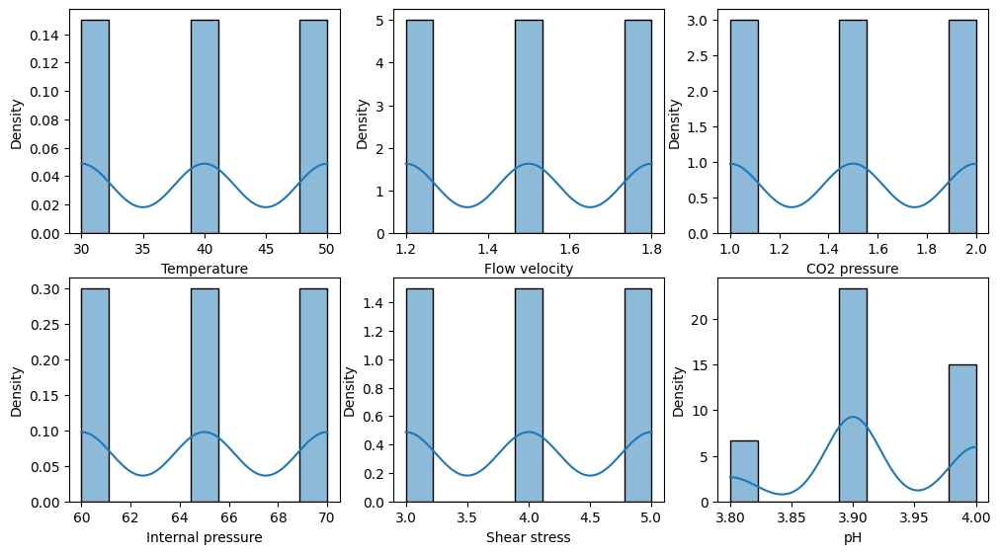

In [ ]:
plt.figure(1, figsize=(12, 10))

plt.figure(1)
plt.subplot(331)
sns.histplot(Xa['Temperature'], kde=True, stat="density")

plt.subplot(332)
sns.histplot(Xa['Flow velocity'], kde=True, stat="density")

plt.subplot(333)
sns.histplot(Xa['CO2 pressure'], kde=True, stat="density")

plt.subplot(334)
sns.histplot(Xa['Internal pressure'], kde=True, stat="density")

plt.subplot(335)
sns.histplot(Xa['Shear stress'], kde=True, stat="density")

plt.subplot(336)
sns.histplot(Xa['pH'], kde=True, stat="density")

<Axes: xlabel='Corrosion rate', ylabel='Count'>

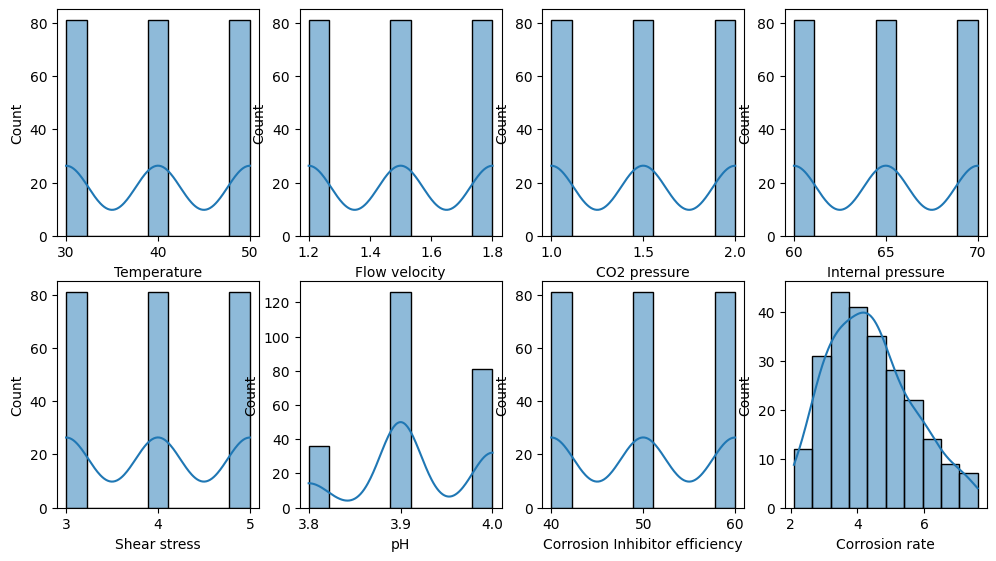

In [ ]:
plt.figure(1, figsize=(12, 10))

plt.figure(1)
plt.subplot(341)
sns.histplot(Xa['Temperature'], kde=True)

plt.subplot(342)
sns.histplot(Xa['Flow velocity'], kde=True)

plt.subplot(343)
sns.histplot(Xa['CO2 pressure'], kde=True)

plt.subplot(344)
sns.histplot(Xa['Internal pressure'], kde=True)

plt.subplot(345)
sns.histplot(Xa['Shear stress'], kde=True)

plt.subplot(346)
sns.histplot(Xa['pH'], kde=True)

plt.subplot(347)
sns.histplot(Xa['Corrosion Inhibitor efficiency'], kde=True)

plt.subplot(348)
sns.histplot(Xa['Corrosion rate'], kde=True)

<Axes: xlabel='Corrosion rate', ylabel='Count'>

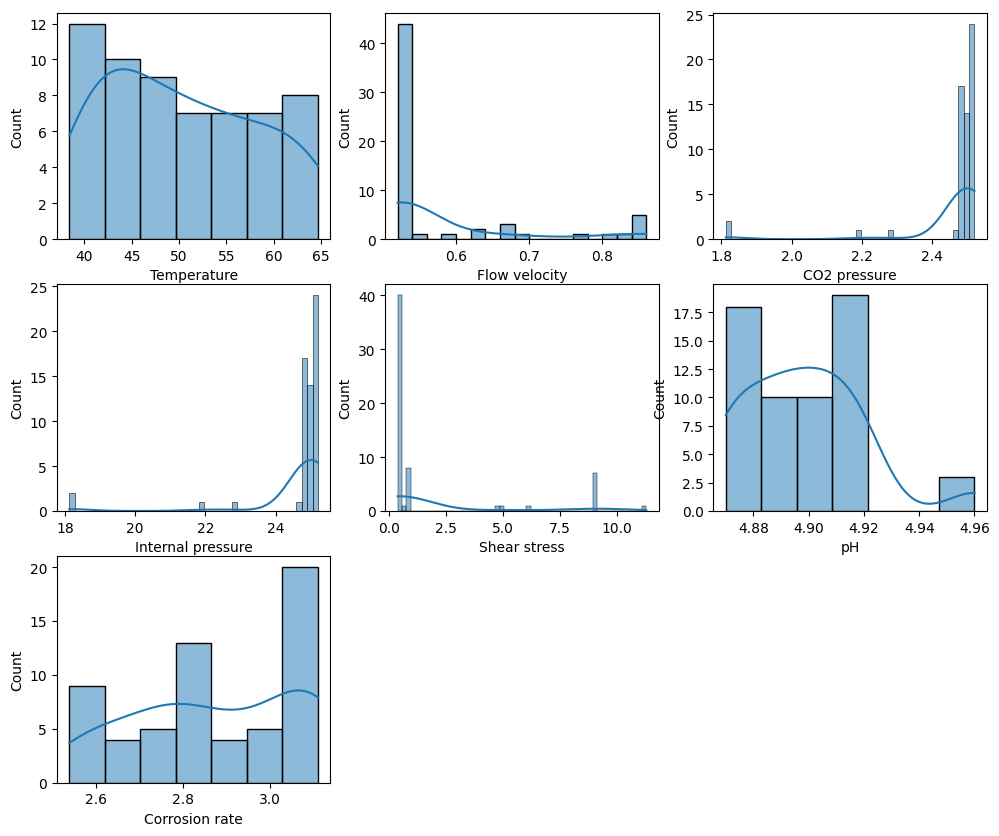

In [ ]:
plt.figure(1, figsize=(12, 10))

plt.figure(1)
plt.subplot(331)
sns.histplot(Xb['Temperature'], kde=True)

plt.subplot(332)
sns.histplot(Xb['Flow velocity'], kde=True)

plt.subplot(333)
sns.histplot(Xb['CO2 pressure'], kde=True)

plt.subplot(334)
sns.histplot(Xb['Internal pressure'], kde=True)

plt.subplot(335)
sns.histplot(Xb['Shear stress'], kde=True)

plt.subplot(336)
sns.histplot(Xb['pH'], kde=True)

plt.subplot(337)
sns.histplot(Xb['Corrosion rate'], kde=True)

<Axes: xlabel='Corrosion rate', ylabel='Count'>

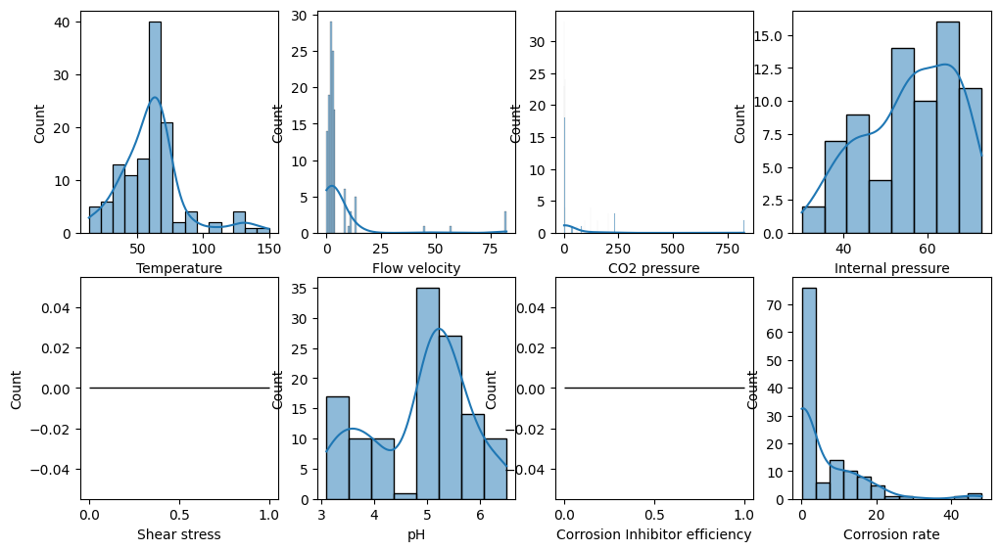

In [ ]:
plt.figure(1, figsize=(12, 10))

plt.figure(1)
plt.subplot(341)
sns.histplot(Xc['Temperature'], kde=True)

plt.subplot(342)
sns.histplot(Xc['Flow velocity'], kde=True)

plt.subplot(343)
sns.histplot(Xc['CO2 pressure'], kde=True)

plt.subplot(344)
sns.histplot(Xc['Internal pressure'], kde=True)

plt.subplot(345)
sns.histplot(Xc['Shear stress'], kde=True)

plt.subplot(346)
sns.histplot(Xc['pH'], kde=True)

plt.subplot(347)
sns.histplot(Xc['Corrosion Inhibitor efficiency'], kde=True)

plt.subplot(348)
sns.histplot(Xc['Corrosion rate'], kde=True)

<Axes: xlabel='Corrosion rate', ylabel='Count'>

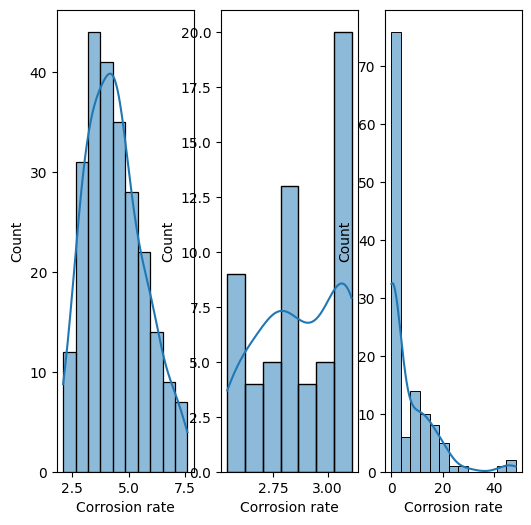

In [ ]:
#plt.figure(1)
#sns.histplot(Xa['Corrosion Inhibitor efficiency'], kde=True)

plt.figure(1, figsize=(6, 6))

plt.figure(1)
plt.subplot(131)
sns.histplot(Xa['Corrosion rate'], kde=True)

plt.subplot(132)
sns.histplot(Xb['Corrosion rate'], kde=True)

plt.subplot(133)
sns.histplot(Xc['Corrosion rate'], kde=True)

In [ ]:
# X = pd.concat(
#     map(pd.read_csv, ['/content/Dataset_for_internal_CO2_corrosion_of_oil_pipeline.csv', '/content/China_pipeline_data.csv'], '/content/New_corrosion.csv'), ignore_index=True)
# print(X)

# Read the CSV files into DataFrames
df1 = pd.read_csv('/content/Dataset_for_internal_CO2_corrosion_of_oil_pipeline.csv')
df2 = pd.read_csv('/content/China_pipeline_data.csv')
df3 = pd.read_csv('/content/New_corrosion.csv')

# Concatenate the DataFrames
X = pd.concat([df1, df2, df3], ignore_index=True)

print(X)

     Temperature  Flow velocity  CO2 pressure  Internal pressure  \
0           30.0          1.200          1.00               60.0   
1           30.0          1.200          1.00               60.0   
2           30.0          1.200          1.00               60.0   
3           30.0          1.200          1.00               65.0   
4           30.0          1.200          1.00               65.0   
..           ...            ...           ...                ...   
422         69.0          1.960          5.30               53.0   
423         67.0          2.480          2.40               54.0   
424         70.0          2.080          3.20               56.0   
425         45.0          2.024          2.30               48.0   
426         65.0          3.020          2.56               47.0   

     Corrosion Inhibitor efficiency  Shear stress    pH  Corrosion rate  
0                              40.0           3.0  4.00           3.200  
1                              50.0

In [ ]:
X.head()

,Temperature,Flow velocity,CO2 pressure,Internal pressure,Corrosion Inhibitor efficiency,Shear stress,pH,Corrosion rate
0,30.0,1.2,1.0,60.0,40.0,3.0,4.0,3.2
1,30.0,1.2,1.0,60.0,50.0,3.0,4.0,2.6
2,30.0,1.2,1.0,60.0,60.0,3.0,4.0,2.1
3,30.0,1.2,1.0,65.0,40.0,3.0,4.0,3.1
4,30.0,1.2,1.0,65.0,50.0,3.0,4.0,2.6


In [ ]:
X.shape

(427, 8)

In [ ]:
X.describe()

,Temperature,Flow velocity,CO2 pressure,Internal pressure,Corrosion Inhibitor efficiency,Shear stress,pH,Corrosion rate
count,427.000000,427.000000,427.000000,376.000000,243.000000,303.000000,427.000000,427.000000
mean,47.446159,2.632674,12.077891,56.820997,50.000000,3.584149,4.334567,4.596731
std,17.347383,7.744172,63.943848,15.569594,8.181818,1.784130,0.691800,5.234933
min,13.000000,0.000000,0.900000,18.122800,40.000000,0.385000,3.100000,0.022000
25%,40.000000,1.200000,1.500000,56.000000,40.000000,3.000000,3.900000,2.715000
50%,45.500000,1.500000,2.000000,63.000000,50.000000,4.000000,4.000000,3.600000
75%,52.735000,1.800000,2.502900,67.000000,60.000000,5.000000,4.910000,5.150000
max,150.000000,82.300000,827.000000,73.000000,60.000000,11.300000,6.500000,48.250000


In [ ]:
Xf= X.copy()
Xf.columns = ["Temperature °C", "Flow velocity m/s", "CO2 pressure bar", "Internal pressure bar", "Corrosion Inhibitor efficiency %", "Shear stress Pa", "pH", "Corrosion rate mm/yr"]  # length must match number of columns
Xf.describe().round(3)


,Temperature °C,Flow velocity m/s,CO2 pressure bar,Internal pressure bar,Corrosion Inhibitor efficiency %,Shear stress Pa,pH,Corrosion rate mm/yr
count,427.000,427.000,427.000,376.000,243.000,303.000,427.000,427.000
mean,47.446,2.633,12.078,56.821,50.000,3.584,4.335,4.597
std,17.347,7.744,63.944,15.570,8.182,1.784,0.692,5.235
min,13.000,0.000,0.900,18.123,40.000,0.385,3.100,0.022
25%,40.000,1.200,1.500,56.000,40.000,3.000,3.900,2.715
50%,45.500,1.500,2.000,63.000,50.000,4.000,4.000,3.600
75%,52.735,1.800,2.503,67.000,60.000,5.000,4.910,5.150
max,150.000,82.300,827.000,73.000,60.000,11.300,6.500,48.250


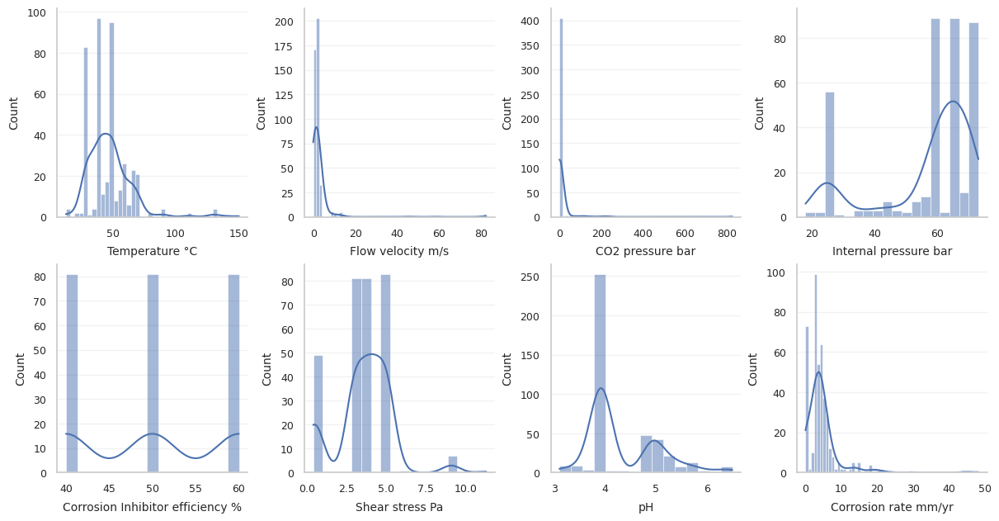

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# DataFrame with your columns
# cleaned_df = ...

# Columns in the order shown
features = [
    "Temperature °C",
    "Flow velocity m/s",
    "CO2 pressure bar",
    "Internal pressure bar",
    "Corrosion Inhibitor efficiency %",
    "Shear stress Pa", "pH",
    "Corrosion rate mm/yr",
    # "Temperature",
    # "Flow velocity",
    # "CO2 pressure",
    # "Internal pressure",
    # "Shear stress",
    # "pH",
    # "Corrosion Inhibitor efficiency",
    # "Corrosion rate",
]

# --- style for journal plots ---
sns.set_theme(style="whitegrid", font_scale=1.0)
plt.rcParams.update({
    "figure.dpi": 100,
    "savefig.dpi": 300,
    "axes.titlepad": 8,
    "axes.labelpad": 6,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
})

def fd_bins(x, min_bins=15, max_bins=60):
    """Freedman–Diaconis bin count (robust to outliers)."""
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    if x.size < 2:
        return min_bins
    iqr = np.subtract(*np.percentile(x, [75, 25]))
    if iqr == 0:
        return min_bins
    h = 2 * iqr * x.size ** (-1/3)
    if h <= 0:
        return min_bins
    bins = int(np.clip((x.max() - x.min()) / h, min_bins, max_bins))
    return bins

fig, axes = plt.subplots(2, 4, figsize=(12, 6.2), constrained_layout=True)

for ax, col in zip(axes.ravel(), features):
    s = pd.to_numeric(Xf[col], errors="coerce").dropna()
    b = fd_bins(s)

    # histogram + KDE
    sns.histplot(
        s, bins=b, kde=True, stat="count",
        ax=ax, edgecolor="white", linewidth=0.4
    )

    # titles/labels
    #ax.set_title(col)
    #ax.set_xlabel(col if col in ["pH"] else None)   # keep x-label minimal
    ax.set_ylabel("Count")

    # tidy up aesthetics
    sns.despine(ax=ax, left=False, bottom=False)
    ax.grid(True, axis="y", alpha=0.25)
    ax.grid(False, axis="x")

# optional: tighten extreme x-ranges a bit for readability (uncomment if needed)
# axes.ravel()[2].set_xlim(left=0)      # CO2 pressure
# axes.ravel()[7].set_xlim(left=0)      # Corrosion rate

# save and/or show
plt.savefig("feature_hist_kde_grid.png", bbox_inches="tight")
plt.show()


In [ ]:
print(Xf.columns.tolist())

['Temperature °C', 'Flow velocity m/s', 'CO2 pressure bar', 'Internal pressure bar', 'Corrosion Inhibitor efficiency %', 'Shear stress Pa', 'pH', 'Corrosion rate mm/yr']


In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 427 entries, 0 to 426
Data columns (total 8 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Temperature                     427 non-null    float64
 1   Flow velocity                   427 non-null    float64
 2   CO2 pressure                    427 non-null    float64
 3   Internal pressure               376 non-null    float64
 4   Corrosion Inhibitor efficiency  243 non-null    float64
 5   Shear stress                    303 non-null    float64
 6   pH                              427 non-null    float64
 7   Corrosion rate                  427 non-null    float64
dtypes: float64(8)
memory usage: 26.8 KB


In [ ]:
X.isnull().sum()

,0
Temperature,0
Flow velocity,0
CO2 pressure,0
Internal pressure,51
Corrosion Inhibitor efficiency,184
Shear stress,124
pH,0
Corrosion rate,0


<Axes: xlabel='Corrosion rate'>

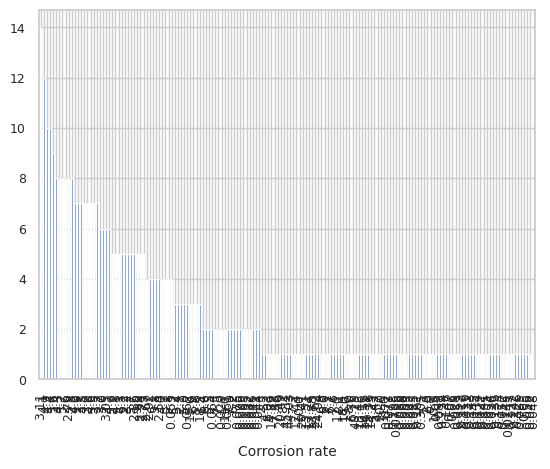

In [ ]:
X['Corrosion rate'].value_counts()
X['Corrosion rate'].value_counts().plot.bar()

<Axes: xlabel='Corrosion rate', ylabel='Count'>

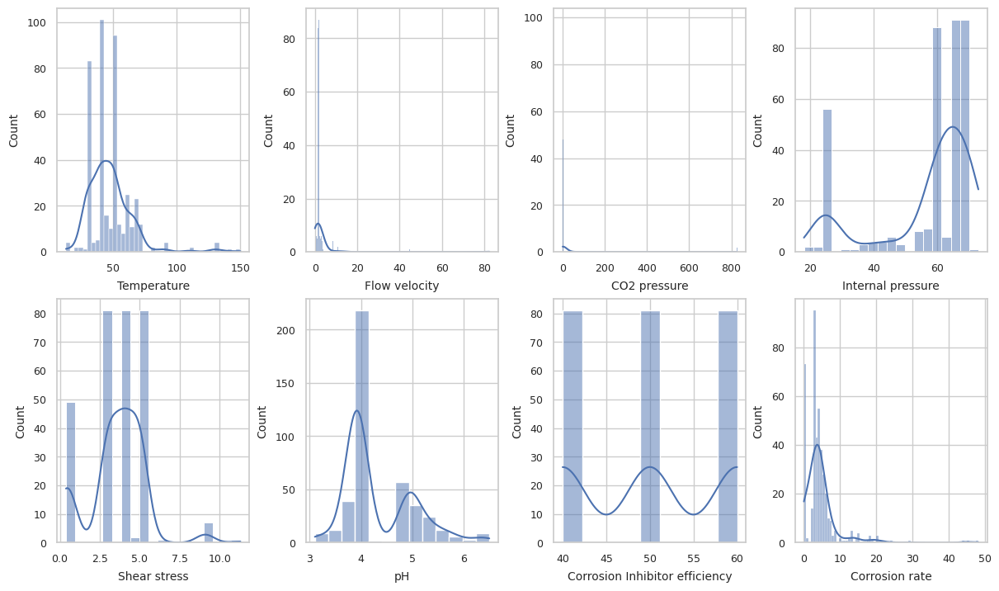

In [ ]:
plt.figure(1, figsize=(12, 10), constrained_layout=True)

plt.figure(1)
plt.subplot(341)
sns.histplot(X['Temperature'], kde=True)

plt.subplot(342)
sns.histplot(X['Flow velocity'], kde=True)

plt.subplot(343)
sns.histplot(X['CO2 pressure'], kde=True)

plt.subplot(344)
sns.histplot(X['Internal pressure'], kde=True)

plt.subplot(345)
sns.histplot(X['Shear stress'], kde=True)

plt.subplot(346)
sns.histplot(X['pH'], kde=True)

plt.subplot(347)
sns.histplot(X['Corrosion Inhibitor efficiency'], kde=True)

plt.subplot(348)
sns.histplot(X['Corrosion rate'], kde=True)

In [ ]:
#Copy the merged dataset into a new variable
df = X.copy()
dfA = X.copy()

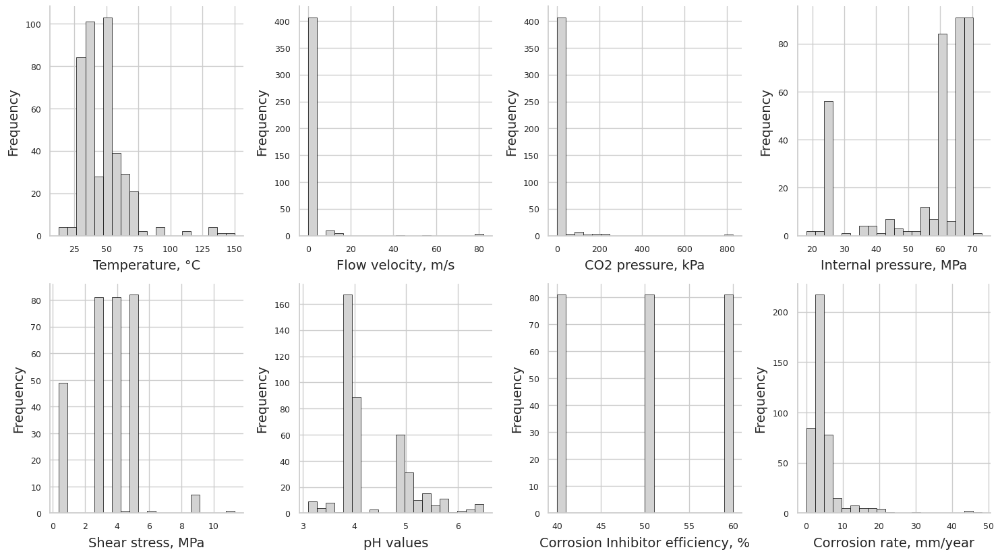

In [ ]:
import matplotlib.pyplot as plt

# Create figure with subplots
fig = plt.figure(figsize=(15, 12))

# Define columns and their subplot positions
plots_config = [
    (341, 'Temperature', 'Temperature, °C'),
    (342, 'Flow velocity', 'Flow velocity, m/s'),
    (343, 'CO2 pressure', 'CO2 pressure, kPa'),
    (344, 'Internal pressure', 'Internal pressure, MPa'),
    (345, 'Shear stress', 'Shear stress, MPa'),
    (346, 'pH', 'pH values'),
    (347, 'Corrosion Inhibitor efficiency', 'Corrosion Inhibitor efficiency, %'),
    (348, 'Corrosion rate', 'Corrosion rate, mm/year')
]

# Create each subplot
for subplot_num, col_name, xlabel in plots_config:
    ax = plt.subplot(subplot_num)

    # Create histogram with gray color and black edges
    ax.hist(dfA[col_name], bins=20, color='lightgray', edgecolor='black', linewidth=0.5)

    # Set labels
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)

    # Remove top and right spines for cleaner look
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Adjust tick label size
    ax.tick_params(labelsize=9)

plt.tight_layout()
plt.show()

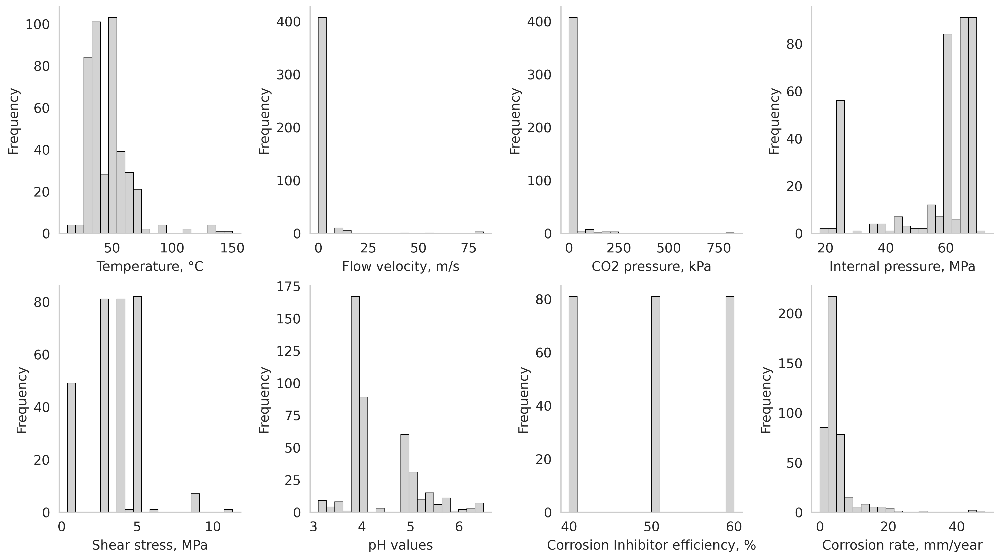

In [ ]:
import matplotlib.pyplot as plt

# Set global parameters
plt.rcParams.update({
    'figure.dpi': 300,
    'axes.labelsize': 14,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
})

# Create figure with subplots
fig = plt.figure(figsize=(15, 12))

# Define columns and their subplot positions
plots_config = [
    (341, 'Temperature', 'Temperature, °C'),
    (342, 'Flow velocity', 'Flow velocity, m/s'),
    (343, 'CO2 pressure', 'CO2 pressure, kPa'),
    (344, 'Internal pressure', 'Internal pressure, MPa'),
    (345, 'Shear stress', 'Shear stress, MPa'),
    (346, 'pH', 'pH values'),
    (347, 'Corrosion Inhibitor efficiency', 'Corrosion Inhibitor efficiency, %'),
    (348, 'Corrosion rate', 'Corrosion rate, mm/year')
]

# Create each subplot
for subplot_num, col_name, xlabel in plots_config:
    ax = plt.subplot(subplot_num)

    ax.hist(dfA[col_name], bins=20, color='lightgray', edgecolor='black', linewidth=0.5)

    # Set labels with larger font
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)

    # Remove spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Increase tick label size
    ax.tick_params(labelsize=14)

    # Remove grid
    ax.grid(False)

plt.tight_layout()
plt.savefig('histograms.png', dpi=300, bbox_inches='tight')
plt.show()

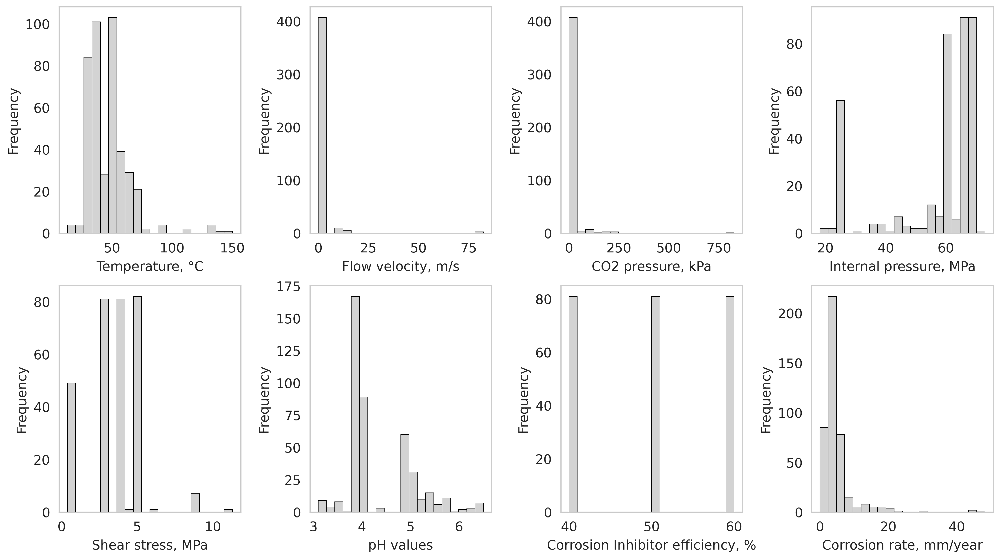

In [ ]:
import matplotlib.pyplot as plt

# Set global parameters
plt.rcParams.update({
    'figure.dpi': 300,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
})

# Create figure with subplots
fig = plt.figure(figsize=(15, 12))

# Define columns and their subplot positions
plots_config = [
    (341, 'Temperature', 'Temperature, °C'),
    (342, 'Flow velocity', 'Flow velocity, m/s'),
    (343, 'CO2 pressure', 'CO2 pressure, kPa'),
    (344, 'Internal pressure', 'Internal pressure, MPa'),
    (345, 'Shear stress', 'Shear stress, MPa'),
    (346, 'pH', 'pH values'),
    (347, 'Corrosion Inhibitor efficiency', 'Corrosion Inhibitor efficiency, %'),
    (348, 'Corrosion rate', 'Corrosion rate, mm/year')
]

# Create each subplot
for subplot_num, col_name, xlabel in plots_config:
    ax = plt.subplot(subplot_num)

    ax.hist(dfA[col_name], bins=20, color='lightgray', edgecolor='black', linewidth=0.5)

    # Set labels with larger font
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)

    # Keep all spines (axis lines) visible
    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    ax.spines['left'].set_visible(True)

    # Increase tick label size
    ax.tick_params(labelsize=14)

    # Remove grid only
    ax.grid(False)

plt.tight_layout()
plt.savefig('histograms.png', dpi=300, bbox_inches='tight')
plt.show()

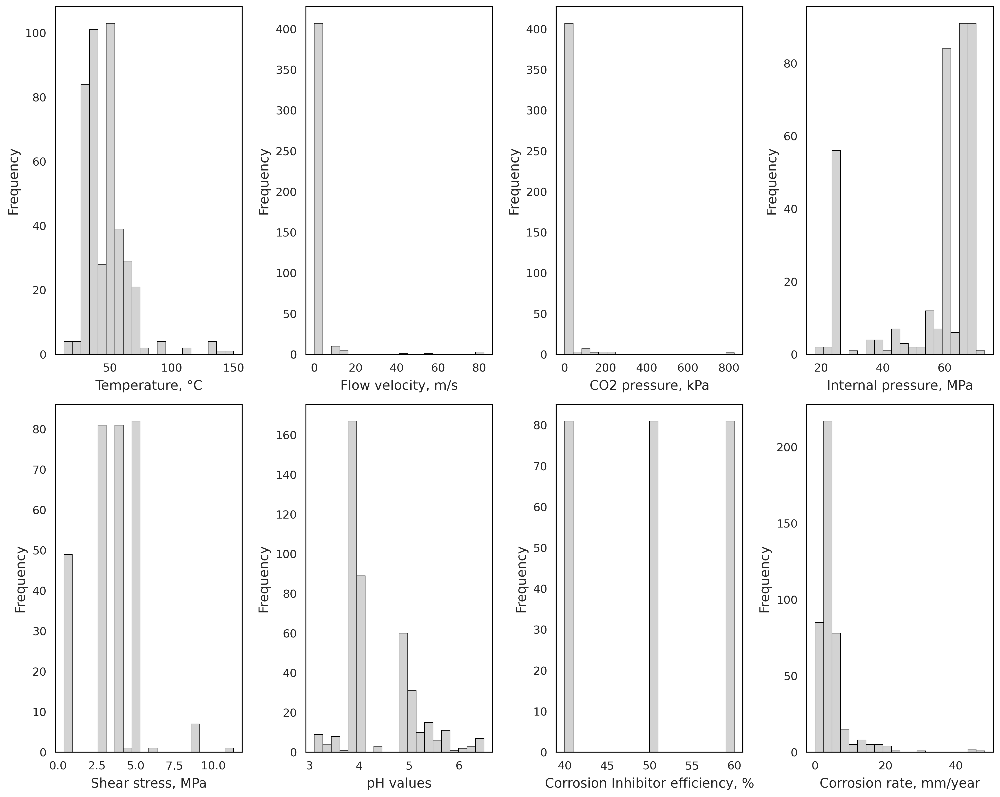

In [ ]:
import matplotlib.pyplot as plt

# Set global parameters
plt.rcParams.update({
    'figure.dpi': 300,
    'savefig.dpi': 300,
})

# Create figure with subplots
fig = plt.figure(figsize=(15, 12))

# Define columns and their subplot positions
plots_config = [
    (241, 'Temperature', 'Temperature, °C'),
    (242, 'Flow velocity', 'Flow velocity, m/s'),
    (243, 'CO2 pressure', 'CO2 pressure, kPa'),
    (244, 'Internal pressure', 'Internal pressure, MPa'),
    (245, 'Shear stress', 'Shear stress, MPa'),
    (246, 'pH', 'pH values'),
    (247, 'Corrosion Inhibitor efficiency', 'Corrosion Inhibitor efficiency, %'),
    (248, 'Corrosion rate', 'Corrosion rate, mm/year')
]

# Create each subplot
for subplot_num, col_name, xlabel in plots_config:
    ax = plt.subplot(subplot_num)

    ax.hist(dfA[col_name], bins=20, color='lightgray', edgecolor='black', linewidth=0.5)

    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.tick_params(labelsize=12)
    ax.grid(False)

    # Set black box (spines) around each plot
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color('black')
        spine.set_linewidth(1.0)

plt.tight_layout()
plt.savefig('histograms.png', dpi=300, bbox_inches='tight')
plt.show()

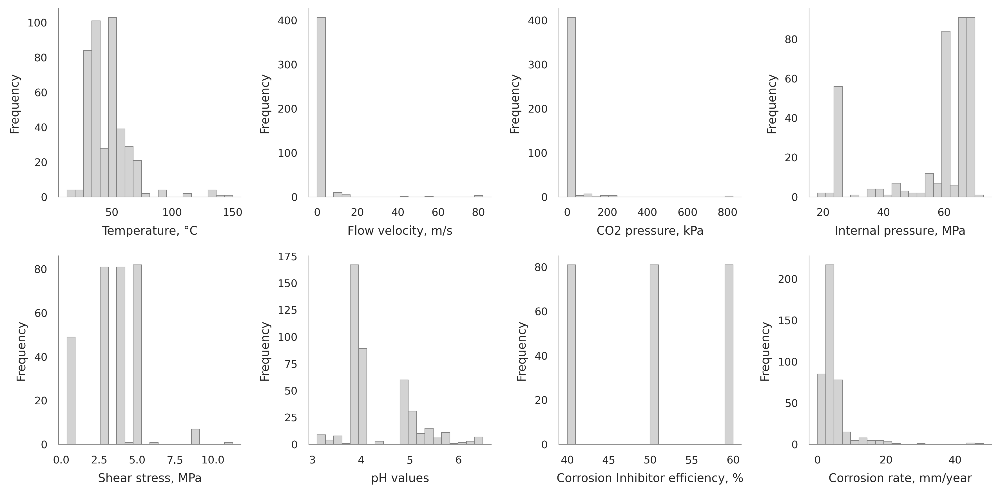

In [ ]:
import matplotlib.pyplot as plt

# Set global parameters
plt.rcParams.update({
    'figure.dpi': 300,
    'savefig.dpi': 300,
})

# Create figure with subplots
fig = plt.figure(figsize=(12, 6))

# Define columns and their subplot positions
plots_config = [
    (241, 'Temperature', 'Temperature, °C'),
    (242, 'Flow velocity', 'Flow velocity, m/s'),
    (243, 'CO2 pressure', 'CO2 pressure, kPa'),
    (244, 'Internal pressure', 'Internal pressure, MPa'),
    (245, 'Shear stress', 'Shear stress, MPa'),
    (246, 'pH', 'pH values'),
    (247, 'Corrosion Inhibitor efficiency', 'Corrosion Inhibitor efficiency, %'),
    (248, 'Corrosion rate', 'Corrosion rate, mm/year')
]

# Create each subplot
for subplot_num, col_name, xlabel in plots_config:
    ax = plt.subplot(subplot_num)

    ax.hist(dfA[col_name], bins=20, color='lightgray', edgecolor='gray', linewidth=0.5)

    ax.set_xlabel(xlabel, fontsize=10)
    ax.set_ylabel('Frequency', fontsize=10)
    ax.tick_params(labelsize=9)
    ax.grid(False)

    # Remove top and right spines (keep only left and bottom)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('gray')
    ax.spines['bottom'].set_color('gray')
    ax.spines['left'].set_linewidth(0.5)
    ax.spines['bottom'].set_linewidth(0.5)

plt.tight_layout()
plt.savefig('histograms.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# # import numpy as np
# # import pandas as pd
# from sklearn.mixture import GaussianMixture
# from sklearn.impute import SimpleImputer
# # import matplotlib.pyplot as plt

# # Load or create the dataset with missing values
# # Assuming df is your DataFrame and the column of interest is 'Corrosion Inhibitor Efficiency'
# # df = pd.read_csv('your_dataset.csv')

# # Check for typos and correct the column name if needed
# # For example, if the actual column name is 'Corrosion_Inhibitor_Efficiency', change the line below:
# # column_name = 'Corrosion_Inhibitor_Efficiency'  # Replace with the actual column name
# # column_name = df.columns[df.columns.str.contains('Corrosion Inhibitor', 'Internal pressure', 'Shear stress', case=False)][0] # extract the name of the column similar to 'Corrosion Inhibitor'
# column_name = df.columns[df.columns.str.contains('Corrosion Inhibitor', case=False)][0] # extract the name of the column similar to 'Corrosion Inhibitor'

# # Replace missing values with initial estimates (e.g., mean)
# imputer = SimpleImputer(strategy='mean')
# data_imputed = imputer.fit_transform(df[[column_name]]) #use the extracted column name

# # Define the range for the number of components to test
# n_components_range = range(1, 6)  # Testing 1 to 5 components
# bic_scores = []
# aic_scores = []

# # Fit GMM for each number of components and record BIC and AIC
# for n_components in n_components_range:
#     gmm = GaussianMixture(n_components=n_components, max_iter=100, random_state=42)
#     gmm.fit(data_imputed)

#     # Record the BIC and AIC scores
#     bic_scores.append(gmm.bic(data_imputed))
#     aic_scores.append(gmm.aic(data_imputed))

# # Plot BIC and AIC scores to visualize the best number of components
# plt.figure(figsize=(10, 5))
# plt.plot(n_components_range, bic_scores, label='BIC', marker='o')
# plt.plot(n_components_range, aic_scores, label='AIC', marker='o')
# plt.xlabel('Number of Components')
# plt.ylabel('Score')
# plt.legend()
# plt.title('BIC and AIC Scores for GMM')
# plt.show()

# # Determine the optimal number of components based on the lowest BIC and AIC
# optimal_bic_components = n_components_range[np.argmin(bic_scores)]
# optimal_aic_components = n_components_range[np.argmin(aic_scores)]

# print(f"Optimal number of components based on BIC: {optimal_bic_components}")
# print(f"Optimal number of components based on AIC: {optimal_aic_components}")

Columns to impute: ['Corrosion Inhibitor efficiency', 'Internal pressure', 'Shear stress']


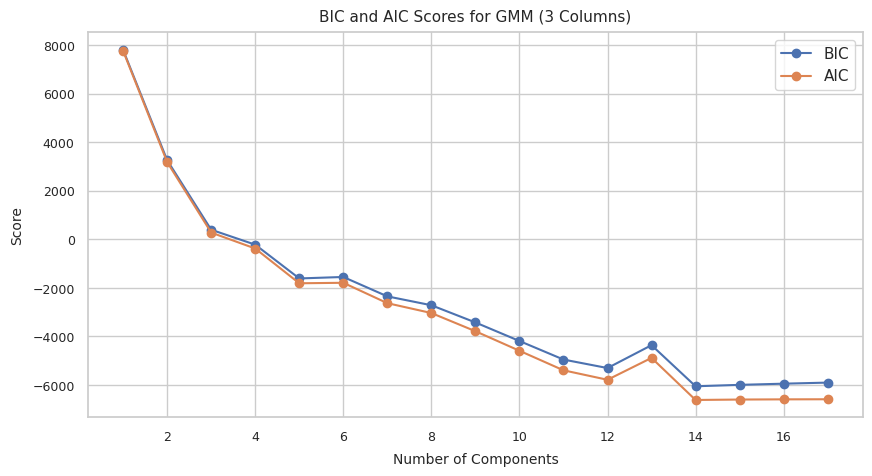

Optimal number of components based on BIC: 14
Optimal number of components based on AIC: 14

Imputation complete!
Shape of imputed data: (427, 3)


In [ ]:
import numpy as np
import pandas as pd
from sklearn.mixture import GaussianMixture
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt

# Load or create the dataset with missing values
# df = pd.read_csv('your_dataset.csv')

# Define the three columns to impute
columns_to_impute = [
    'Corrosion Inhibitor',
    'Internal pressure',
    'Shear stress'
]

# Extract column names (handling typos/variations)
selected_columns = []
for col_pattern in columns_to_impute:
    matching_cols = df.columns[df.columns.str.contains(col_pattern, case=False)]
    if len(matching_cols) > 0:
        selected_columns.append(matching_cols[0])
    else:
        print(f"Warning: Column matching '{col_pattern}' not found")

print(f"Columns to impute: {selected_columns}")

# Replace missing values with initial estimates (mean)
imputer = SimpleImputer(strategy='mean')
data_imputed = imputer.fit_transform(df[selected_columns])

# Define the range for the number of components to test
n_components_range = range(1, 18)
bic_scores = []
aic_scores = []

# Fit GMM for each number of components and record BIC and AIC
for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, max_iter=100, random_state=42)
    gmm.fit(data_imputed)
    bic_scores.append(gmm.bic(data_imputed))
    aic_scores.append(gmm.aic(data_imputed))

# Plot BIC and AIC scores
plt.figure(figsize=(10, 5))
plt.plot(n_components_range, bic_scores, label='BIC', marker='o')
plt.plot(n_components_range, aic_scores, label='AIC', marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Score')
plt.legend()
plt.title('BIC and AIC Scores for GMM (3 Columns)')
plt.show()

# Determine optimal number of components
optimal_bic_components = n_components_range[np.argmin(bic_scores)]
optimal_aic_components = n_components_range[np.argmin(aic_scores)]

print(f"Optimal number of components based on BIC: {optimal_bic_components}")
print(f"Optimal number of components based on AIC: {optimal_aic_components}")

# Fit GMM with optimal components and impute missing values
optimal_components = optimal_bic_components
gmm_optimal = GaussianMixture(n_components=optimal_components, max_iter=100, random_state=42)
gmm_optimal.fit(data_imputed)

# Create a copy of the dataframe with imputed values
df_imputed = df.copy()
df_imputed[selected_columns] = data_imputed

print("\nImputation complete!")
print(f"Shape of imputed data: {df_imputed[selected_columns].shape}")

In [ ]:
# #Fill missing values of Corrosion Inhibitor Efficiency using Expectation Maximization
# import numpy as np
# import pandas as pd
# from sklearn.mixture import GaussianMixture
# from sklearn.impute import SimpleImputer

# # Step 1: Fill initial missing values with a simple method (mean, median, etc.)
# imputer = SimpleImputer(strategy="mean")
# initial_data = imputer.fit_transform(df)

# # Step 2: Apply Gaussian Mixture Model with EM to refine estimates
# # Number of components in Gaussian Mixture - this can vary based on data (usually 1 or 2)
# n_components = 3
# gmm = GaussianMixture(n_components=n_components, max_iter=10, random_state=42)

# # Iteratively refine missing values with EM
# for i in range(10):  # Repeat EM several times to ensure convergence
#     gmm.fit(initial_data)

#     # Predict the missing values by sampling from the learned distribution
#     # Replace missing values with the predicted values
#     for j in range(df.shape[1]):
#         missing_mask = df.iloc[:, j].isna()
#         if missing_mask.any():
#             predicted_values = gmm.sample(sum(missing_mask))[0]
#             initial_data[missing_mask, j] = predicted_values[:, j]

# # Convert back to DataFrame for easy readability
# filled_df = pd.DataFrame(initial_data, columns=df.columns)

# # Display the filled dataset
# print("Filled DataFrame:")
# print(filled_df)


In [ ]:
#filled_df.info()

df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 427 entries, 0 to 426
Data columns (total 8 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Temperature                     427 non-null    float64
 1   Flow velocity                   427 non-null    float64
 2   CO2 pressure                    427 non-null    float64
 3   Internal pressure               427 non-null    float64
 4   Corrosion Inhibitor efficiency  427 non-null    float64
 5   Shear stress                    427 non-null    float64
 6   pH                              427 non-null    float64
 7   Corrosion rate                  427 non-null    float64
dtypes: float64(8)
memory usage: 26.8 KB


In [ ]:
#filled_df.describe()

df_imputed.describe()

,Temperature,Flow velocity,CO2 pressure,Internal pressure,Corrosion Inhibitor efficiency,Shear stress,pH,Corrosion rate
count,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000
mean,47.446159,2.632674,12.077891,56.820997,50.000000,3.584149,4.334567,4.596731
std,17.347383,7.744172,63.943848,14.607911,6.166698,1.502191,0.691800,5.234933
min,13.000000,0.000000,0.900000,18.122800,40.000000,0.385000,3.100000,0.022000
25%,40.000000,1.200000,1.500000,56.820997,50.000000,3.000000,3.900000,2.715000
50%,45.500000,1.500000,2.000000,60.000000,50.000000,3.584149,4.000000,3.600000
75%,52.735000,1.800000,2.502900,65.000000,50.000000,4.000000,4.910000,5.150000
max,150.000000,82.300000,827.000000,73.000000,60.000000,11.300000,6.500000,48.250000


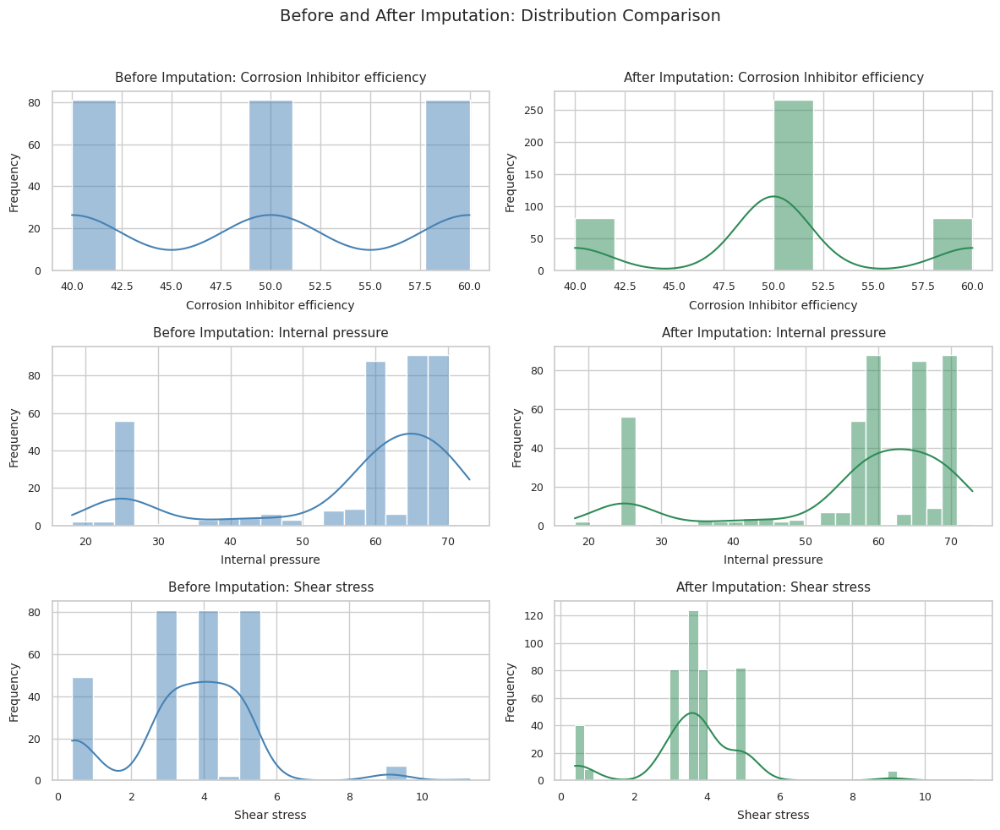

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the columns to visualize
columns = ["Corrosion Inhibitor efficiency", "Internal pressure", "Shear stress"]

# Create a figure with 3 rows × 2 columns of subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 10))
fig.suptitle("Before and After Imputation: Distribution Comparison", fontsize=14)

# Loop through each column and plot histograms (before vs after)
for i, col in enumerate(columns):
    # Original data (before imputation)
    sns.histplot(X[col], kde=True, ax=axes[i, 0], color='steelblue')
    axes[i, 0].set_title(f"Before Imputation: {col}")
    axes[i, 0].set_xlabel(col)
    axes[i, 0].set_ylabel("Frequency")

    # Imputed data (after imputation)
    sns.histplot(df_imputed[col], kde=True, ax=axes[i, 1], color='seagreen')
    axes[i, 1].set_title(f"After Imputation: {col}")
    axes[i, 1].set_xlabel(col)
    axes[i, 1].set_ylabel("Frequency")

# Adjust layout for clarity
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


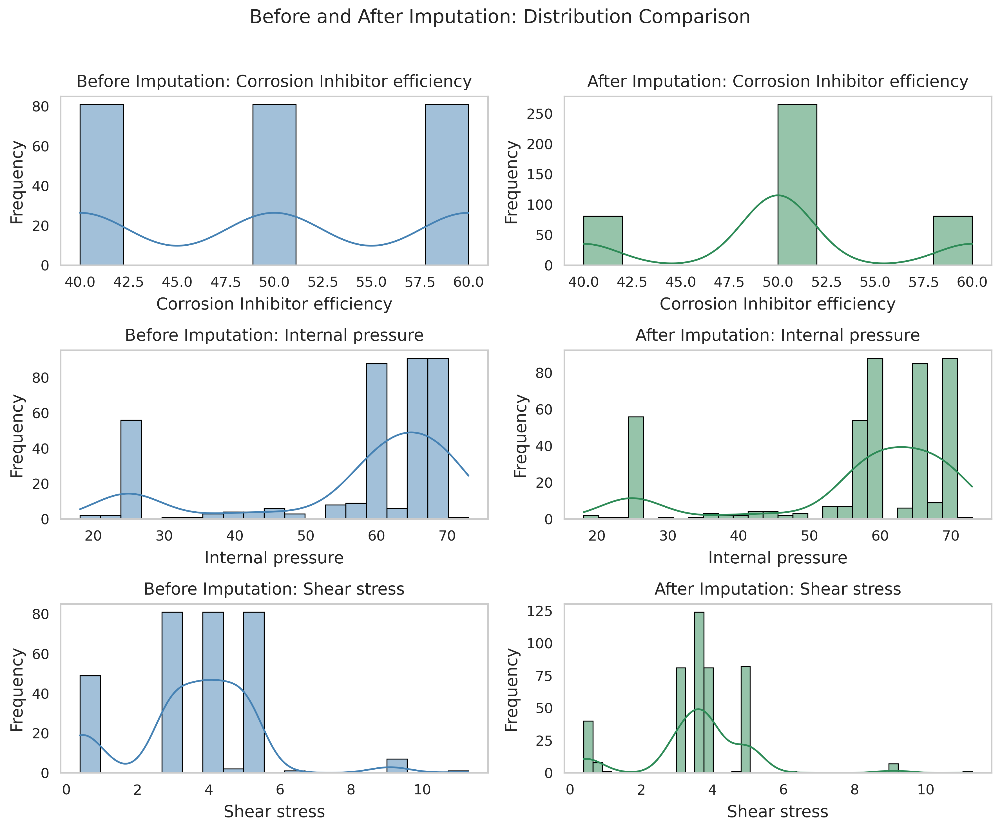

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set global parameters for sharper image
plt.rcParams.update({
    'figure.dpi': 300,
    'savefig.dpi': 300,
})

# Define the columns to visualize
columns = ["Corrosion Inhibitor efficiency", "Internal pressure", "Shear stress"]

# Create a figure with 3 rows × 2 columns of subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 10))
fig.suptitle("Before and After Imputation: Distribution Comparison", fontsize=16)

# Loop through each column and plot histograms (before vs after)
for i, col in enumerate(columns):
    # Original data (before imputation)
    sns.histplot(X[col], kde=True, ax=axes[i, 0], color='steelblue',
                 edgecolor='black', linewidth=0.8)
    axes[i, 0].set_title(f"Before Imputation: {col}", fontsize=14)
    axes[i, 0].set_xlabel(col, fontsize=14)
    axes[i, 0].set_ylabel("Frequency", fontsize=14)
    axes[i, 0].tick_params(labelsize=12)
    axes[i, 0].grid(False)

    # Imputed data (after imputation)
    sns.histplot(df_imputed[col], kde=True, ax=axes[i, 1], color='seagreen',
                 edgecolor='black', linewidth=0.8)
    axes[i, 1].set_title(f"After Imputation: {col}", fontsize=14)
    axes[i, 1].set_xlabel(col, fontsize=14)
    axes[i, 1].set_ylabel("Frequency", fontsize=14)
    axes[i, 1].tick_params(labelsize=12)
    axes[i, 1].grid(False)

# Adjust layout for clarity
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('imputation_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

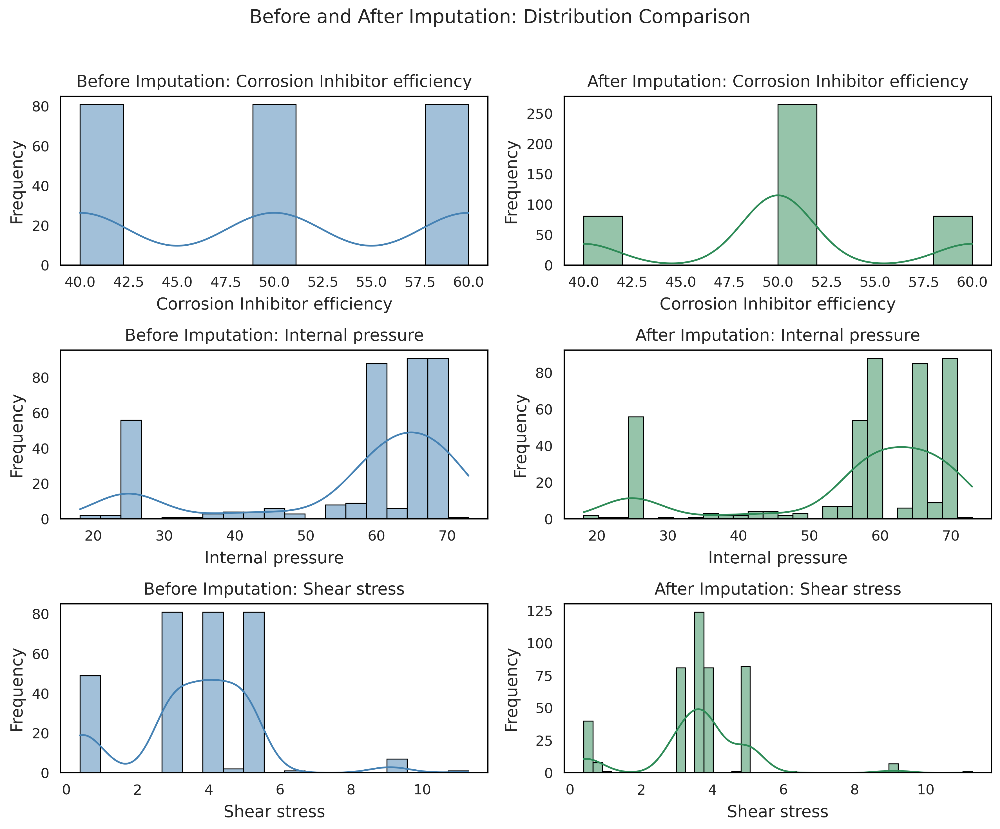

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set global parameters for sharper image
plt.rcParams.update({
    'figure.dpi': 300,
    'savefig.dpi': 300,
})

# Define the columns to visualize
columns = ["Corrosion Inhibitor efficiency", "Internal pressure", "Shear stress"]

# Create a figure with 3 rows × 2 columns of subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 10))
fig.suptitle("Before and After Imputation: Distribution Comparison", fontsize=16)

# Loop through each column and plot histograms (before vs after)
for i, col in enumerate(columns):
    # Original data (before imputation)
    sns.histplot(X[col], kde=True, ax=axes[i, 0], color='steelblue',
                 edgecolor='black', linewidth=0.8)
    axes[i, 0].set_title(f"Before Imputation: {col}", fontsize=14)
    axes[i, 0].set_xlabel(col, fontsize=14)
    axes[i, 0].set_ylabel("Frequency", fontsize=14)
    axes[i, 0].tick_params(labelsize=12)
    axes[i, 0].grid(False)

    # Set black box (spines) for left plot
    for spine in axes[i, 0].spines.values():
        spine.set_visible(True)
        spine.set_color('black')
        spine.set_linewidth(1.0)

    # Imputed data (after imputation)
    sns.histplot(df_imputed[col], kde=True, ax=axes[i, 1], color='seagreen',
                 edgecolor='black', linewidth=0.8)
    axes[i, 1].set_title(f"After Imputation: {col}", fontsize=14)
    axes[i, 1].set_xlabel(col, fontsize=14)
    axes[i, 1].set_ylabel("Frequency", fontsize=14)
    axes[i, 1].tick_params(labelsize=12)
    axes[i, 1].grid(False)

    # Set black box (spines) for right plot
    for spine in axes[i, 1].spines.values():
        spine.set_visible(True)
        spine.set_color('black')
        spine.set_linewidth(1.0)

# Adjust layout for clarity
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('imputation_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

# Outlier Detection

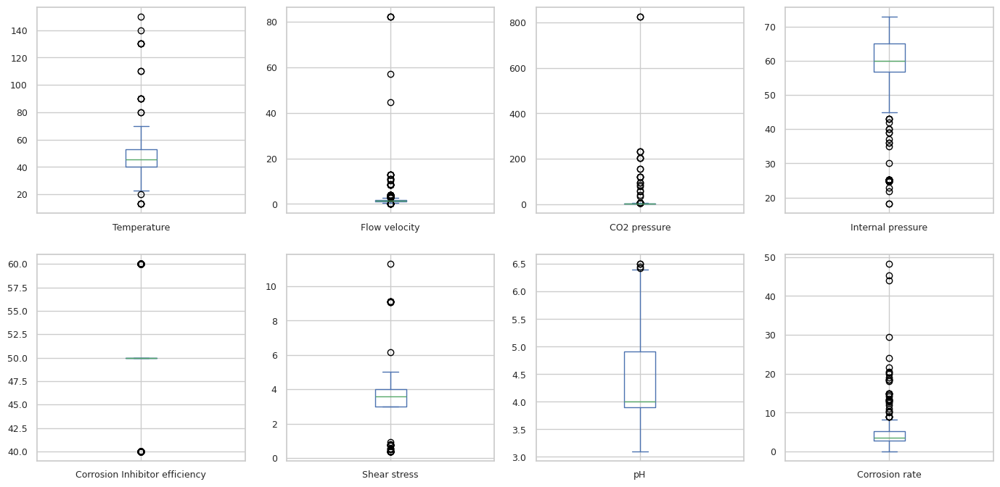

In [ ]:
#Visualization of original dataset for comparison before outlier removal
df_imputed.plot(kind='box', subplots=True, layout=(4,4), sharex=False, sharey=False,figsize=(17,17))
plt.show()

In [ ]:
#Check for outliers
def detect_outlier(df_imputed):
    List_outliers = []
    threshold=3
    mean = df_imputed.mean()
    std = df_imputed.std()
    for y in range(0, len(df_imputed.columns)):
        outliers = 0
        for x in range(0, len(df_imputed.index)):
            z_score= (df_imputed.iloc[x,y] - mean[y])/std[y]
            if abs(z_score) > threshold:
                outliers += 1
                List_outliers.append(df_imputed.columns[y])
        print("\n Column ", y, " has",outliers,"outliers")
    List_outliers = set(List_outliers)
    print("\nThe columns with outliers are as follows: \n", List_outliers)
    return outliers
out_X = detect_outlier(df_imputed)

/tmp/ipython-input-1284025518.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  z_score= (df_imputed.iloc[x,y] - mean[y])/std[y]



 Column  0  has 8 outliers

 Column  1  has 5 outliers

 Column  2  has 5 outliers

 Column  3  has 0 outliers

 Column  4  has 0 outliers

 Column  5  has 8 outliers

 Column  6  has 4 outliers

 Column  7  has 8 outliers

The columns with outliers are as follows: 
 {'Flow velocity', 'Shear stress', 'pH', 'Temperature', 'CO2 pressure', 'Corrosion rate'}


In [ ]:
#function to remove outliers

def detect_and_remove_outliers(df, threshold=3):
    """
    Detect and remove outliers from each column of the DataFrame based on the Z-score method.

    Parameters:
    df (pd.DataFrame): The input DataFrame with numeric columns
    threshold (float): The Z-score threshold for detecting outliers (default is 3)

    Returns:
    pd.DataFrame: A new DataFrame with outliers removed
    """
    # Calculate the mean and standard deviation for each column
    mean = df.mean()
    std = df.std()

    # Identify rows with outliers
    outliers_indices = []
    for col in df.columns:
        # Calculate Z-scores for the column
        z_scores = (df[col] - mean[col]) / std[col]

        # Find the indices where the Z-score exceeds the threshold
        outliers = df[abs(z_scores) > threshold].index
        outliers_indices.extend(outliers)

        # Print the number of outliers in each column
        print(f"Column '{col}' has {len(outliers)} outliers")

    # Remove duplicate indices and drop rows with outliers
    outliers_indices = list(set(outliers_indices))
    df_cleaned = df.drop(index=outliers_indices)

    # Display summary of columns with detected outliers
    print("\nColumns with detected outliers and the total outliers removed:")
    for col in df.columns:
        col_outliers = len(df[(df[col] - mean[col]).abs() > threshold * std[col]])
        print(f"Column '{col}': {col_outliers} outliers removed")

    return df_cleaned

# Apply function to detect and remove outliers
cleaned_df = detect_and_remove_outliers(df_imputed)

Column 'Temperature' has 8 outliers
Column 'Flow velocity' has 5 outliers
Column 'CO2 pressure' has 5 outliers
Column 'Internal pressure' has 0 outliers
Column 'Corrosion Inhibitor efficiency' has 0 outliers
Column 'Shear stress' has 8 outliers
Column 'pH' has 4 outliers
Column 'Corrosion rate' has 8 outliers

Columns with detected outliers and the total outliers removed:
Column 'Temperature': 8 outliers removed
Column 'Flow velocity': 5 outliers removed
Column 'CO2 pressure': 5 outliers removed
Column 'Internal pressure': 0 outliers removed
Column 'Corrosion Inhibitor efficiency': 0 outliers removed
Column 'Shear stress': 8 outliers removed
Column 'pH': 4 outliers removed
Column 'Corrosion rate': 8 outliers removed


In [ ]:
cleaned_df.info()
df_cleaned = cleaned_df.copy() #for checking the imbalance of the corrosion data

<class 'pandas.core.frame.DataFrame'>
Index: 394 entries, 0 to 426
Data columns (total 8 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Temperature                     394 non-null    float64
 1   Flow velocity                   394 non-null    float64
 2   CO2 pressure                    394 non-null    float64
 3   Internal pressure               394 non-null    float64
 4   Corrosion Inhibitor efficiency  394 non-null    float64
 5   Shear stress                    394 non-null    float64
 6   pH                              394 non-null    float64
 7   Corrosion rate                  394 non-null    float64
dtypes: float64(8)
memory usage: 27.7 KB


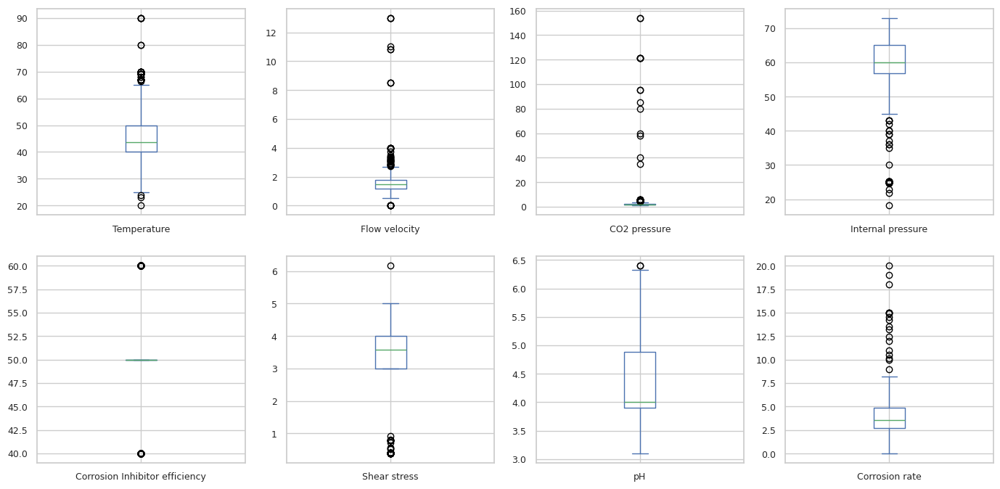

In [ ]:
#Visualization of original dataset for comparison before outlier removal
cleaned_df.plot(kind='box', subplots=True, layout=(4,4), sharex=False, sharey=False,figsize=(17,17))
plt.show()

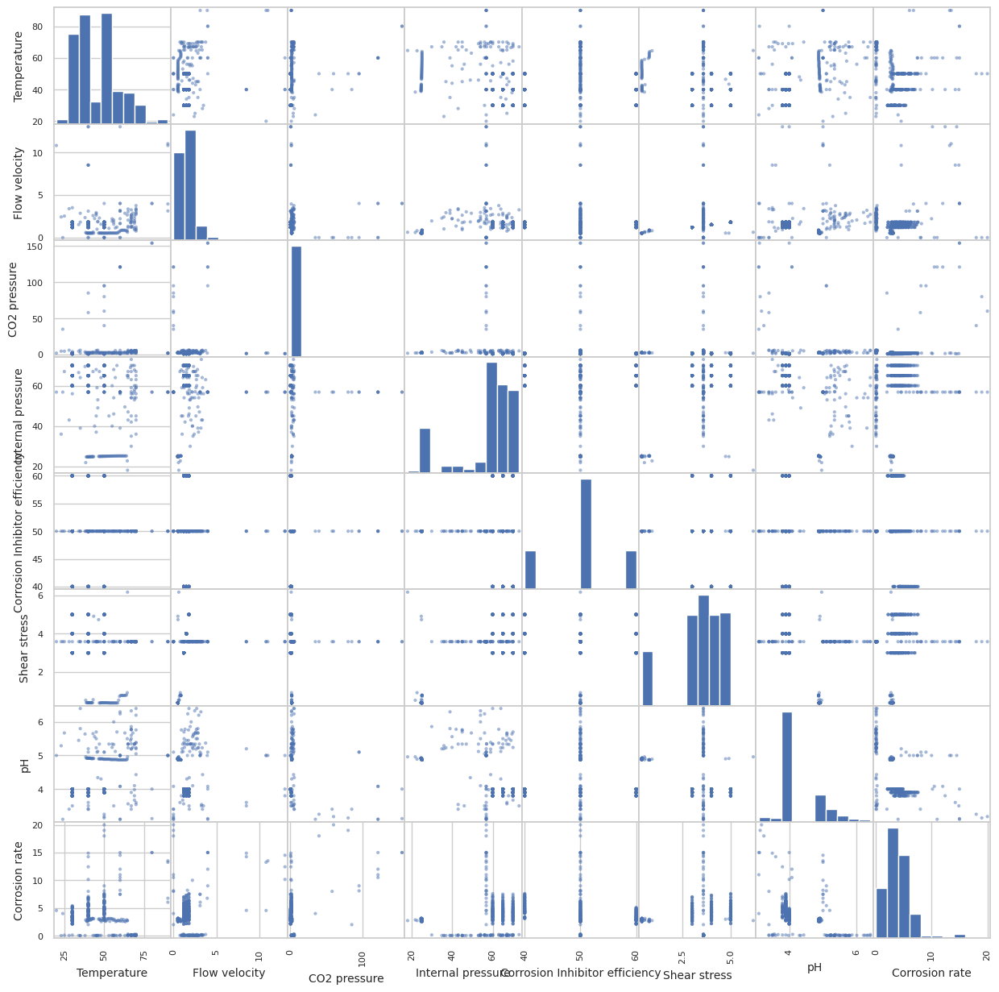

In [ ]:
scatter_matrix(cleaned_df,figsize=(15,15))
plt.show()

In [ ]:
cleaned_df.describe()

,Temperature,Flow velocity,CO2 pressure,Internal pressure,Corrosion Inhibitor efficiency,Shear stress,pH,Corrosion rate
count,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000
mean,45.894975,1.725477,5.390882,57.481743,50.000000,3.466631,4.282944,3.906107
std,12.928261,1.581124,18.745783,14.431815,6.420387,1.318907,0.657237,2.988403
min,20.000000,0.000000,0.900000,18.122800,40.000000,0.385000,3.100000,0.022000
25%,40.000000,1.200000,1.500000,56.820997,50.000000,3.000000,3.900000,2.700000
50%,43.710000,1.500000,2.000000,60.000000,50.000000,3.584149,4.000000,3.600000
75%,50.000000,1.800000,2.499850,65.000000,50.000000,4.000000,4.890000,4.900000
max,90.000000,13.000000,154.000000,73.000000,60.000000,6.170000,6.400000,20.000000


<Axes: xlabel='Corrosion rate', ylabel='Count'>

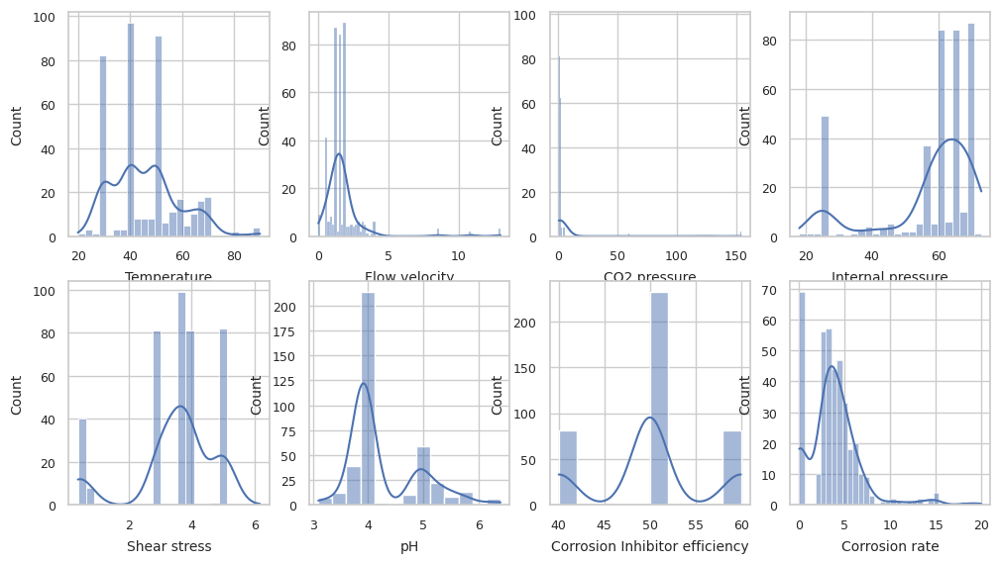

In [ ]:
plt.figure(1, figsize=(12, 10))

plt.figure(1)
plt.subplot(341)
sns.histplot(cleaned_df['Temperature'], kde=True)

plt.subplot(342)
sns.histplot(cleaned_df['Flow velocity'], kde=True)

plt.subplot(343)
sns.histplot(cleaned_df['CO2 pressure'], kde=True)

plt.subplot(344)
sns.histplot(cleaned_df['Internal pressure'], kde=True)

plt.subplot(345)
sns.histplot(cleaned_df['Shear stress'], kde=True)

plt.subplot(346)
sns.histplot(cleaned_df['pH'], kde=True)

plt.subplot(347)
sns.histplot(cleaned_df['Corrosion Inhibitor efficiency'], kde=True)

plt.subplot(348)
sns.histplot(cleaned_df['Corrosion rate'], kde=True)

In [ ]:
cleaned_df.corr().round(4)

,Temperature,Flow velocity,CO2 pressure,Internal pressure,Corrosion Inhibitor efficiency,Shear stress,pH,Corrosion rate
Temperature,1.0000,0.1517,0.2042,-0.2692,0.0000,-0.1866,0.4544,-0.0294
Flow velocity,0.1517,1.0000,0.0244,0.1494,0.0000,0.2373,0.0972,0.3052
CO2 pressure,0.2042,0.0244,1.0000,-0.0257,0.0000,0.0033,-0.1263,0.4695
Internal pressure,-0.2692,0.1494,-0.0257,1.0000,-0.0000,0.7406,-0.5061,0.1712
Corrosion Inhibitor efficiency,0.0000,0.0000,0.0000,-0.0000,1.0000,-0.0000,0.0000,-0.1881
Shear stress,-0.1866,0.2373,0.0033,0.7406,-0.0000,1.0000,-0.3722,0.1482
pH,0.4544,0.0972,-0.1263,-0.5061,0.0000,-0.3722,1.0000,-0.4875
Corrosion rate,-0.0294,0.3052,0.4695,0.1712,-0.1881,0.1482,-0.4875,1.0000


<Figure size 640x480 with 0 Axes>

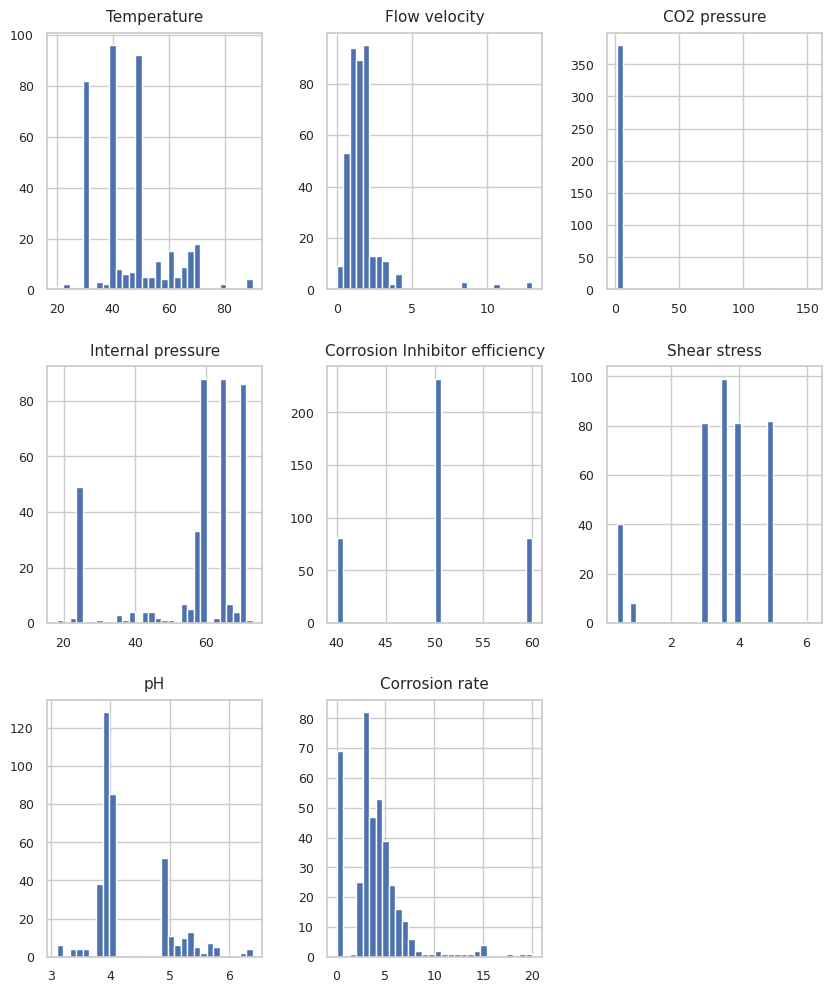

In [ ]:
plt.tight_layout()
cleaned_df.hist(bins = 30, figsize = (10,12))
plt.show()

In [ ]:
#Data Visualization
ave_qu = cleaned_df.groupby("Corrosion rate").mean()
ave_qu.head(10)

,Temperature,Flow velocity,CO2 pressure,Internal pressure,Corrosion Inhibitor efficiency,Shear stress,pH
Corrosion rate,,,,,,,
0.0220,35.0,2.850,2.200,39.00,50.0,3.584149,5.800
0.0245,56.0,1.820,2.600,46.00,50.0,3.584149,3.500
0.0260,45.0,2.920,2.200,37.00,50.0,3.584149,5.230
0.0280,35.0,1.810,6.000,64.00,50.0,3.584149,6.400
0.0290,40.5,1.825,3.335,53.00,50.0,3.584149,5.495
0.0310,55.0,2.200,2.000,40.00,50.0,3.584149,5.240
0.0350,45.0,2.620,5.400,45.00,50.0,3.584149,5.700
0.0410,44.5,2.240,2.950,60.00,50.0,3.584149,5.385
0.0430,70.0,0.928,3.200,45.00,50.0,3.584149,5.760


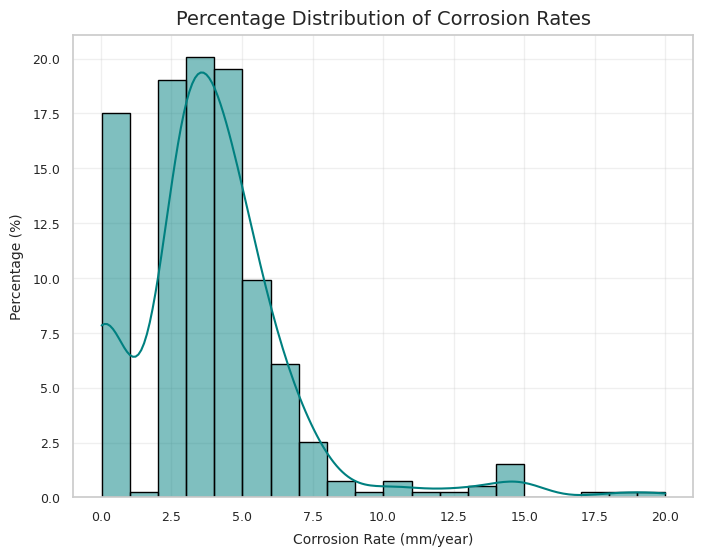

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Example: replace with your actual dataframe and corrosion column
# df = pd.read_csv("merged_corrosion_dataset_em_gmm_imputed.csv")

plt.figure(figsize=(8,6))
sns.histplot(df_cleaned["Corrosion rate"], bins=20, stat="percent", kde=True, color="teal", edgecolor="black")

plt.title("Percentage Distribution of Corrosion Rates", fontsize=14)
plt.xlabel("Corrosion Rate (mm/year)")
plt.ylabel("Percentage (%)")
plt.grid(alpha=0.3)
plt.show()

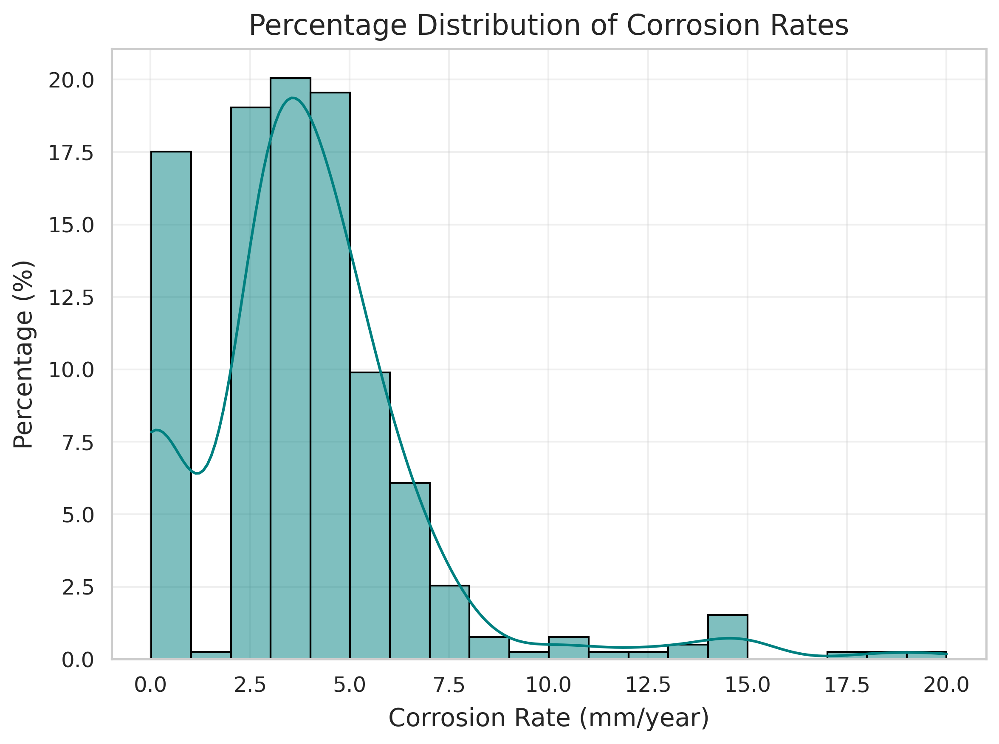

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

plt.rcParams['figure.dpi'] = 300

plt.figure(figsize=(8,6))
sns.histplot(df_cleaned["Corrosion rate"], bins=20, stat="percent", kde=True, color="teal", edgecolor="black")
plt.title("Percentage Distribution of Corrosion Rates", fontsize=16)
plt.xlabel("Corrosion Rate (mm/year)", fontsize=14)
plt.ylabel("Percentage (%)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('corrosion_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

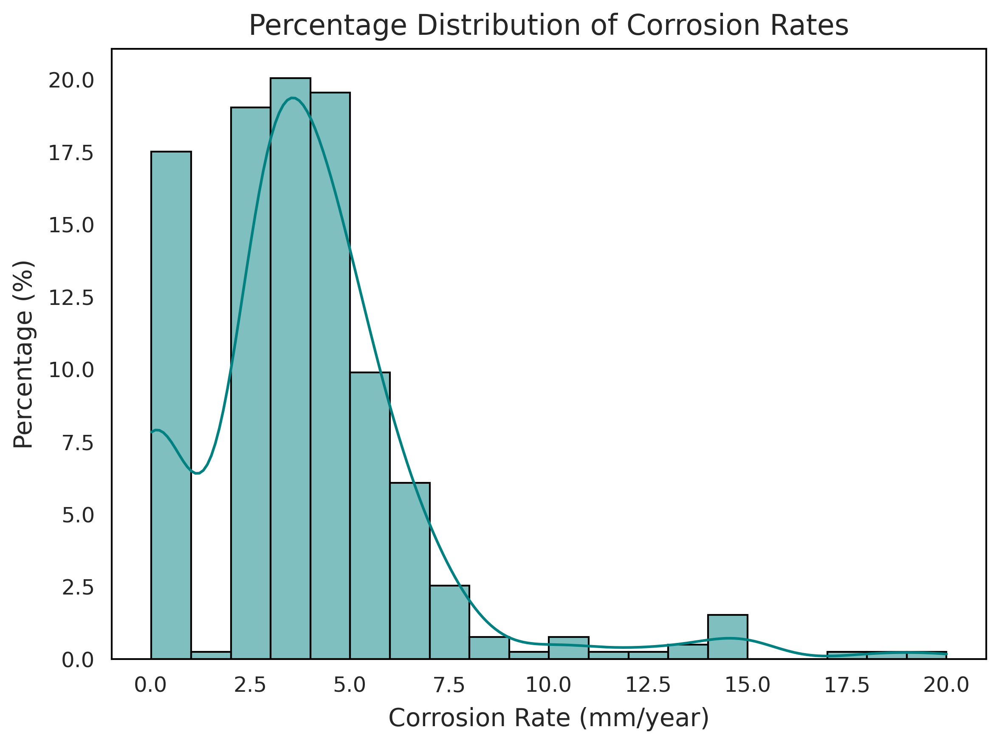

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

plt.rcParams['figure.dpi'] = 300

fig, ax = plt.subplots(figsize=(8,6))
sns.histplot(df_cleaned["Corrosion rate"], bins=20, stat="percent", kde=True, color="teal", edgecolor="black", ax=ax)
plt.title("Percentage Distribution of Corrosion Rates", fontsize=16)
plt.xlabel("Corrosion Rate (mm/year)", fontsize=14)
plt.ylabel("Percentage (%)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)

# Set black box (spines) around plot
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1.0)

plt.tight_layout()
plt.savefig('corrosion_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

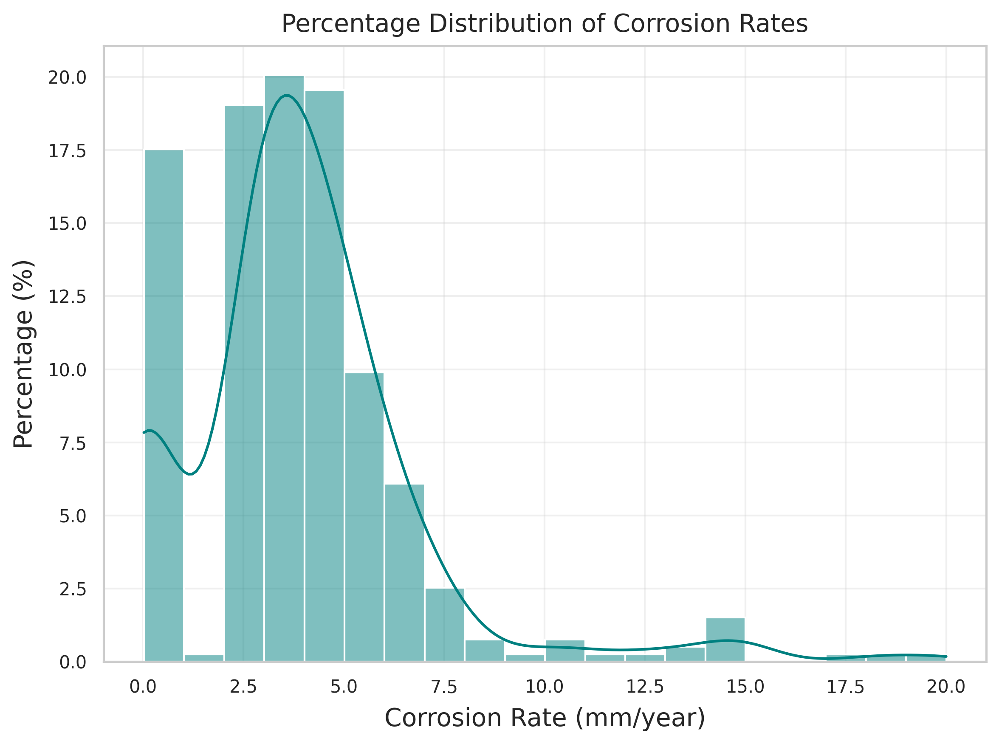

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set resolution
plt.rcParams['figure.dpi'] = 300

plt.figure(figsize=(8,6))
sns.histplot(df_cleaned["Corrosion rate"], bins=20, stat="percent", kde=True, color="teal")
plt.title("Percentage Distribution of Corrosion Rates", fontsize=14)
plt.xlabel("Corrosion Rate (mm/year)")
plt.ylabel("Percentage (%)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('corrosion_distribution.png', dpi=300, bbox_inches='tight')  # Save high-res
plt.show()

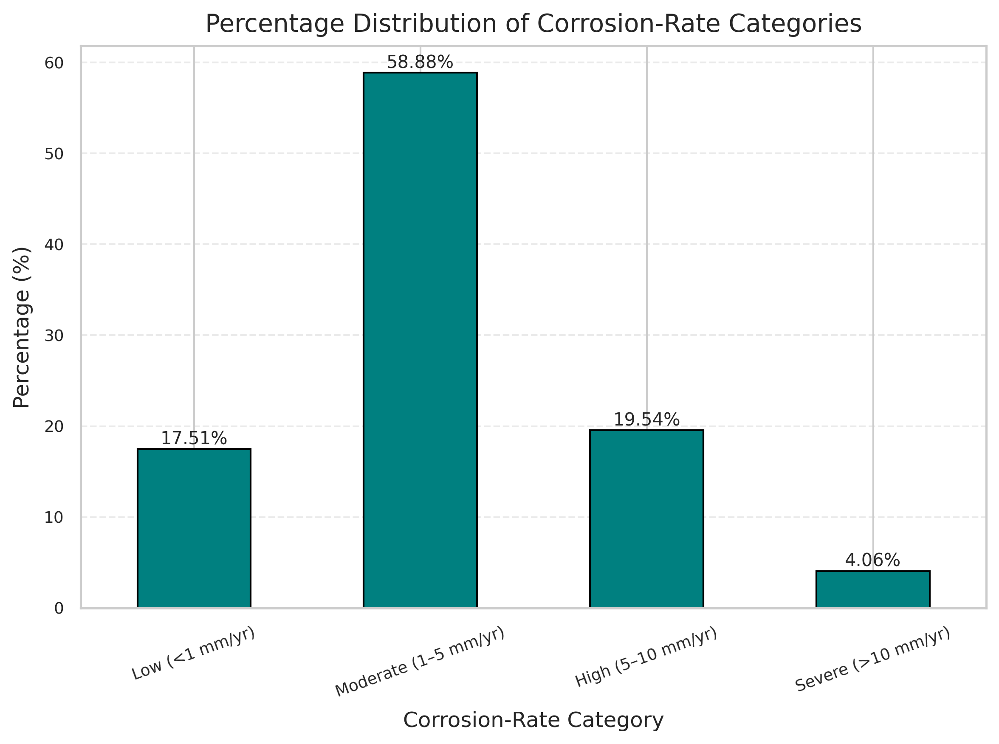

In [ ]:
# Define corrosion-rate ranges (in mm/year)
bins = [0, 1, 5, 10, df_cleaned["Corrosion rate"].max()]
labels = ["Low (<1 mm/yr)", "Moderate (1–5 mm/yr)",
          "High (5–10 mm/yr)", "Severe (>10 mm/yr)"]

# Create categorical bins
df_cleaned["Rate Category"] = pd.cut(df_cleaned["Corrosion rate"],
                             bins=bins,
                             labels=labels,
                             include_lowest=True)

# Compute percentage distribution
rate_percent = df_cleaned["Rate Category"].value_counts(normalize=True).sort_index() * 100

# Plot as bar chart
plt.figure(figsize=(8,6))
rate_percent.plot(kind="bar", color="teal", edgecolor="black")

# Add annotations (exact % on each bar)
for idx, value in enumerate(rate_percent):
    plt.text(idx, value + 0.5, f"{value:.2f}%", ha='center', fontsize=10)

plt.title("Percentage Distribution of Corrosion-Rate Categories", fontsize=14)
plt.ylabel("Percentage (%)", fontsize=12)
plt.xlabel("Corrosion-Rate Category", fontsize=12)
plt.xticks(rotation=20)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


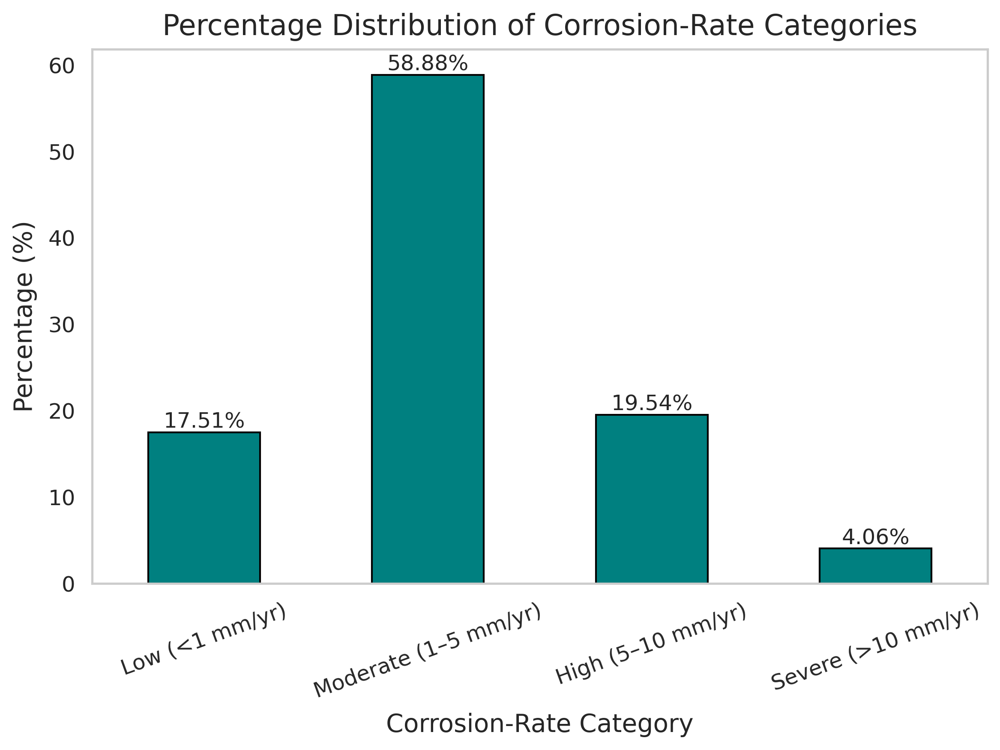

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

plt.rcParams['figure.dpi'] = 300

# Define corrosion-rate ranges (in mm/year)
bins = [0, 1, 5, 10, df_cleaned["Corrosion rate"].max()]
labels = ["Low (<1 mm/yr)", "Moderate (1–5 mm/yr)",
          "High (5–10 mm/yr)", "Severe (>10 mm/yr)"]

# Create categorical bins
df_cleaned["Rate Category"] = pd.cut(df_cleaned["Corrosion rate"],
                             bins=bins,
                             labels=labels,
                             include_lowest=True)

# Compute percentage distribution
rate_percent = df_cleaned["Rate Category"].value_counts(normalize=True).sort_index() * 100

# Plot as bar chart
plt.figure(figsize=(8,6))
rate_percent.plot(kind="bar", color="teal", edgecolor="black")

# Add annotations (exact % on each bar)
for idx, value in enumerate(rate_percent):
    plt.text(idx, value + 0.5, f"{value:.2f}%", ha='center', fontsize=12)

plt.title("Percentage Distribution of Corrosion-Rate Categories", fontsize=16)
plt.ylabel("Percentage (%)", fontsize=14)
plt.xlabel("Corrosion-Rate Category", fontsize=14)
plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.savefig('corrosion_categories.png', dpi=300, bbox_inches='tight')
plt.show()

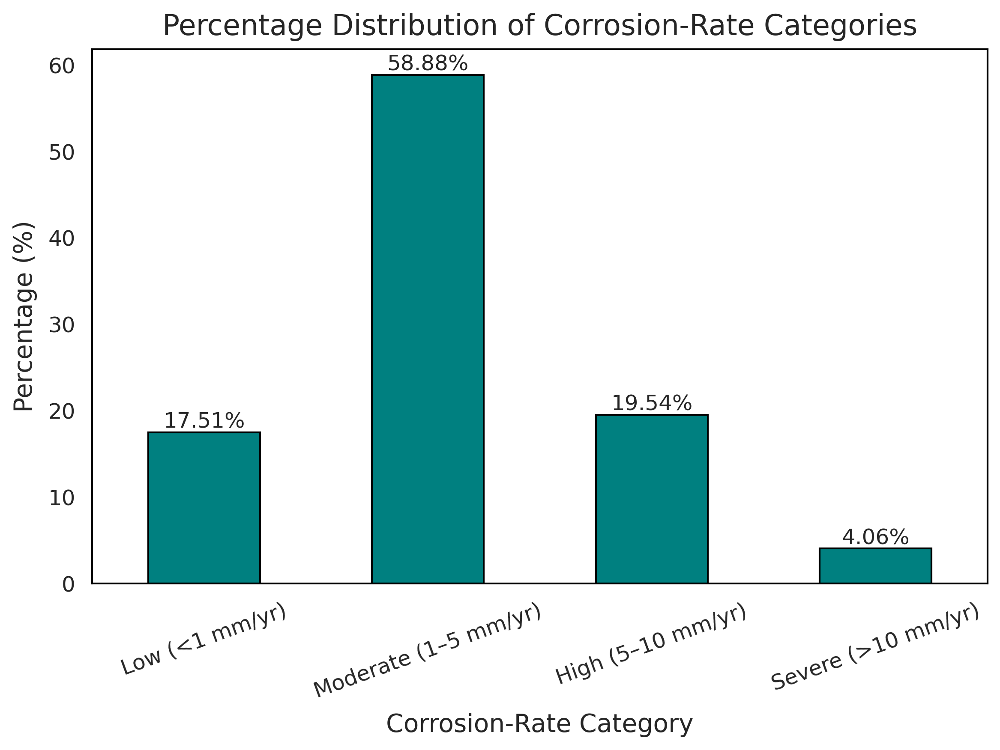

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

plt.rcParams['figure.dpi'] = 300

# Define corrosion-rate ranges (in mm/year)
bins = [0, 1, 5, 10, df_cleaned["Corrosion rate"].max()]
labels = ["Low (<1 mm/yr)", "Moderate (1–5 mm/yr)",
          "High (5–10 mm/yr)", "Severe (>10 mm/yr)"]

# Create categorical bins
df_cleaned["Rate Category"] = pd.cut(df_cleaned["Corrosion rate"],
                             bins=bins,
                             labels=labels,
                             include_lowest=True)

# Compute percentage distribution
rate_percent = df_cleaned["Rate Category"].value_counts(normalize=True).sort_index() * 100

# Plot as bar chart
fig, ax = plt.subplots(figsize=(8,6))
rate_percent.plot(kind="bar", color="teal", edgecolor="black", ax=ax)

# Add annotations (exact % on each bar)
for idx, value in enumerate(rate_percent):
    plt.text(idx, value + 0.5, f"{value:.2f}%", ha='center', fontsize=12)

plt.title("Percentage Distribution of Corrosion-Rate Categories", fontsize=16)
plt.ylabel("Percentage (%)", fontsize=14)
plt.xlabel("Corrosion-Rate Category", fontsize=14)
plt.xticks(rotation=20, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)

# Set black box (spines) around plot
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1.0)

plt.tight_layout()
plt.savefig('corrosion_categories.png', dpi=300, bbox_inches='tight')
plt.show()

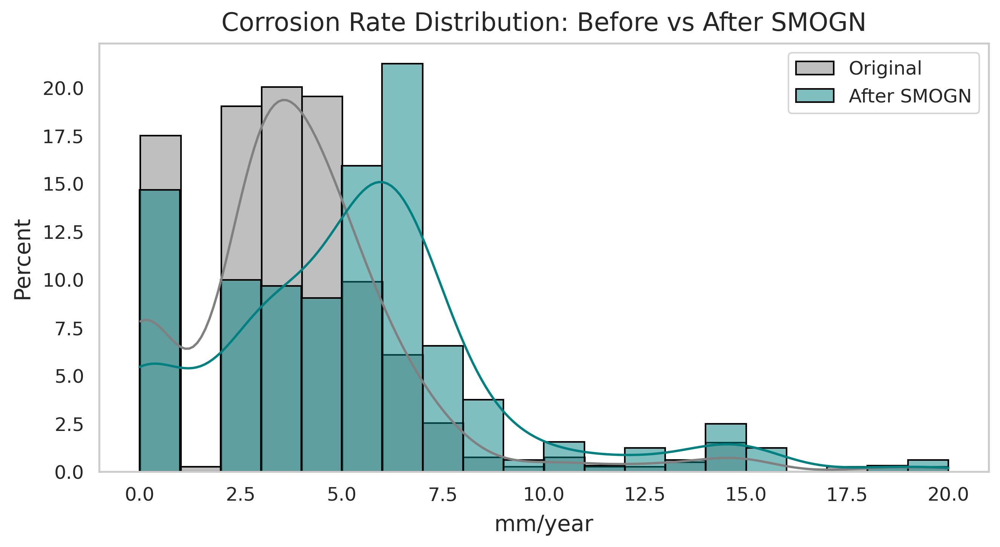

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['figure.dpi'] = 300

plt.figure(figsize=(9,5))
sns.histplot(cleaned_df["Corrosion rate"], stat="percent", bins=20, kde=True, label="Original", color="gray", edgecolor="black")
sns.histplot(cleaned_df_smogn["Corrosion rate"], stat="percent", bins=20, kde=True, label="After SMOGN", color="teal", edgecolor="black")
plt.legend(fontsize=12)
plt.title("Corrosion Rate Distribution: Before vs After SMOGN", fontsize=16)
plt.xlabel("mm/year", fontsize=14)
plt.ylabel("Percent", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.savefig('smogn_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

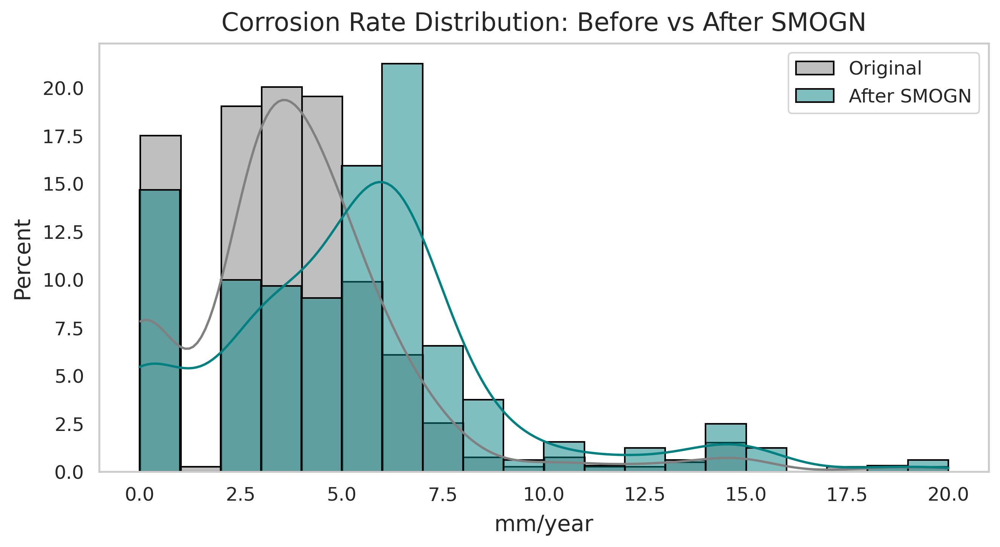

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['figure.dpi'] = 300

plt.figure(figsize=(9,5))
sns.histplot(cleaned_df["Corrosion rate"], stat="percent", bins=20, kde=True, label="Original", color="gray", edgecolor="black")
sns.histplot(cleaned_df_smogn["Corrosion rate"], stat="percent", bins=20, kde=True, label="After SMOGN", color="teal", edgecolor="black")
plt.legend(fontsize=12)
plt.title("Corrosion Rate Distribution: Before vs After SMOGN", fontsize=16)
plt.xlabel("mm/year", fontsize=14)
plt.ylabel("Percent", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.savefig('smogn_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

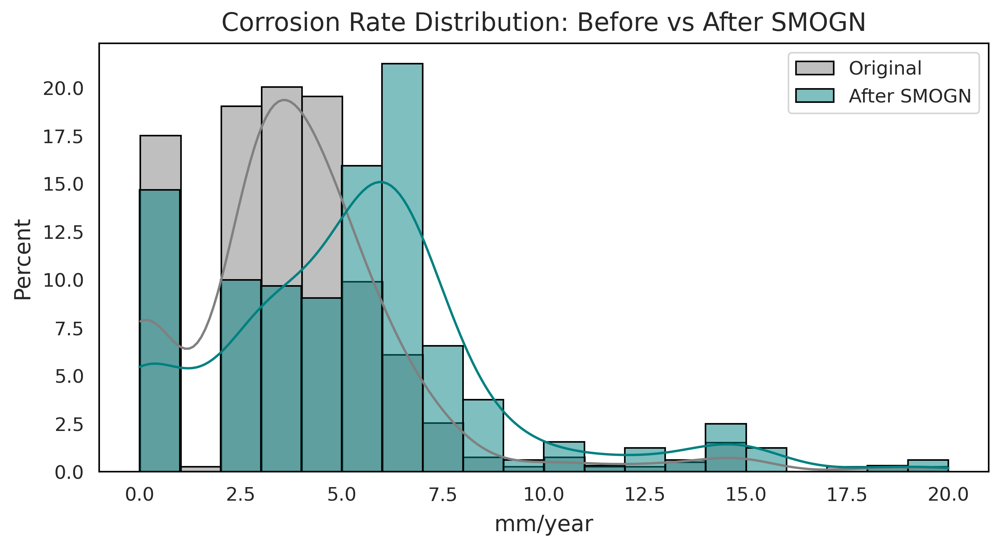

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['figure.dpi'] = 300

fig, ax = plt.subplots(figsize=(9,5))
sns.histplot(cleaned_df["Corrosion rate"], stat="percent", bins=20, kde=True, label="Original", color="gray", edgecolor="black", ax=ax)
sns.histplot(cleaned_df_smogn["Corrosion rate"], stat="percent", bins=20, kde=True, label="After SMOGN", color="teal", edgecolor="black", ax=ax)
plt.legend(fontsize=12)
plt.title("Corrosion Rate Distribution: Before vs After SMOGN", fontsize=16)
plt.xlabel("mm/year", fontsize=14)
plt.ylabel("Percent", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)

# Set black box (spines) around plot
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1.0)

plt.tight_layout()
plt.savefig('smogn_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# ave_qu.plot(kind="bar",figsize=(40,30))
# plt.legend(fontsize=20)

<Axes: xlabel='Corrosion rate'>

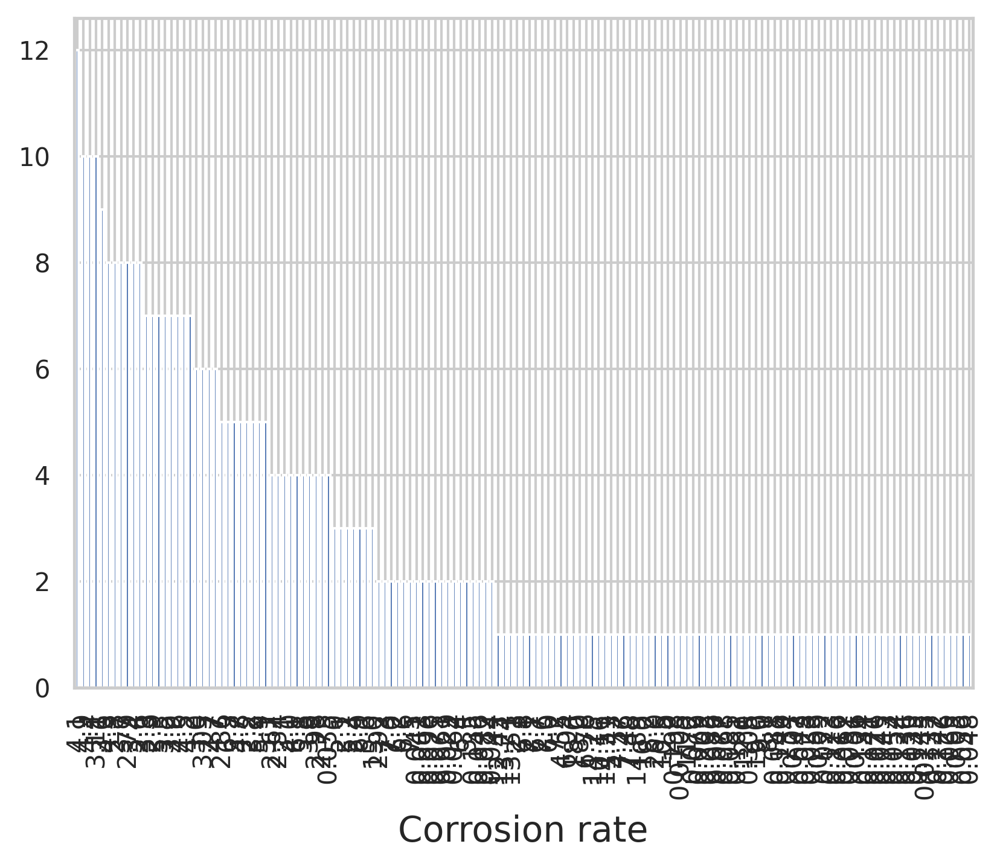

In [ ]:
cleaned_df['Corrosion rate'].value_counts()
cleaned_df['Corrosion rate'].value_counts().plot.bar()

In [ ]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 394 entries, 0 to 426
Data columns (total 8 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Temperature                     394 non-null    float64
 1   Flow velocity                   394 non-null    float64
 2   CO2 pressure                    394 non-null    float64
 3   Internal pressure               394 non-null    float64
 4   Corrosion Inhibitor efficiency  394 non-null    float64
 5   Shear stress                    394 non-null    float64
 6   pH                              394 non-null    float64
 7   Corrosion rate                  394 non-null    float64
dtypes: float64(8)
memory usage: 27.7 KB


In [ ]:
#Correlation
cleaned_df.corr().sum()

,0
Temperature,1.325176
Flow velocity,1.965164
CO2 pressure,1.549363
Internal pressure,1.260277
Corrosion Inhibitor efficiency,0.811946
Shear stress,1.570575
pH,0.059448
Corrosion rate,1.389088


<Figure size 450000x450000 with 0 Axes>

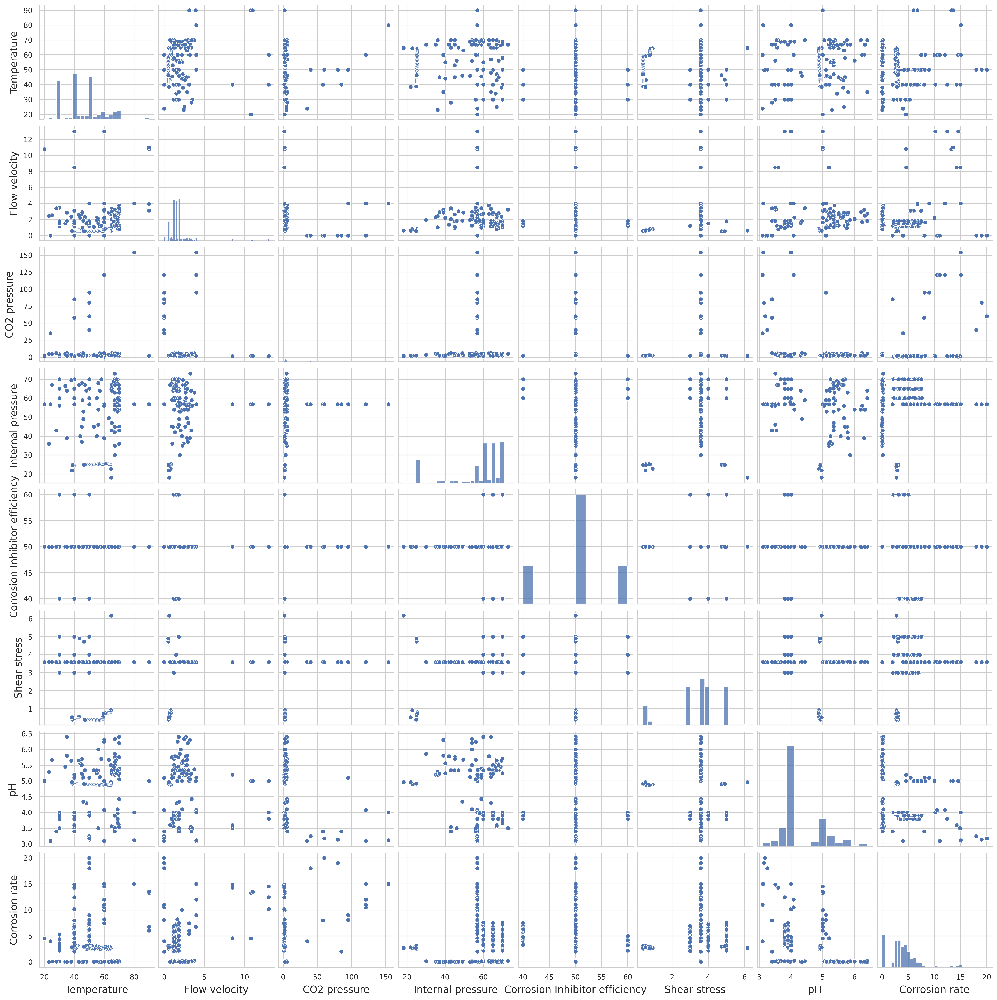

In [ ]:
plt.figure(figsize = (1500,1500))
sns.pairplot(cleaned_df)
plt.show()

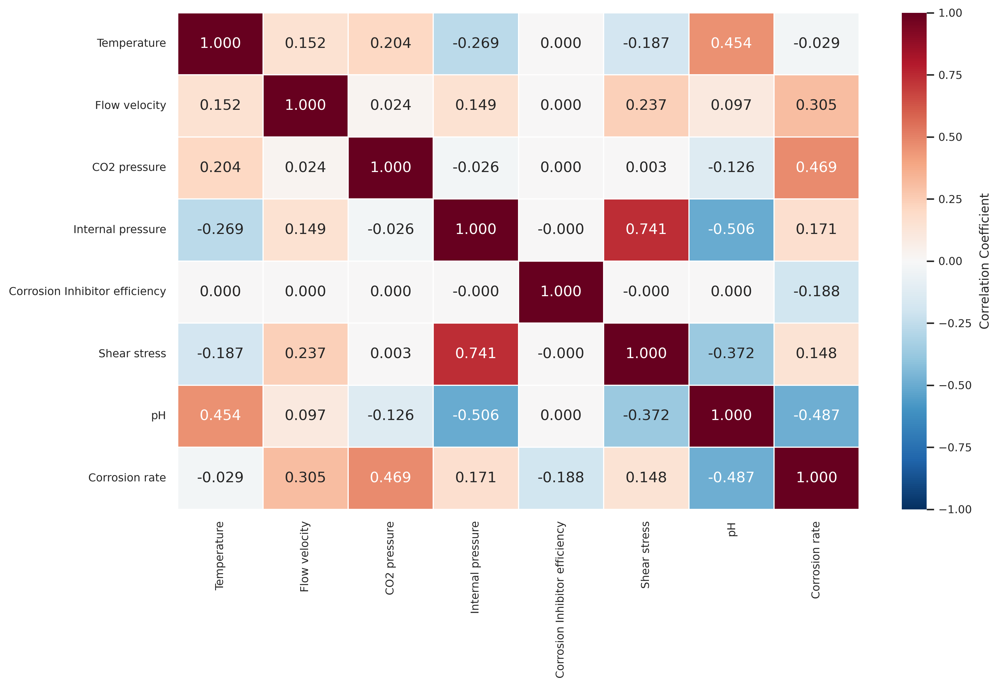

In [ ]:
# plt.figure(figsize = (12,8))
# sns.heatmap(cleaned_df.corr(), annot = True)
# plt.show()

# # Round correlation values to 4 decimal places
# corr_matrix = cleaned_df.corr().round(4)

# sns.heatmap(corr_matrix, annot=True, fmt=".4f", cmap="coolwarm", linewidths=0.5)

# plt.title("Correlation Heatmap (4 Decimal Places)", fontsize=14)
# plt.show()

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Compute and round correlation matrix
corr_matrix = cleaned_df.corr().round(3)

# Create heatmap with diverging color map centered at 0
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".3f",
    cmap="RdBu_r",         # Diverging palette (red = strong positive, blue = strong negative)
    center=0,              # Center color scale at zero correlation
    linewidths=0.5,
    vmin=-1, vmax=1,       # Full correlation range
    cbar_kws={'label': 'Correlation Coefficient'}
)

#plt.title("Correlation Heatmap (4 Decimal Places, Highlighting Strong Correlations)", fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
corr_matrix = cleaned_df.corr().abs()
print(); print(corr_matrix)


                                 Temperature  Flow velocity  CO2 pressure  \
Temperature                     1.000000e+00   1.517367e-01  2.042128e-01   
Flow velocity                   1.517367e-01   1.000000e+00  2.438160e-02   
CO2 pressure                    2.042128e-01   2.438160e-02  1.000000e+00   
Internal pressure               2.691593e-01   1.493796e-01  2.568626e-02   
Corrosion Inhibitor efficiency  2.294601e-16   1.270835e-16  1.834888e-16   
Shear stress                    1.865962e-01   2.373278e-01  3.314952e-03   
pH                              4.543765e-01   9.717941e-02  1.263446e-01   
Corrosion rate                  2.939495e-02   3.051584e-01  4.694849e-01   

                                Internal pressure  \
Temperature                          2.691593e-01   
Flow velocity                        1.493796e-01   
CO2 pressure                         2.568626e-02   
Internal pressure                    1.000000e+00   
Corrosion Inhibitor efficiency       4.4

In [ ]:
# #Distribution plot
# import seaborn as sb
# sb.distplot(cleaned_df['Corrosion rate'], color = 'r')
# plt.title('Corrosion Rate Distribution', fontsize = 16)
# plt.xlabel('Corrosion Rate', fontsize = 14)
# plt.ylabel('Frequency', fontsize = 14)
# plt.xticks(fontsize = 12)
# plt.yticks(fontsize = 12)

# #plt.savefig('distplot.png')
# plt.show()

# Statistical Methods of removing Highly correlated values & Feature Selection (VIF)

In [ ]:
# !pip install smote-variants


In [ ]:
#Testing without SMOGN
cleaned_no_smogn = cleaned_df.copy()

In [ ]:
## install pypi release
#pip install smogn

## install developer version
!pip install git+https://github.com/nickkunz/smogn.git

  Cloning https://github.com/nickkunz/smogn.git to /tmp/pip-req-build-jekmpekw
  Running command git clone --filter=blob:none --quiet https://github.com/nickkunz/smogn.git /tmp/pip-req-build-jekmpekw
  Resolved https://github.com/nickkunz/smogn.git to commit e4e5e4aca43a07ebbd1a0ed881f4de1e24abb8ed
  Preparing metadata (setup.py) ... done
  Created wheel for smogn: filename=smogn-0.1.1-py3-none-any.whl size=31239 sha256=0396a7dcd640e99a6e3f039f4aa4764f92276a67b156477879815a5bf2e507f8
  Stored in directory: /tmp/pip-ephem-wheel-cache-g04q4wsk/wheels/26/8d/f6/7e981fdf27d3539f1be795636a712705b1554db65cbc86ace6
Successfully built smogn


In [ ]:
## load libraries
import smogn
import pandas
import seaborn

# Separate features and target
X = cleaned_df.drop(columns=['Corrosion rate'])
y = cleaned_df['Corrosion rate']

## conduct smogn
cleaned_df_smogn = smogn.smoter(
    data = cleaned_df,
    y = "Corrosion rate",
    k = 7,                    ## positive integer (k < n)
    pert = 0.04,              ## real number (0 < R < 1)
    samp_method = 'balance',  ## string ('balance' or 'extreme')

    ## phi relevance arguments
    rel_thres = 0.80,         ## positive real number (0 < R < 1)
    rel_method = 'auto',      ## string ('auto' or 'manual')
    rel_xtrm_type = 'both',   ## string ('low' or 'both' or 'high')
    rel_coef = 2.5
)
print("Original samples:", len(cleaned_df))
print("Resampled samples:", len(cleaned_df_smogn))


r_index: 100%|##########| 17/17 [00:00<00:00, 616.44it/s]

Original samples: 394
Resampled samples: 376


In [ ]:
## conduct smogn
cleaned_df_smogn = smogn.smoter(
    data = cleaned_df,
    y = "Corrosion rate",
    k = 7,                    ## positive integer (k < n)
    pert = 0.04,              ## real number (0 < R < 1)
    samp_method = 'balance',  ## string ('balance' or 'extreme')

    ## phi relevance arguments
    rel_thres = 0.20,         ## positive real number (0 < R < 1)
    rel_method = 'auto',      ## string ('auto' or 'manual')
    rel_xtrm_type = 'both',   ## string ('low' or 'both' or 'high')
    rel_coef = 2.5
)
print("Original samples:", len(cleaned_df))
print("Resampled samples:", len(cleaned_df_smogn))


r_index: 100%|##########| 49/49 [00:00<00:00, 831.84it/s]

Original samples: 394
Resampled samples: 320


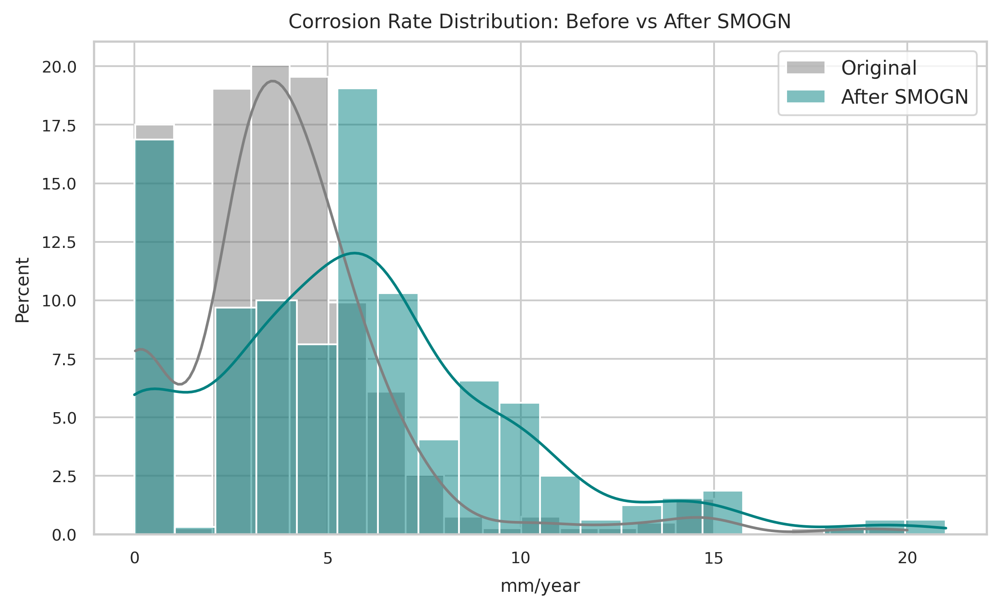

In [ ]:
import seaborn as sns, matplotlib.pyplot as plt

plt.figure(figsize=(9,5))
sns.histplot(cleaned_df["Corrosion rate"], stat="percent", bins=20, kde=True, label="Original", color="gray")
sns.histplot(cleaned_df_smogn["Corrosion rate"], stat="percent", bins=20, kde=True, label="After SMOGN", color="teal")
plt.legend(); plt.title("Corrosion Rate Distribution: Before vs After SMOGN"); plt.xlabel("mm/year"); plt.ylabel("Percent")
plt.show()

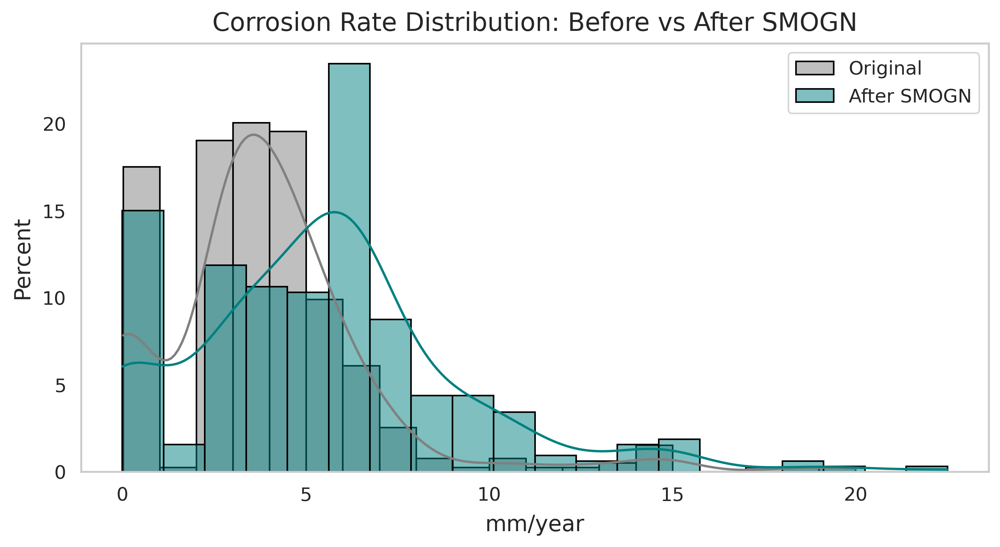

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['figure.dpi'] = 300

plt.figure(figsize=(9,5))
sns.histplot(cleaned_df["Corrosion rate"], stat="percent", bins=20, kde=True, label="Original", color="gray", edgecolor="black")
sns.histplot(cleaned_df_smogn["Corrosion rate"], stat="percent", bins=20, kde=True, label="After SMOGN", color="teal", edgecolor="black")
plt.legend(fontsize=12)
plt.title("Corrosion Rate Distribution: Before vs After SMOGN", fontsize=16)
plt.xlabel("mm/year", fontsize=14)
plt.ylabel("Percent", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.savefig('smogn_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
#import pandas as pd

def band_pct(df):
    bins = [0, 1, 5, 10, df["Corrosion rate"].max()]
    labels = ["Low(<1)", "Moderate(1–5)", "High(5–10)", "Severe(>10)"]
    s = pd.cut(df["Corrosion rate"], bins=bins, labels=labels, include_lowest=True)
    return (s.value_counts(normalize=True)*100).round(2)

print("Original distribution (%)")
print(band_pct(cleaned_df))
print("\nAfter SMOGN (%)")
print(band_pct(cleaned_df_smogn))


Original distribution (%)
Corrosion rate
Moderate(1–5)    58.88
High(5–10)       19.54
Low(<1)          17.51
Severe(>10)       4.06
Name: proportion, dtype: float64

After SMOGN (%)
Corrosion rate
High(5–10)       43.44
Moderate(1–5)    27.19
Low(<1)          16.88
Severe(>10)      12.50
Name: proportion, dtype: float64


In [ ]:
smogn.box_plot_stats(cleaned_df['Corrosion rate'])['stats']

/tmp/ipython-input-3190035669.py:1: DeprecationWarning: the `interpolation=` argument to quantile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  smogn.box_plot_stats(cleaned_df['Corrosion rate'])['stats']


array([0.022, 2.7  , 3.6  , 4.9  , 8.2  ])

In [ ]:
smogn.box_plot_stats(cleaned_df_smogn['Corrosion rate'])['stats']

/tmp/ipython-input-112305022.py:1: DeprecationWarning: the `interpolation=` argument to quantile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  smogn.box_plot_stats(cleaned_df_smogn['Corrosion rate'])['stats']


array([ 0.        ,  2.99      ,  5.7       ,  7.47      , 14.06135626])

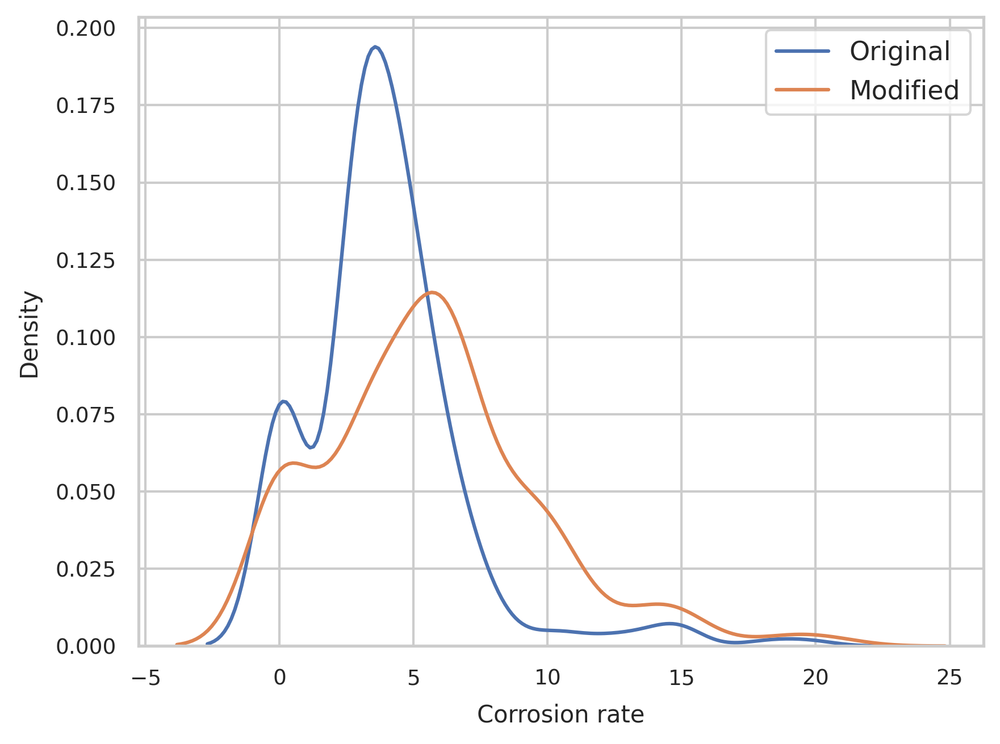

In [ ]:
## plot y distribution
seaborn.kdeplot(cleaned_df['Corrosion rate'], label = "Original")
seaborn.kdeplot(cleaned_df_smogn['Corrosion rate'], label = "Modified")
plt.legend()

In [ ]:
cleaned_df = cleaned_df_smogn.copy()

In [ ]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 320 entries, 0 to 420
Data columns (total 8 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Temperature                     320 non-null    float64
 1   Flow velocity                   320 non-null    float64
 2   CO2 pressure                    320 non-null    float64
 3   Internal pressure               320 non-null    float64
 4   Corrosion Inhibitor efficiency  320 non-null    float64
 5   Shear stress                    320 non-null    float64
 6   pH                              320 non-null    float64
 7   Corrosion rate                  320 non-null    float64
dtypes: float64(8)
memory usage: 22.5 KB


In [ ]:
cleaned_df.describe()

,Temperature,Flow velocity,CO2 pressure,Internal pressure,Corrosion Inhibitor efficiency,Shear stress,pH,Corrosion rate
count,320.000000,320.000000,320.000000,320.000000,320.000000,320.000000,320.000000,320.000000
mean,47.208620,2.090602,8.714533,60.315608,47.309589,3.718586,4.227149,5.633461
std,12.212635,2.089012,26.737604,10.757113,6.103790,1.014199,0.656282,4.042349
min,21.963641,0.000000,0.000000,24.742700,40.000000,0.385000,3.082229,0.000000
25%,40.000000,1.266225,1.500000,56.995388,40.000000,3.574031,3.900000,2.995000
50%,50.000000,1.500531,2.000000,61.752761,50.000000,3.584149,3.900000,5.700000
75%,50.000000,1.800000,2.504750,66.842378,50.000000,4.017333,4.870000,7.465000
max,90.000000,13.009593,154.727835,73.000000,60.000000,5.028415,6.400000,21.000000


In [ ]:
df_cleaned.describe()

,Temperature,Flow velocity,CO2 pressure,Internal pressure,Corrosion Inhibitor efficiency,Shear stress,pH,Corrosion rate
count,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000
mean,45.894975,1.725477,5.390882,57.481743,50.000000,3.466631,4.282944,3.906107
std,12.928261,1.581124,18.745783,14.431815,6.420387,1.318907,0.657237,2.988403
min,20.000000,0.000000,0.900000,18.122800,40.000000,0.385000,3.100000,0.022000
25%,40.000000,1.200000,1.500000,56.820997,50.000000,3.000000,3.900000,2.700000
50%,43.710000,1.500000,2.000000,60.000000,50.000000,3.584149,4.000000,3.600000
75%,50.000000,1.800000,2.499850,65.000000,50.000000,4.000000,4.890000,4.900000
max,90.000000,13.000000,154.000000,73.000000,60.000000,6.170000,6.400000,20.000000


In [ ]:
X_new = cleaned_df.copy()

In [ ]:
X_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 320 entries, 0 to 420
Data columns (total 8 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Temperature                     320 non-null    float64
 1   Flow velocity                   320 non-null    float64
 2   CO2 pressure                    320 non-null    float64
 3   Internal pressure               320 non-null    float64
 4   Corrosion Inhibitor efficiency  320 non-null    float64
 5   Shear stress                    320 non-null    float64
 6   pH                              320 non-null    float64
 7   Corrosion rate                  320 non-null    float64
dtypes: float64(8)
memory usage: 22.5 KB


<Figure size 3600x2400 with 0 Axes>

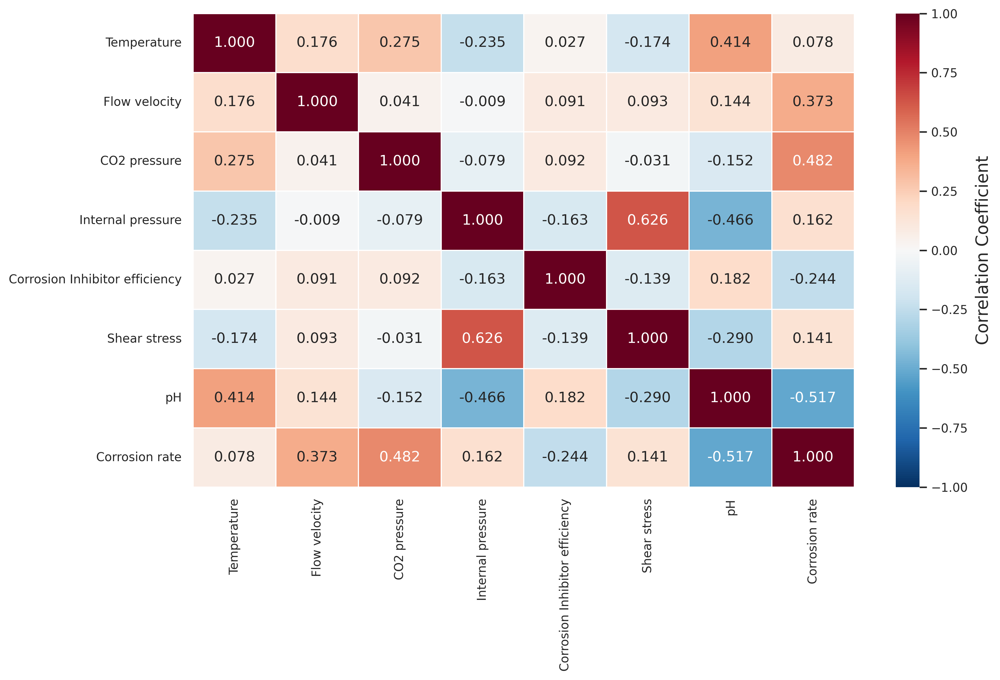

In [ ]:
plt.figure(figsize = (12,8))
# sns.heatmap(cleaned_df.corr(), annot = True)
# plt.show()

# # Round correlation values to 4 decimal places
# corr_matrix = cleaned_df.corr().round(4)

# sns.heatmap(corr_matrix, annot=True, fmt=".4f", cmap="coolwarm", linewidths=0.5)

# plt.title("Correlation Heatmap (4 Decimal Places)", fontsize=14)
# plt.show()

plt.figure(figsize=(12, 8))

# Compute and round correlation matrix
corr_matrix = X_new.corr().round(4)

# Create heatmap with diverging color map centered at 0
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",         # Diverging palette (red = strong positive, blue = strong negative)
    center=0,              # Center color scale at zero correlation
    linewidths=0.5,
    vmin=-1, vmax=1,       # Full correlation range
    cbar_kws={'label': 'Correlation Coefficient'}
)

#plt.title("Correlation Heatmap (4 Decimal Places, Highlighting Strong Correlations)", fontsize=14)
plt.tight_layout()
plt.show()


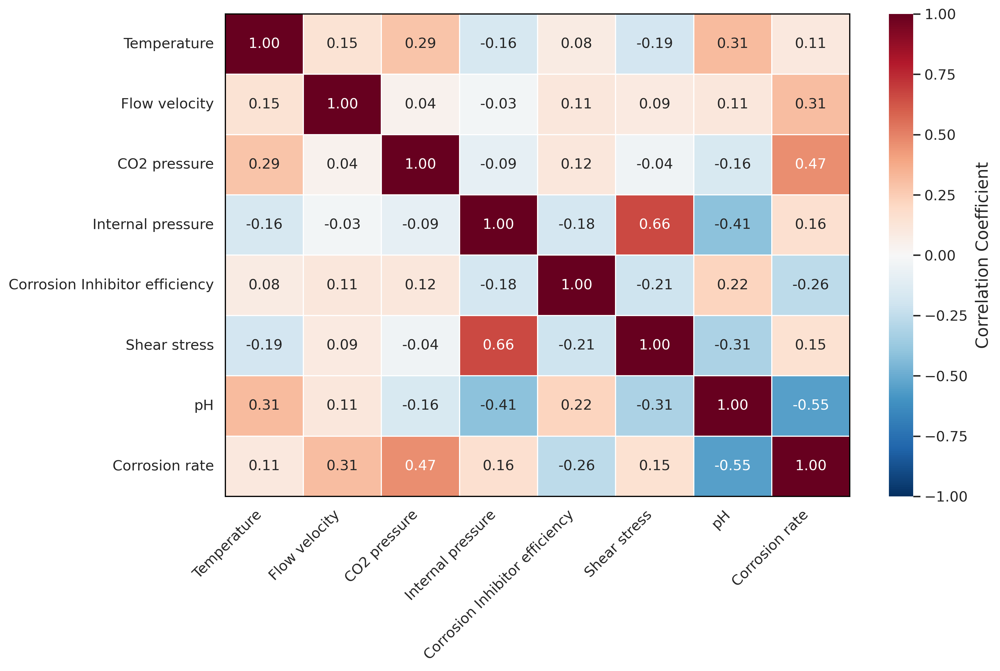

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['figure.dpi'] = 300

fig, ax = plt.subplots(figsize=(12, 8))

# Compute and round correlation matrix
corr_matrix = X_new.corr().round(4)

# Create heatmap with diverging color map centered at 0
sns.heatmap(
    corr_matrix,
    annot=True,
    annot_kws={"size": 12},  # Annotation font size
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    linewidths=0.5,
    vmin=-1, vmax=1,
    cbar_kws={'label': 'Correlation Coefficient'},
    ax=ax
)

# Increase axis label fonts
ax.set_xticklabels(ax.get_xticklabels(), fontsize=12, rotation=45, ha='right')
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12, rotation=0)

# Colorbar label font size
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=12)
cbar.set_label('Correlation Coefficient', fontsize=14)

# Set black box (spines) around plot
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1.0)

plt.tight_layout()
plt.savefig('correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# X_ = X_new.drop(['Corrosion rate'], axis=1)
# y_t = X_new['Corrosion rate']

In [ ]:
# #Compute VIF data for each independent variable
# from statsmodels.stats.outliers_influence import variance_inflation_factor
# vif = pd.DataFrame()
# vif["features"] = X_.columns
# vif["vif_Factor"] = [variance_inflation_factor(X_.values, i) for i in range(X_.shape[1])]
# vif

In [ ]:
# import statsmodels.api as data_stat_model
# x_t = data_stat_model.add_constant(X_)
# data_OLS_result = data_stat_model.OLS(y_t, X_).fit()
# data_OLS_result.params.sort_values(ascending=False)
# print(data_OLS_result.summary())

In [ ]:
# X_clean = X_.drop(['Flow velocity', 'Shear stress'], axis=1)
# #X_clean = X_.drop(['Shear stress'], axis=1)

In [ ]:
# vif = pd.DataFrame()
# vif["features"] = X_clean.columns
# vif["vif_Factor"] = [variance_inflation_factor(X_clean.values, i) for i in range(X_clean.shape[1])]
# vif

In [ ]:
# import statsmodels.api as data_stat_model
# x_t = data_stat_model.add_constant(X_clean)
# data_OLS_result = data_stat_model.OLS(y_t, X_clean).fit()
# data_OLS_result.params.sort_values(ascending=False)
# print(data_OLS_result.summary())

In [ ]:
# fig = plt.figure()
# data_OLS_result = data_stat_model.OLS(y_t, X_clean).fit()
# y_predicted = data_OLS_result.predict(X_clean)
# sns.histplot((y_t - y_predicted), bins = 20, kde=True)
# fig.suptitle('Error Terms', fontsize = 16)
# plt.show()

In [ ]:
#Will perform normalization for the china dataset to further transform the dataset to be uniform

In [ ]:
# #Dataset1 for ML prediction
# X_clean.describe()

# Feature Selection Using Extra Tree Regressor

In [ ]:
#Feature Importance

from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
x1 = cleaned_df.drop('Corrosion rate',axis=1)
y1 = cleaned_df['Corrosion rate']
model = ExtraTreesRegressor()
model.fit(x1,y1)
print(model.feature_importances_)

[0.09309209 0.19961368 0.29279551 0.05827009 0.09112081 0.0181762
 0.24693161]


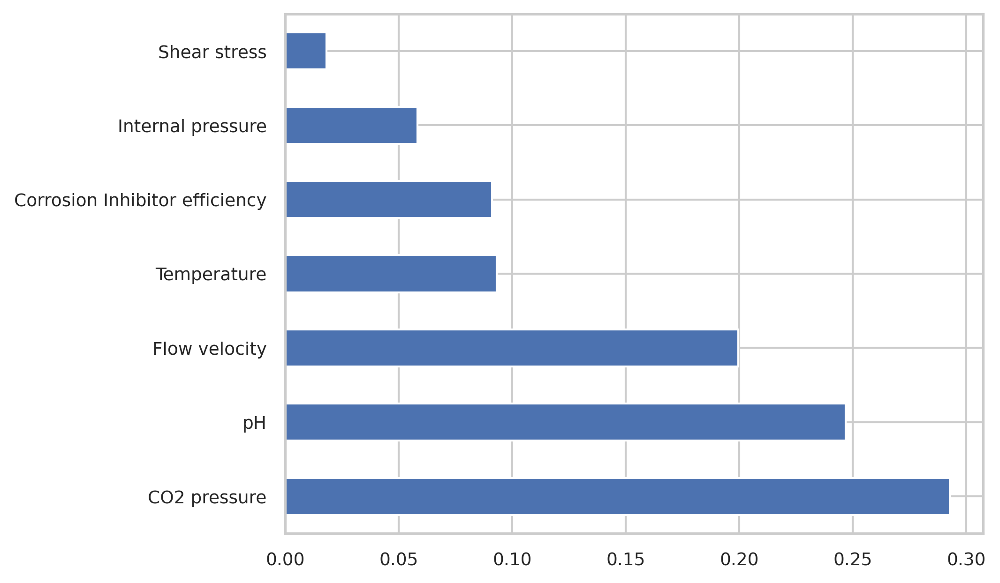

In [ ]:
columns = ["Temperature","Flow velocity","CO2 pressure","Internal pressure","Corrosion Inhibitor efficiency","Shear stress","pH"]
feat_importances = pd.Series(model.feature_importances_,index=columns)
feat_importances.nlargest(7).plot(kind='barh')
plt.show()

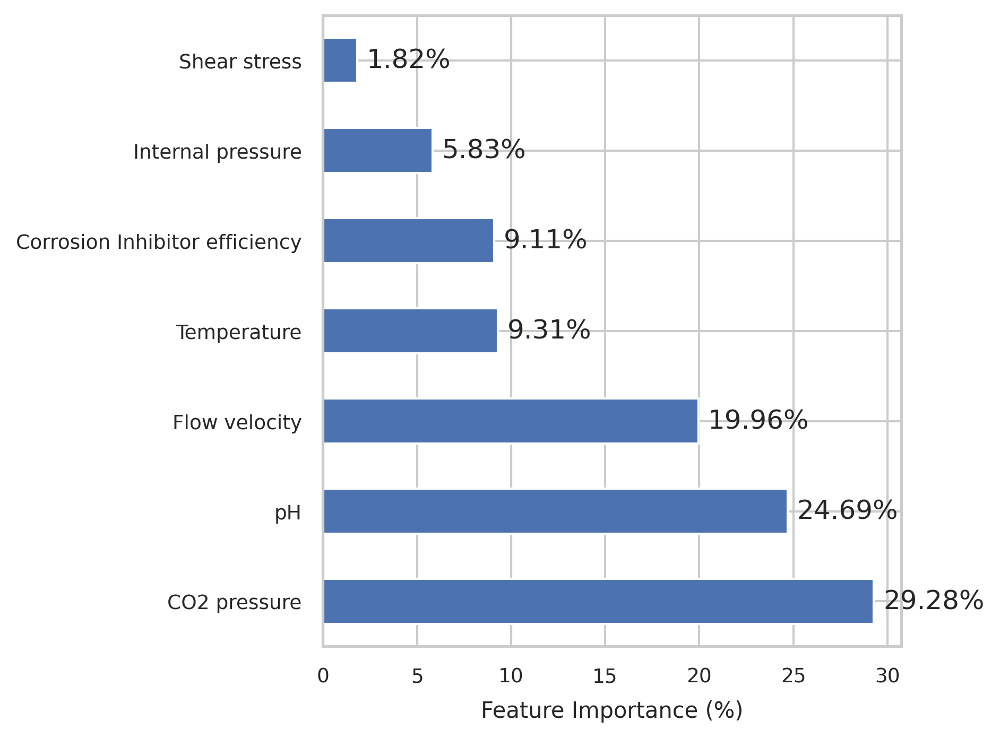


Feature Importance (%):
CO2 pressure                      29.279551
pH                                24.693161
Flow velocity                     19.961368
Temperature                        9.309209
Corrosion Inhibitor efficiency     9.112081
Internal pressure                  5.827009
Shear stress                       1.817620
dtype: float64


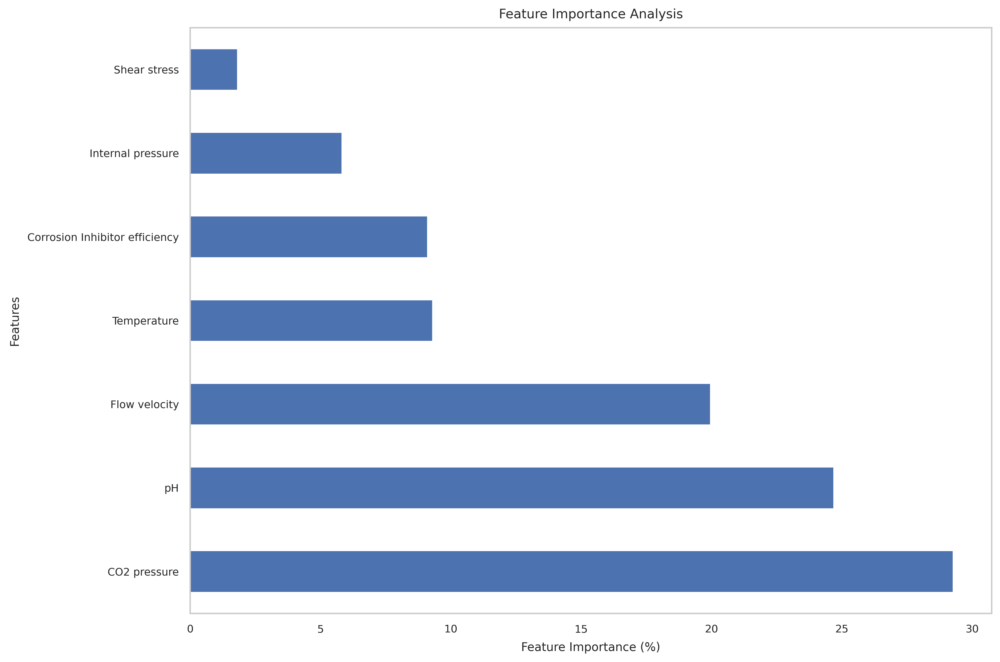

In [ ]:
columns = ["Temperature","Flow velocity","CO2 pressure","Internal pressure","Corrosion Inhibitor efficiency","Shear stress","pH"]
feat_importances = pd.Series(model.feature_importances_, index=columns)

# Convert to percentage
feat_importances_pct = (feat_importances * 100)

# Plot with percentage labels
ax = feat_importances_pct.nlargest(7).plot(kind='barh')
plt.xlabel('Feature Importance (%)')
#plt.ylabel('Features')
#plt.title('Feature Importance Analysis')

# Add percentage values on bars
for i, v in enumerate(feat_importances_pct.nlargest(7).values):
    ax.text(v + 0.5, i, f'{v:.2f}%', va='center')

plt.tight_layout()
plt.show()

# Print percentage values
print("\nFeature Importance (%):")
print(feat_importances_pct.sort_values(ascending=False))

plt.figure(figsize=(12, 8))  # Width=12, Height=8 inches
feat_importances_pct.nlargest(7).plot(kind='barh')
plt.xlabel('Feature Importance (%)')
plt.ylabel('Features')
plt.title('Feature Importance Analysis')
plt.grid(False)
plt.tight_layout()
plt.show()

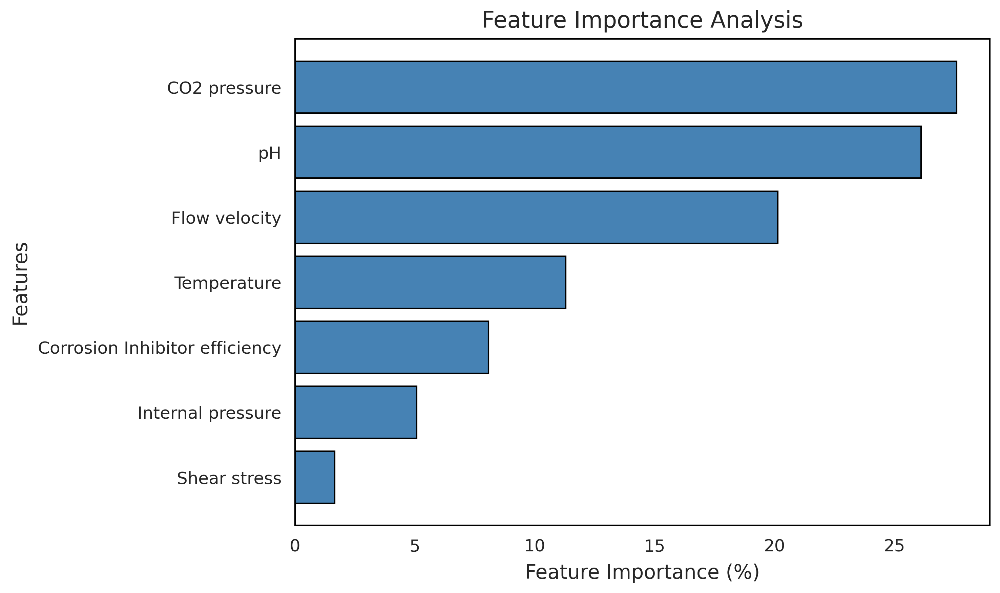

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

plt.rcParams['figure.dpi'] = 300

# Feature importance data (adjust values to match your actual data)
features = ['Shear stress', 'Internal pressure', 'Corrosion Inhibitor efficiency',
            'Temperature', 'Flow velocity', 'pH', 'CO2 pressure']
importance = [1.66, 5.08, 8.08, 11.30, 20.15, 26.12, 27.61]  # Example values from your manuscript

# Create DataFrame
df_importance = pd.DataFrame({'Features': features, 'Importance': importance})

# Sort by importance (ascending for horizontal bar chart)
df_importance = df_importance.sort_values('Importance', ascending=True)

# Create plot
fig, ax = plt.subplots(figsize=(10, 6))

# Horizontal bar chart
bars = ax.barh(df_importance['Features'], df_importance['Importance'], color='steelblue', edgecolor='black')

# Labels and title
ax.set_xlabel('Feature Importance (%)', fontsize=14)
ax.set_ylabel('Features', fontsize=14)
ax.set_title('Feature Importance Analysis', fontsize=16)

# Tick label sizes
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)

# Remove grid or add subtle grid
ax.grid(False)

# Set black box (spines) around plot
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1.0)

plt.tight_layout()
plt.savefig('feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

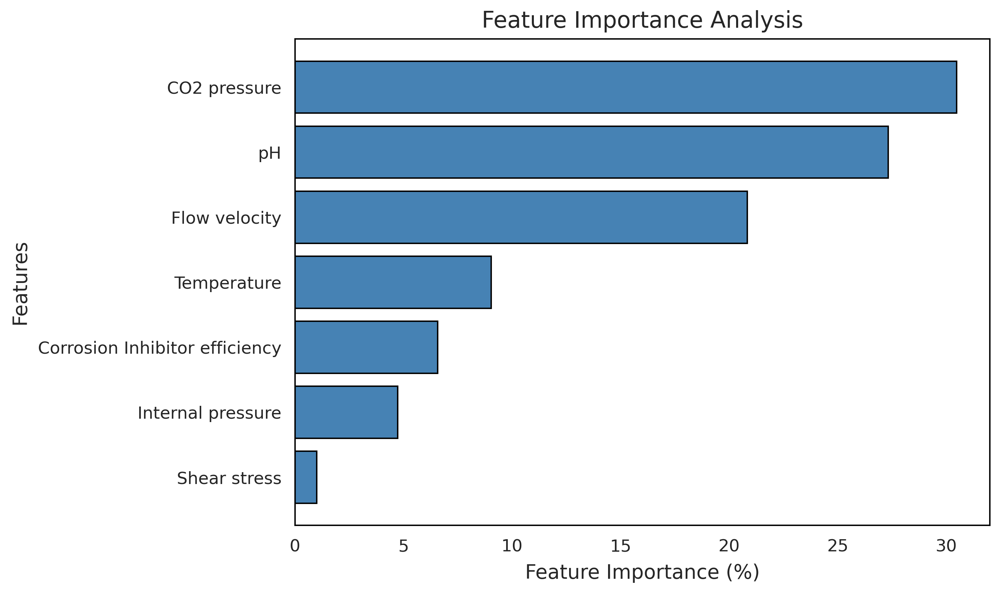

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

plt.rcParams['figure.dpi'] = 300

# Feature importance data
features = ['CO2 pressure', 'pH', 'Flow velocity', 'Temperature',
            'Corrosion Inhibitor efficiency', 'Internal pressure', 'Shear stress']
importance = [30.486827, 27.327893, 20.837010, 9.040850, 6.570108, 4.727609, 1.009703]

# Create DataFrame
df_importance = pd.DataFrame({'Features': features, 'Importance': importance})

# Sort by importance (ascending = lowest at top, highest at bottom)
df_importance = df_importance.sort_values('Importance', ascending=True)

# Create plot
fig, ax = plt.subplots(figsize=(10, 6))

# Horizontal bar chart
bars = ax.barh(df_importance['Features'], df_importance['Importance'], color='steelblue', edgecolor='black')

# Labels and title
ax.set_xlabel('Feature Importance (%)', fontsize=14)
ax.set_ylabel('Features', fontsize=14)
ax.set_title('Feature Importance Analysis', fontsize=16)

# Tick label sizes
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)

# Remove grid
ax.grid(False)

# Set black box (spines) around plot
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1.0)

plt.tight_layout()
plt.savefig('feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

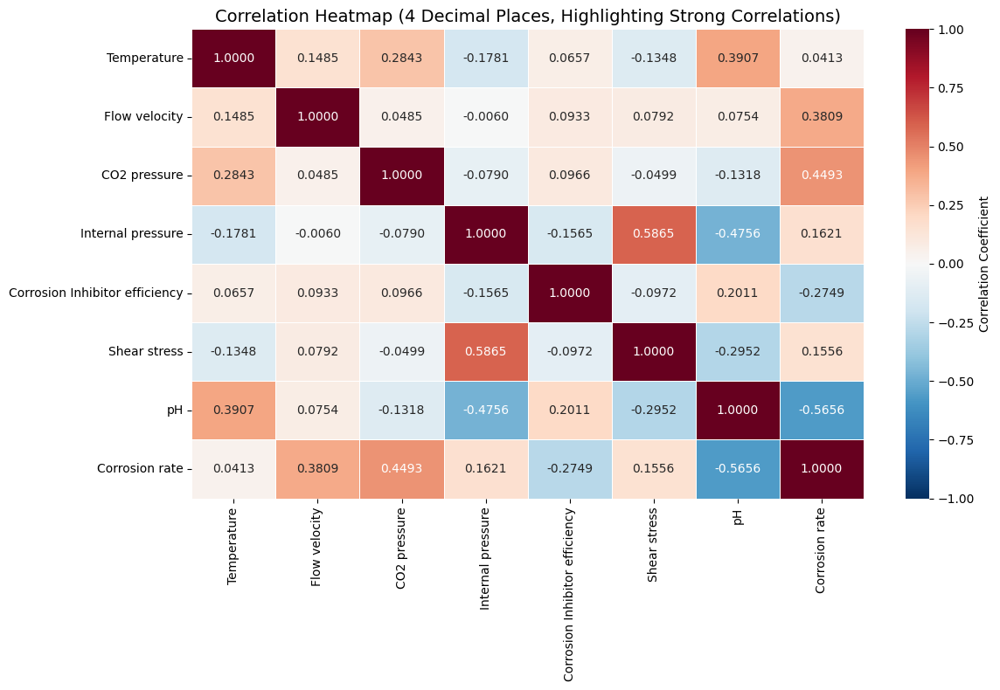

In [ ]:
# plt.figure(figsize = (12,8))
# sns.heatmap(cleaned_df.corr(), annot = True)
# plt.show()

# # Round correlation values to 4 decimal places
# corr_matrix = cleaned_df.corr().round(4)

# sns.heatmap(corr_matrix, annot=True, fmt=".4f", cmap="coolwarm", linewidths=0.5)

# plt.title("Correlation Heatmap (4 Decimal Places)", fontsize=14)
# plt.show()

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Compute and round correlation matrix
corr_matrix = cleaned_df.corr().round(4)

# Create heatmap with diverging color map centered at 0
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".4f",
    cmap="RdBu_r",         # Diverging palette (red = strong positive, blue = strong negative)
    center=0,              # Center color scale at zero correlation
    linewidths=0.5,
    vmin=-1, vmax=1,       # Full correlation range
    cbar_kws={'label': 'Correlation Coefficient'}
)

plt.title("Correlation Heatmap (4 Decimal Places, Highlighting Strong Correlations)", fontsize=14)
plt.tight_layout()
plt.show()


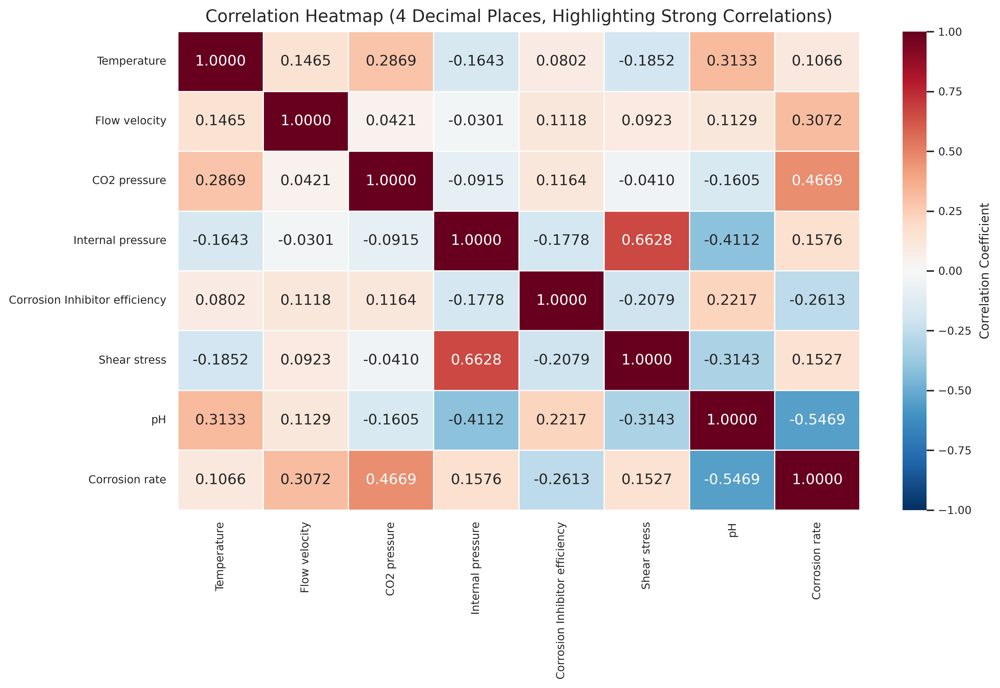

In [ ]:
# plt.figure(figsize = (12,8))
# sns.heatmap(cleaned_df.corr(), annot = True)
# plt.show()

# # Round correlation values to 4 decimal places
# corr_matrix = cleaned_df.corr().round(4)

# sns.heatmap(corr_matrix, annot=True, fmt=".4f", cmap="coolwarm", linewidths=0.5)

# plt.title("Correlation Heatmap (4 Decimal Places)", fontsize=14)
# plt.show()

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Compute and round correlation matrix
corr_matrix = cleaned_df.corr().round(4)

# Create heatmap with diverging color map centered at 0
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".4f",
    cmap="RdBu_r",         # Diverging palette (red = strong positive, blue = strong negative)
    center=0,              # Center color scale at zero correlation
    linewidths=0.5,
    vmin=-1, vmax=1,       # Full correlation range
    cbar_kws={'label': 'Correlation Coefficient'}
)

plt.title("Correlation Heatmap (4 Decimal Places, Highlighting Strong Correlations)", fontsize=14)
plt.tight_layout()
plt.show()


##Normal Dataset

In [ ]:
#Original dataset
X_new = cleaned_df.drop(['Corrosion rate'], axis=1)
y_new = cleaned_df['Corrosion rate']

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
rescaledX = scaler.fit_transform(X_new)
X_norm =rescaledX

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as MSE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
#from sklearn.linear_model import Lasso
#from sklearn.linear_model import BayesianRidge
#from sklearn.neighbors import KNeighborsRegressor
#from sklearn.tree import DecisionTreeRegressor
#from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor
#from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
import sklearn.metrics as metrics
import xgboost as xgb
from catboost import CatBoostRegressor as CART

ABR: r2_score = 0.634
MAE: 1.8138864442698217
MSE: 7.849484263450518
RMSE: 2.8016931065786843
ETR: r2_score = 0.727
MAE: 1.0479531296150817
MSE: 5.863480793204496
RMSE: 2.421462531860548
GBR: r2_score = 0.705
MAE: 1.2167913389520864
MSE: 6.342005559825318
RMSE: 2.518333885692149
RFR: r2_score = 0.637
MAE: 1.2900199024235257
MSE: 7.79336408670206
RMSE: 2.7916597369131613
XGB: r2_score = 0.638
MAE: 1.3223606695250856
MSE: 7.780069181195732
RMSE: 2.789277537498865
0:	learn: 3.4438556	total: 51.8ms	remaining: 5.13s
1:	learn: 3.2841992	total: 53.4ms	remaining: 2.62s
2:	learn: 3.1218465	total: 56.4ms	remaining: 1.82s
3:	learn: 2.9603025	total: 57.4ms	remaining: 1.38s
4:	learn: 2.8208691	total: 59.9ms	remaining: 1.14s
5:	learn: 2.6865319	total: 60.5ms	remaining: 947ms
6:	learn: 2.5572913	total: 61.1ms	remaining: 811ms
7:	learn: 2.4757978	total: 61.6ms	remaining: 709ms
8:	learn: 2.3643597	total: 62.1ms	remaining: 628ms
9:	learn: 2.2832012	total: 62.7ms	remaining: 564ms
10:	learn: 2.1971496	tot

<Figure size 1000x600 with 0 Axes>

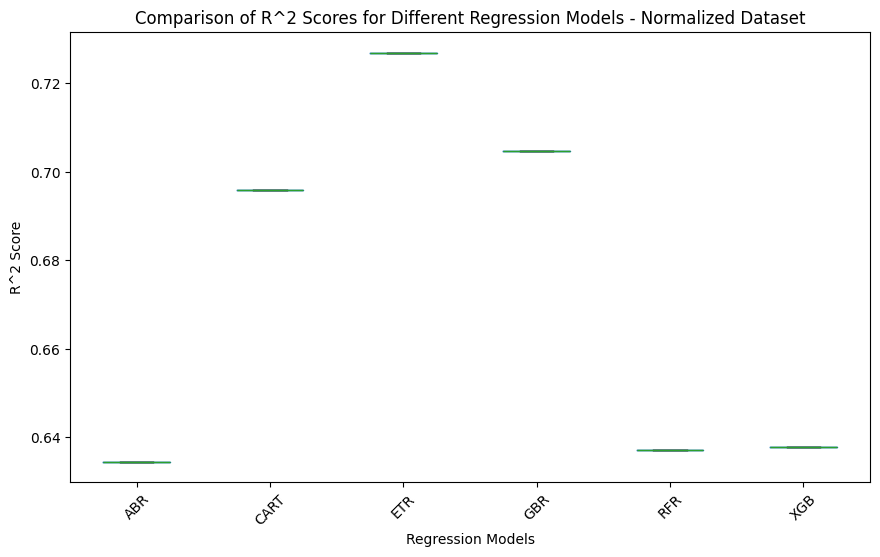

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as MSE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
#from sklearn.linear_model import Lasso
#from sklearn.linear_model import BayesianRidge
#from sklearn.neighbors import KNeighborsRegressor
#from sklearn.tree import DecisionTreeRegressor
#from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor
#from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
import sklearn.metrics as metrics
import xgboost as xgb
from catboost import CatBoostRegressor as CART


X_train, X_test, y_train, y_test = train_test_split(X_norm,y_new, test_size = 0.30, random_state =7)

models = []
names = []
results = []

#models.append(('LR', LinearRegression()))
#models.append(('R', Ridge()))
#models.append(('L', Lasso()))
#models.append(('BR', BayesianRidge(max_iter=1000)))
#models.append(('KNR', KNeighborsRegressor()))
#models.append(('DTR', DecisionTreeRegressor()))
#models.append(('SVR', SVR()))
models.append(('ABR', AdaBoostRegressor(n_estimators=300)))
#models.append(('BR', BaggingRegressor(n_estimators=300)))
models.append(('ETR', ExtraTreesRegressor(n_estimators=300)))
models.append(('GBR', GradientBoostingRegressor(n_estimators=300)))
models.append(('RFR', RandomForestRegressor(n_estimators=300)))
models.append(('XGB', xgb.XGBRegressor()))
models.append(('CART', CART(iterations=100, learning_rate=0.1, random_seed=123)))

for name, model in models:
    model.fit(X_train, y_train)
    m_predict = model.predict(X_test)
    model_scores1=cross_val_score(model,X_train,y_train,cv=3)
    m_score = r2_score(y_test, m_predict)
    names.append(name)
    results.append(m_score)
    print("%s: r2_score = %.3f" % (name, m_score))
    print('MAE:',metrics.mean_absolute_error(y_test, m_predict))
    print('MSE:',metrics.mean_squared_error(y_test, m_predict))
    print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test, m_predict)))


# Create a DataFrame from results to facilitate plotting
results_df = pd.DataFrame({'Model': names, 'R^2 Score': results})

# Plotting the box plot
plt.figure(figsize=(10, 6))

# ***CHANGE***: Plot only the 'R^2 Score' column and use model names as labels
results_df.boxplot(column=['R^2 Score'], by='Model',  figsize=(10, 6))

plt.title("Comparison of R^2 Scores for Different Regression Models - Normalized Dataset")
plt.suptitle('') # Remove the automatic suptitle
plt.xlabel("Regression Models")
plt.ylabel("R^2 Score")
plt.xticks(rotation=45)
plt.grid()
plt.show()

#PCA

In [ ]:
from sklearn.decomposition import PCA

# pca = PCA(n_components=2)
# X_pca = pca.fit_transform(X_scaled)
# print(X_pca[:2])
pca = PCA(n_components=7)
pca.fit(X_norm)
X_pca = pca.fit_transform(X_norm)
#PCA(n_components=4)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.3579628  0.23231164 0.12911974 0.12199926 0.07177505 0.04824163
 0.03858988]
[5.89000118 4.74495304 3.53746998 3.43854751 2.6374437  2.16225749
 1.93389606]


ABR: r2_score = 0.548
ETR: r2_score = 0.622
GBR: r2_score = 0.606
RFR: r2_score = 0.651
XGB: r2_score = 0.566
0:	learn: 3.3492983	total: 5.66ms	remaining: 561ms
1:	learn: 3.2089023	total: 7.41ms	remaining: 363ms
2:	learn: 3.0769233	total: 9.05ms	remaining: 293ms
3:	learn: 2.9551615	total: 10.8ms	remaining: 259ms
4:	learn: 2.8529235	total: 12.4ms	remaining: 236ms
5:	learn: 2.7403949	total: 14.1ms	remaining: 222ms
6:	learn: 2.6334192	total: 15.8ms	remaining: 209ms
7:	learn: 2.5376482	total: 17.4ms	remaining: 200ms
8:	learn: 2.4316564	total: 19ms	remaining: 192ms
9:	learn: 2.3564673	total: 20.7ms	remaining: 187ms
10:	learn: 2.2875013	total: 22.5ms	remaining: 182ms
11:	learn: 2.2165387	total: 24.3ms	remaining: 178ms
12:	learn: 2.1561524	total: 26ms	remaining: 174ms
13:	learn: 2.0974091	total: 27.8ms	remaining: 171ms
14:	learn: 2.0410354	total: 29.4ms	remaining: 167ms
15:	learn: 2.0011644	total: 31.2ms	remaining: 164ms
16:	learn: 1.9623252	total: 32.9ms	remaining: 161ms
17:	learn: 1.9103860

<Figure size 1000x600 with 0 Axes>

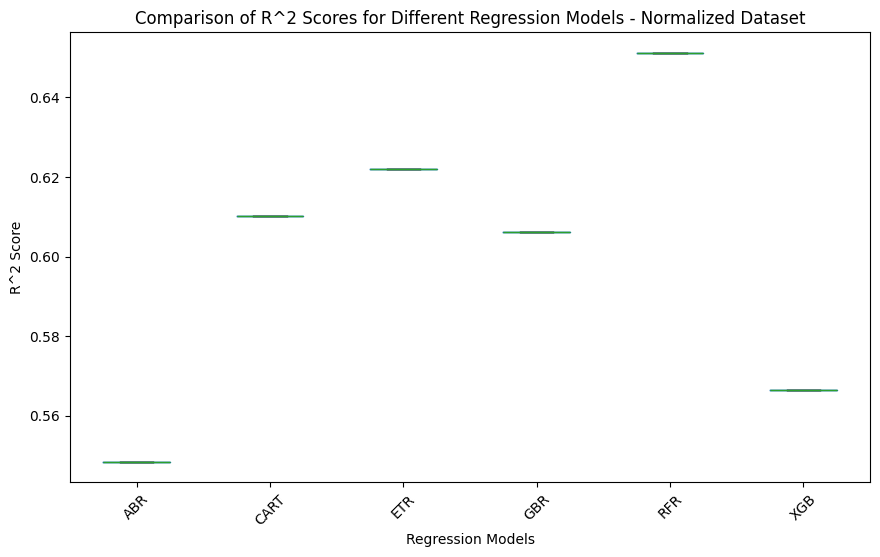

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as MSE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import BayesianRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
import sklearn.metrics as metrics
import xgboost as xgb
from catboost import CatBoostRegressor as CART


X_train,X_test,y_train, y_test = train_test_split(X_pca,y_new,test_size = 0.3 , random_state = 7 )
models = []
names = []
results = []

#models.append(('LR', LinearRegression()))
#models.append(('R', Ridge()))
#models.append(('L', Lasso()))
#models.append(('BR', BayesianRidge(max_iter=1000)))
#models.append(('KNR', KNeighborsRegressor()))
#models.append(('DTR', DecisionTreeRegressor()))
#models.append(('SVR', SVR()))
models.append(('ABR', AdaBoostRegressor(n_estimators=300)))
#models.append(('BR', BaggingRegressor(n_estimators=300)))
models.append(('ETR', ExtraTreesRegressor(n_estimators=300)))
models.append(('GBR', GradientBoostingRegressor(n_estimators=300)))
models.append(('RFR', RandomForestRegressor(n_estimators=300)))
models.append(('XGB', xgb.XGBRegressor()))
models.append(('CART', CART(iterations=100, learning_rate=0.1, random_seed=123)))

for name, model in models:
    model.fit(X_train, y_train)
    m_predict = model.predict(X_test)
    model_scores1=cross_val_score(model,X_train,y_train,cv=3)
    m_score = r2_score(y_test, m_predict)
    names.append(name)
    results.append(m_score)
    print("%s: r2_score = %.3f" % (name, m_score))
    #print("%s: r2_score = %.3f" % (name, model_scores1))

# ##added the following
# # Create a DataFrame from results to facilitate plotting
# results_df = pd.DataFrame({'Model': names, 'R^2 Score': results})

# # Plotting the box plot
# plt.figure(figsize=(10, 6))
# plt.boxplot([results_df[results_df['Model'] == model]['R^2 Score'].values for model in results_df['Model'].unique()], labels=results_df['Model'].unique())
# plt.title("Comparison of R^2 Scores for Different Regression Models - Combined Dataset")
# plt.xlabel("Regression Models")
# plt.ylabel("R^2 Score")
# plt.xticks(rotation=45)
# plt.grid()

# # Set axis limits
# #plt.xlim([0.9, 1])  # Replace xmin and xmax with appropriate values
# plt.ylim([0.8, 1])
# plt.show()

# Create a DataFrame from results to facilitate plotting
results_df = pd.DataFrame({'Model': names, 'R^2 Score': results})

# Plotting the box plot
plt.figure(figsize=(10, 6))

# ***CHANGE***: Plot only the 'R^2 Score' column and use model names as labels
results_df.boxplot(column=['R^2 Score'], by='Model',  figsize=(10, 6))

plt.title("Comparison of R^2 Scores for Different Regression Models - Normalized Dataset")
plt.suptitle('') # Remove the automatic suptitle
plt.xlabel("Regression Models")
plt.ylabel("R^2 Score")
plt.xticks(rotation=45)
plt.grid()
plt.show()

# Train DATASET Using Feature Selection

In [ ]:
X_clean = X_new.drop(['Internal pressure', 'Shear stress', 'Corrosion Inhibitor efficiency'], axis=1)
#X_clean = X_new.drop(['Internal pressure', 'Shear stress'], axis=1) #remove only shear stress

In [ ]:
# split data
#Assign Dependent and Independent variable
X_fea = X_clean.copy()
#X_fea = X_fea.drop(['Corrosion rate'], axis=1)
y_new = cleaned_df['Corrosion rate']

In [ ]:
X_fea.tail()

,Temperature,Flow velocity,CO2 pressure,pH
399,70.0,0.76,2.6,3.60
402,63.0,2.85,3.4,5.67
413,69.0,2.24,5.2,4.10
418,45.0,2.80,2.5,5.50
420,38.0,2.34,3.7,5.64


In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
rescaledX = scaler.fit_transform(X_fea)
X_read =rescaledX

ABR: r2_score = 0.628
MAE: 1.8030170997724084
MSE: 7.983956057638083
RMSE: 2.8255895062160183
ETR: r2_score = 0.691
MAE: 1.244273921808478
MSE: 6.645004840142817
RMSE: 2.5777906897463216
GBR: r2_score = 0.665
MAE: 1.515006976137979
MSE: 7.196339520996233
RMSE: 2.6825993962938695
RFR: r2_score = 0.601
MAE: 1.5225911894410917
MSE: 8.57821562725377
RMSE: 2.928859099931878
XGB: r2_score = 0.545
MAE: 1.7111907879170343
MSE: 9.778031209658748
RMSE: 3.126984363513631
0:	learn: 3.3999364	total: 548us	remaining: 54.3ms
1:	learn: 3.2370772	total: 964us	remaining: 47.3ms
2:	learn: 3.1056189	total: 1.39ms	remaining: 44.9ms
3:	learn: 2.9852651	total: 1.87ms	remaining: 44.8ms
4:	learn: 2.8435829	total: 2.32ms	remaining: 44.1ms
5:	learn: 2.7326539	total: 2.75ms	remaining: 43.1ms
6:	learn: 2.6198572	total: 3.15ms	remaining: 41.8ms
7:	learn: 2.5306236	total: 3.52ms	remaining: 40.5ms
8:	learn: 2.4567327	total: 3.93ms	remaining: 39.8ms
9:	learn: 2.3620806	total: 4.36ms	remaining: 39.2ms
10:	learn: 2.2930

<Figure size 1000x600 with 0 Axes>

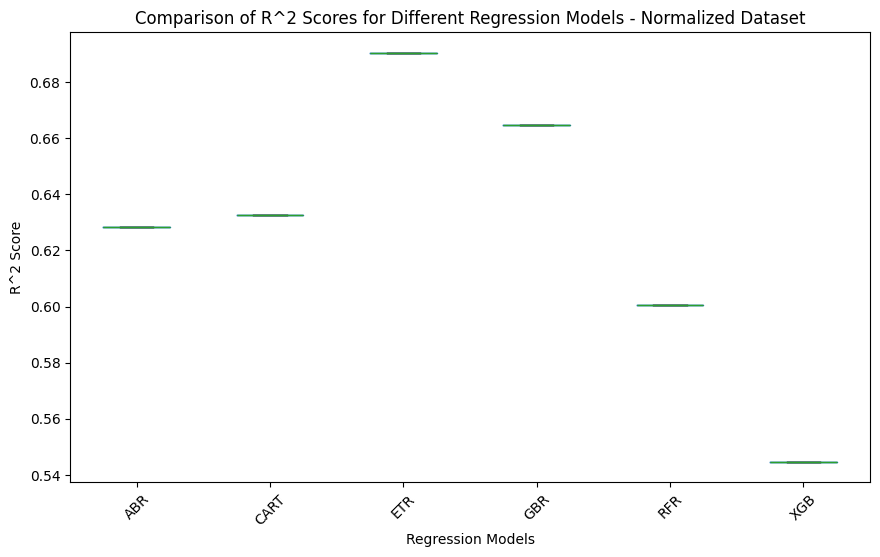

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as MSE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import BayesianRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
import sklearn.metrics as metrics
import xgboost as xgb
from catboost import CatBoostRegressor as CART


X_train,X_test,y_train, y_test = train_test_split(X_read,y_new,test_size = 0.3 , random_state = 7 )
models = []
names = []
results = []

#models.append(('LR', LinearRegression()))
#models.append(('R', Ridge()))
#models.append(('L', Lasso()))
#models.append(('BR', BayesianRidge(max_iter=1000)))
#models.append(('KNR', KNeighborsRegressor()))
#models.append(('DTR', DecisionTreeRegressor()))
#models.append(('SVR', SVR()))
models.append(('ABR', AdaBoostRegressor(n_estimators=300)))
#models.append(('BR', BaggingRegressor(n_estimators=300)))
models.append(('ETR', ExtraTreesRegressor(n_estimators=300)))
models.append(('GBR', GradientBoostingRegressor(n_estimators=300)))
models.append(('RFR', RandomForestRegressor(n_estimators=300)))
models.append(('XGB', xgb.XGBRegressor()))
models.append(('CART', CART(iterations=100, learning_rate=0.1, random_seed=123)))

for name, model in models:
    model.fit(X_train, y_train)
    m_predict = model.predict(X_test)
    model_scores1=cross_val_score(model,X_train,y_train,cv=3)
    m_score = r2_score(y_test, m_predict)
    names.append(name)
    results.append(m_score)
    print("%s: r2_score = %.3f" % (name, m_score))
    #print("%s: r2_score = %.3f" % (name, model_scores1))
    print('MAE:',metrics.mean_absolute_error(y_test, m_predict))
    print('MSE:',metrics.mean_squared_error(y_test, m_predict))
    print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test, m_predict)))

# ##added the following
# # Create a DataFrame from results to facilitate plotting
# results_df = pd.DataFrame({'Model': names, 'R^2 Score': results})

# # Plotting the box plot
# plt.figure(figsize=(10, 6))
# plt.boxplot([results_df[results_df['Model'] == model]['R^2 Score'].values for model in results_df['Model'].unique()], labels=results_df['Model'].unique())
# plt.title("Comparison of R^2 Scores for Different Regression Models - Combined Dataset")
# plt.xlabel("Regression Models")
# plt.ylabel("R^2 Score")
# plt.xticks(rotation=45)
# plt.grid()

# # Set axis limits
# #plt.xlim([0.9, 1])  # Replace xmin and xmax with appropriate values
# plt.ylim([0.8, 1])
# plt.show()

# Create a DataFrame from results to facilitate plotting
results_df = pd.DataFrame({'Model': names, 'R^2 Score': results})

# Plotting the box plot
plt.figure(figsize=(10, 6))

# ***CHANGE***: Plot only the 'R^2 Score' column and use model names as labels
results_df.boxplot(column=['R^2 Score'], by='Model',  figsize=(10, 6))

plt.title("Comparison of R^2 Scores for Different Regression Models - Normalized Dataset")
plt.suptitle('') # Remove the automatic suptitle
plt.xlabel("Regression Models")
plt.ylabel("R^2 Score")
plt.xticks(rotation=45)
plt.grid()
plt.show()

#Continue from here

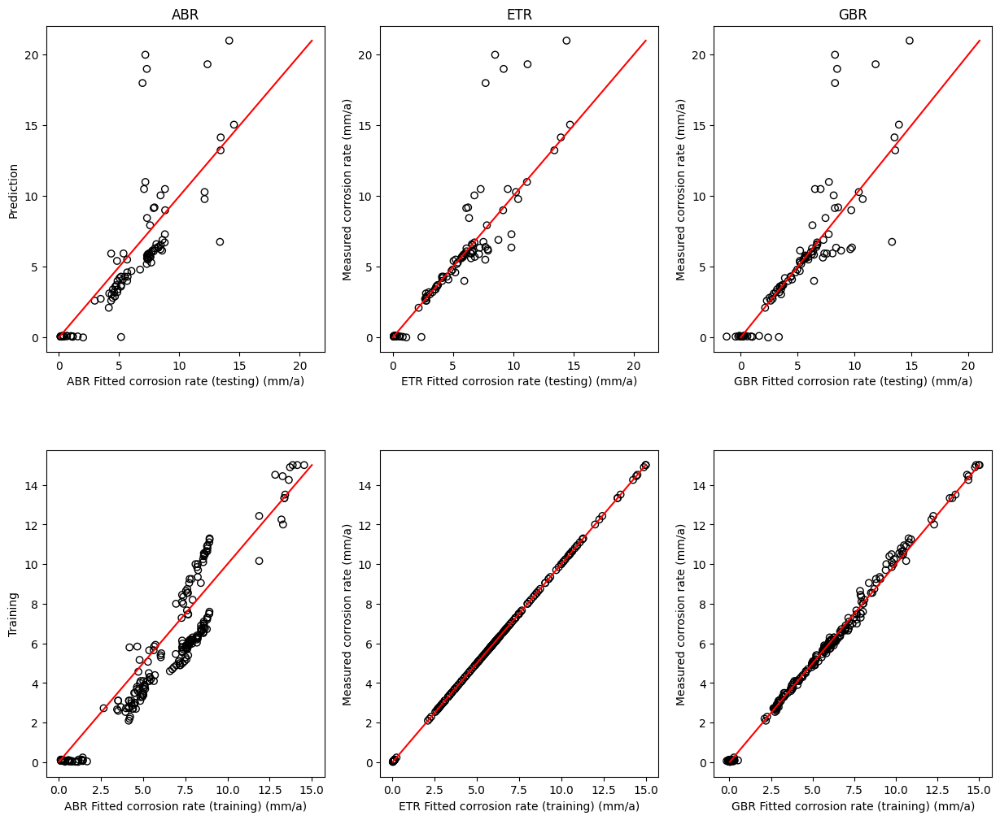

In [ ]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X_norm,y_new, test_size = 0.3, random_state =7)

# Define models
models = {
    'ABR': AdaBoostRegressor(n_estimators=300),
    #'BR': BaggingRegressor(n_estimators=300),
    'ETR': ExtraTreesRegressor(n_estimators=300),
    'GBR': GradientBoostingRegressor(n_estimators=300),
}

# Train models
trained_models = {}
predictions_train = {}
predictions_test = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    trained_models[name] = model
    predictions_train[name] = model.predict(X_train)
    predictions_test[name] = model.predict(X_test)

# Plot results
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
fig.subplots_adjust(hspace=0.3)

for idx, (name, model) in enumerate(models.items()):
    # Training plot
    ax = axes[1, idx]
    ax.scatter(predictions_train[name], y_train, edgecolors="black", facecolors="none")
    ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r')
    ax.set_xlabel(f"{name} Fitted corrosion rate (training) (mm/a)")
    ax.set_ylabel("Measured corrosion rate (mm/a)")

    # Testing plot
    ax = axes[0, idx]
    ax.scatter(predictions_test[name], y_test, edgecolors="black", facecolors="none")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r')
    ax.set_xlabel(f"{name} Fitted corrosion rate (testing) (mm/a)")
    ax.set_ylabel("Measured corrosion rate (mm/a)")

# Add labels
axes[0, 0].set_title("ABR")
#axes[0, 1].set_title("BR")
axes[0, 1].set_title("ETR")
axes[0, 2].set_title("GBR")

axes[0, 0].set_ylabel("Prediction")
axes[1, 0].set_ylabel("Training")

plt.show()


0:	learn: 3.4438556	total: 1.04ms	remaining: 311ms
1:	learn: 3.2841992	total: 2.01ms	remaining: 300ms
2:	learn: 3.1218465	total: 2.63ms	remaining: 260ms
3:	learn: 2.9603025	total: 3.19ms	remaining: 236ms
4:	learn: 2.8208691	total: 3.77ms	remaining: 222ms
5:	learn: 2.6865319	total: 4.32ms	remaining: 212ms
6:	learn: 2.5572913	total: 4.88ms	remaining: 204ms
7:	learn: 2.4757978	total: 5.43ms	remaining: 198ms
8:	learn: 2.3643597	total: 6ms	remaining: 194ms
9:	learn: 2.2832012	total: 6.55ms	remaining: 190ms
10:	learn: 2.1971496	total: 7.09ms	remaining: 186ms
11:	learn: 2.1183469	total: 7.62ms	remaining: 183ms
12:	learn: 2.0423977	total: 8.15ms	remaining: 180ms
13:	learn: 1.9774975	total: 8.69ms	remaining: 177ms
14:	learn: 1.9134925	total: 9.24ms	remaining: 176ms
15:	learn: 1.8510743	total: 9.78ms	remaining: 174ms
16:	learn: 1.8028957	total: 10.3ms	remaining: 172ms
17:	learn: 1.7629266	total: 10.8ms	remaining: 170ms
18:	learn: 1.7150719	total: 11.4ms	remaining: 168ms
19:	learn: 1.6709450	tota

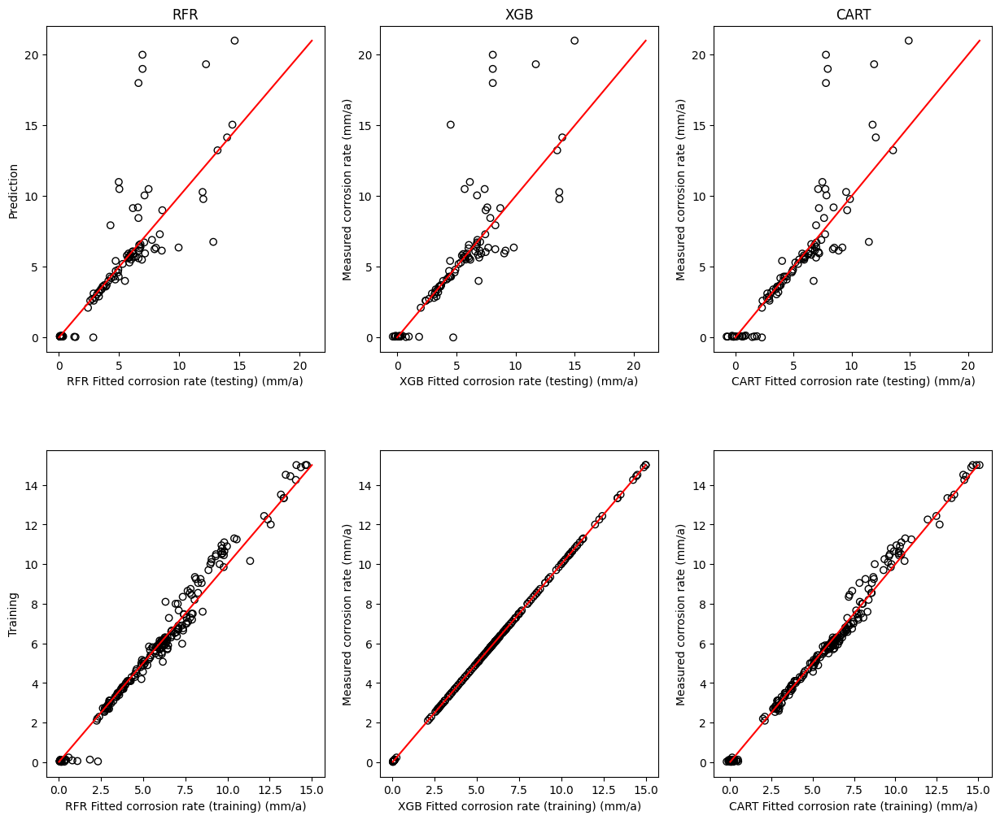

In [ ]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X_norm,y_new, test_size = 0.3, random_state =7)

# Define models
models = {
    'RFR': RandomForestRegressor(n_estimators=300),
    'XGB': xgb.XGBRegressor(n_estimators=300),
    'CART': CART(iterations=300, learning_rate=0.1, random_seed=123)
}

# Train models
trained_models = {}
predictions_train = {}
predictions_test = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    trained_models[name] = model
    predictions_train[name] = model.predict(X_train)
    predictions_test[name] = model.predict(X_test)

# Plot results
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
fig.subplots_adjust(hspace=0.3)

for idx, (name, model) in enumerate(models.items()):
    # Training plot
    ax = axes[1, idx]
    ax.scatter(predictions_train[name], y_train, edgecolors="black", facecolors="none")
    ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r')
    ax.set_xlabel(f"{name} Fitted corrosion rate (training) (mm/a)")
    ax.set_ylabel("Measured corrosion rate (mm/a)")

    # Testing plot
    ax = axes[0, idx]
    ax.scatter(predictions_test[name], y_test, edgecolors="black", facecolors="none")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r')
    ax.set_xlabel(f"{name} Fitted corrosion rate (testing) (mm/a)")
    ax.set_ylabel("Measured corrosion rate (mm/a)")

# Add labels
axes[0, 0].set_title("RFR")
axes[0, 1].set_title("XGB")
axes[0, 2].set_title("CART")
# axes[0, 3].set_title("XGB")

axes[0, 0].set_ylabel("Prediction")
axes[1, 0].set_ylabel("Training")

plt.show()

0:	learn: 3.4438556	total: 773us	remaining: 231ms
1:	learn: 3.2841992	total: 1.38ms	remaining: 206ms
2:	learn: 3.1218465	total: 2.47ms	remaining: 245ms
3:	learn: 2.9603025	total: 3.1ms	remaining: 229ms
4:	learn: 2.8208691	total: 3.66ms	remaining: 216ms
5:	learn: 2.6865319	total: 4.21ms	remaining: 206ms
6:	learn: 2.5572913	total: 4.76ms	remaining: 199ms
7:	learn: 2.4757978	total: 5.3ms	remaining: 194ms
8:	learn: 2.3643597	total: 5.85ms	remaining: 189ms
9:	learn: 2.2832012	total: 6.38ms	remaining: 185ms
10:	learn: 2.1971496	total: 6.92ms	remaining: 182ms
11:	learn: 2.1183469	total: 7.47ms	remaining: 179ms
12:	learn: 2.0423977	total: 8ms	remaining: 177ms
13:	learn: 1.9774975	total: 8.53ms	remaining: 174ms
14:	learn: 1.9134925	total: 9.06ms	remaining: 172ms
15:	learn: 1.8510743	total: 9.6ms	remaining: 170ms
16:	learn: 1.8028957	total: 10.1ms	remaining: 169ms
17:	learn: 1.7629266	total: 10.7ms	remaining: 167ms
18:	learn: 1.7150719	total: 11.2ms	remaining: 166ms
19:	learn: 1.6709450	total: 1

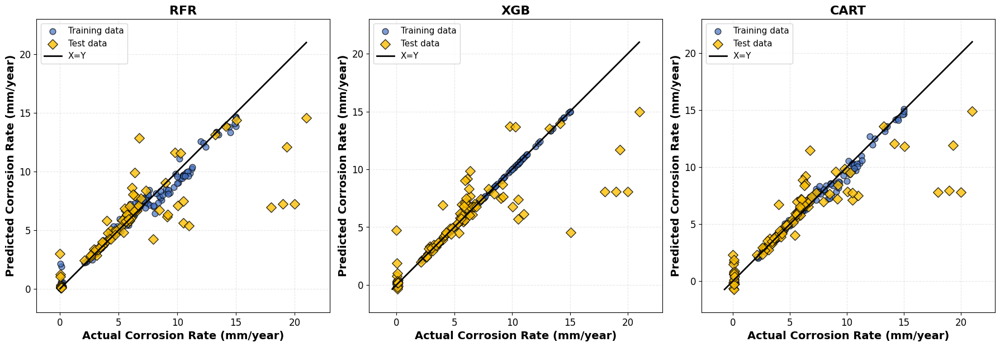

In [ ]:
#On the same plot
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor, ExtraTreesRegressor, GradientBoostingRegressor

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_norm, y_new, test_size=0.3, random_state=7)

# Define models
models = {
    'RFR': RandomForestRegressor(n_estimators=300),
    'XGB': xgb.XGBRegressor(n_estimators=300),
    'CART': CART(iterations=300, learning_rate=0.1, random_seed=123)  # Replace with actual LightGBM if available
}

# Train models and get predictions
trained_models = {}
predictions_train = {}
predictions_test = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    trained_models[name] = model
    predictions_train[name] = model.predict(X_train)
    predictions_test[name] = model.predict(X_test)

# Create figure with 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, (name, model) in enumerate(models.items()):
    ax = axes[idx]

    # Plot training data (blue circles)
    ax.scatter(y_train, predictions_train[name],
               s=60, facecolors='#4472C4', edgecolors='black',
               linewidths=1, alpha=0.7, label='Training data')

    # Plot test data (yellow diamonds)
    ax.scatter(y_test, predictions_test[name],
               s=80, facecolors='#FFC000', edgecolors='black',
               marker='D', linewidths=1, alpha=0.8, label='Test data')

    # Perfect prediction line (X=Y)
    max_val = max(y_train.max(), y_test.max(),
                  predictions_train[name].max(), predictions_test[name].max())
    min_val = min(y_train.min(), y_test.min(),
                  predictions_train[name].min(), predictions_test[name].min())
    ax.plot([min_val, max_val], [min_val, max_val],
            'k-', linewidth=2, label='X=Y')

    # Labels and title (MODIFIED FOR CORROSION RATE)
    ax.set_xlabel('Actual Corrosion Rate (mm/year)', fontsize=14, fontweight='bold')
    ax.set_ylabel('Predicted Corrosion Rate (mm/year)', fontsize=14, fontweight='bold')
    ax.set_title(name, fontsize=16, fontweight='bold')

    # Set equal aspect ratio and limits
    ax.set_xlim(min_val-2, max_val+2)
    ax.set_ylim(min_val-2, max_val+2)
    ax.set_aspect('equal', adjustable='box')

    # Add legend
    ax.legend(loc='upper left', fontsize=11, frameon=True)

    # Grid
    ax.grid(True, alpha=0.3, linestyle='--')

    # Tick parameters
    ax.tick_params(axis='both', labelsize=12)

plt.tight_layout()
plt.show()

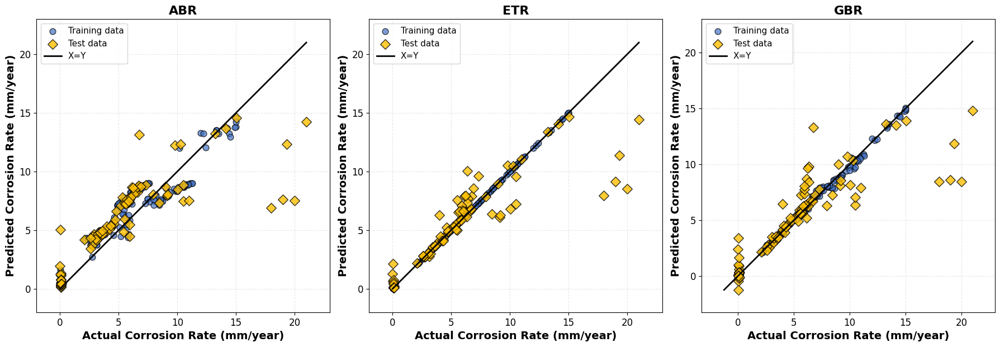

In [ ]:
#On the same plot

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_norm, y_new, test_size=0.3, random_state=7)

# Define models
models = {
     'ABR': AdaBoostRegressor(n_estimators=300),
     'ETR': ExtraTreesRegressor(n_estimators=300),
     'GBR': GradientBoostingRegressor(n_estimators=300),
}

# Train models and get predictions
trained_models = {}
predictions_train = {}
predictions_test = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    trained_models[name] = model
    predictions_train[name] = model.predict(X_train)
    predictions_test[name] = model.predict(X_test)

# Create figure with 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, (name, model) in enumerate(models.items()):
    ax = axes[idx]

    # Plot training data (blue circles)
    ax.scatter(y_train, predictions_train[name],
               s=60, facecolors='#4472C4', edgecolors='black',
               linewidths=1, alpha=0.7, label='Training data')

    # Plot test data (yellow diamonds)
    ax.scatter(y_test, predictions_test[name],
               s=80, facecolors='#FFC000', edgecolors='black',
               marker='D', linewidths=1, alpha=0.8, label='Test data')

    # Perfect prediction line (X=Y)
    max_val = max(y_train.max(), y_test.max(),
                  predictions_train[name].max(), predictions_test[name].max())
    min_val = min(y_train.min(), y_test.min(),
                  predictions_train[name].min(), predictions_test[name].min())
    ax.plot([min_val, max_val], [min_val, max_val],
            'k-', linewidth=2, label='X=Y')

    # Labels and title (MODIFIED FOR CORROSION RATE)
    ax.set_xlabel('Actual Corrosion Rate (mm/year)', fontsize=14, fontweight='bold')
    ax.set_ylabel('Predicted Corrosion Rate (mm/year)', fontsize=14, fontweight='bold')
    ax.set_title(name, fontsize=16, fontweight='bold')

    # Set equal aspect ratio and limits
    ax.set_xlim(min_val-2, max_val+2)
    ax.set_ylim(min_val-2, max_val+2)
    ax.set_aspect('equal', adjustable='box')

    # Add legend
    ax.legend(loc='upper left', fontsize=11, frameon=True)

    # Grid
    ax.grid(True, alpha=0.3, linestyle='--')

    # Tick parameters
    ax.tick_params(axis='both', labelsize=12)

plt.tight_layout()
plt.show()

Feature selection

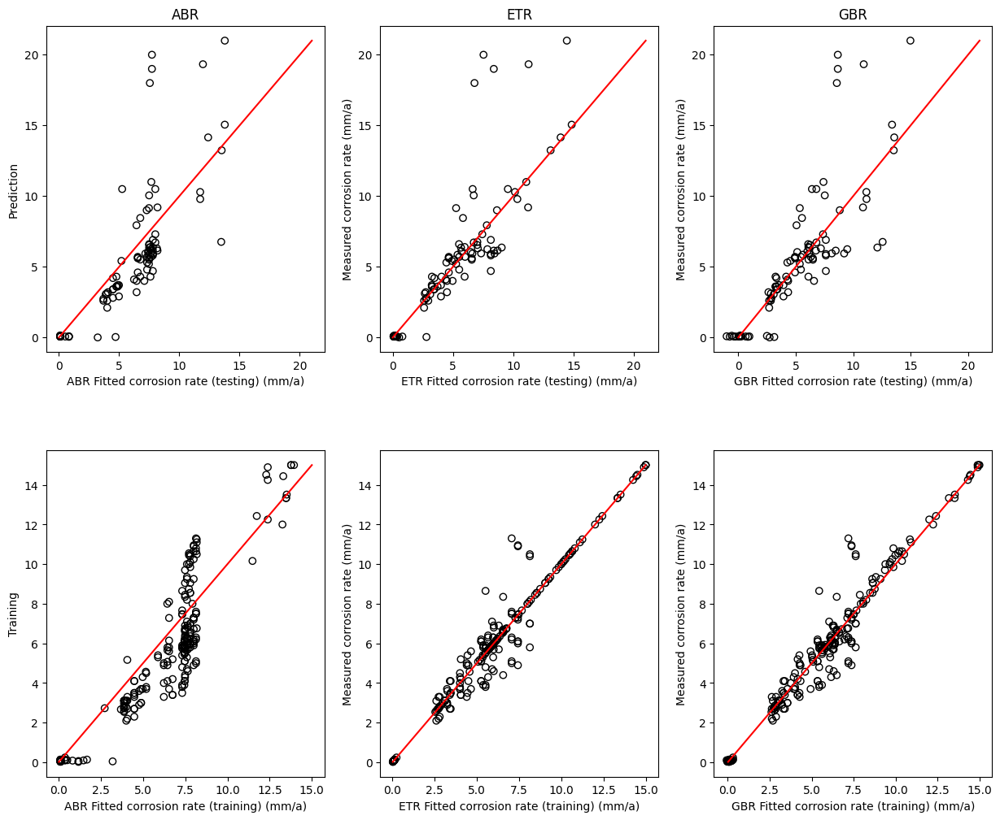

In [ ]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X_read,y_new, test_size = 0.3, random_state =7)

# Define models
models = {
    'ABR': AdaBoostRegressor(n_estimators=300),
    #'BR': BaggingRegressor(n_estimators=300),
    'ETR': ExtraTreesRegressor(n_estimators=300),
    'GBR': GradientBoostingRegressor(n_estimators=300),
}

# Train models
trained_models = {}
predictions_train = {}
predictions_test = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    trained_models[name] = model
    predictions_train[name] = model.predict(X_train)
    predictions_test[name] = model.predict(X_test)

# Plot results
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
fig.subplots_adjust(hspace=0.3)

for idx, (name, model) in enumerate(models.items()):
    # Training plot
    ax = axes[1, idx]
    ax.scatter(predictions_train[name], y_train, edgecolors="black", facecolors="none")
    ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r')
    ax.set_xlabel(f"{name} Fitted corrosion rate (training) (mm/a)")
    ax.set_ylabel("Measured corrosion rate (mm/a)")

    # Testing plot
    ax = axes[0, idx]
    ax.scatter(predictions_test[name], y_test, edgecolors="black", facecolors="none")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r')
    ax.set_xlabel(f"{name} Fitted corrosion rate (testing) (mm/a)")
    ax.set_ylabel("Measured corrosion rate (mm/a)")

# Add labels
axes[0, 0].set_title("ABR")
#axes[0, 1].set_title("BR")
axes[0, 1].set_title("ETR")
axes[0, 2].set_title("GBR")

axes[0, 0].set_ylabel("Prediction")
axes[1, 0].set_ylabel("Training")

plt.show()


0:	learn: 3.3999364	total: 642us	remaining: 192ms
1:	learn: 3.2370772	total: 1.39ms	remaining: 207ms
2:	learn: 3.1056189	total: 1.78ms	remaining: 176ms
3:	learn: 2.9852651	total: 2.16ms	remaining: 160ms
4:	learn: 2.8435829	total: 2.56ms	remaining: 151ms
5:	learn: 2.7326539	total: 2.95ms	remaining: 145ms
6:	learn: 2.6198572	total: 3.34ms	remaining: 140ms
7:	learn: 2.5306236	total: 3.73ms	remaining: 136ms
8:	learn: 2.4567327	total: 4.14ms	remaining: 134ms
9:	learn: 2.3620806	total: 4.53ms	remaining: 132ms
10:	learn: 2.2930907	total: 4.94ms	remaining: 130ms
11:	learn: 2.2274772	total: 5.32ms	remaining: 128ms
12:	learn: 2.1676078	total: 5.73ms	remaining: 126ms
13:	learn: 2.1115184	total: 6.11ms	remaining: 125ms
14:	learn: 2.0462275	total: 6.6ms	remaining: 125ms
15:	learn: 1.9997308	total: 7.03ms	remaining: 125ms
16:	learn: 1.9552178	total: 7.45ms	remaining: 124ms
17:	learn: 1.9085442	total: 8.03ms	remaining: 126ms
18:	learn: 1.8783863	total: 8.44ms	remaining: 125ms
19:	learn: 1.8309896	tot

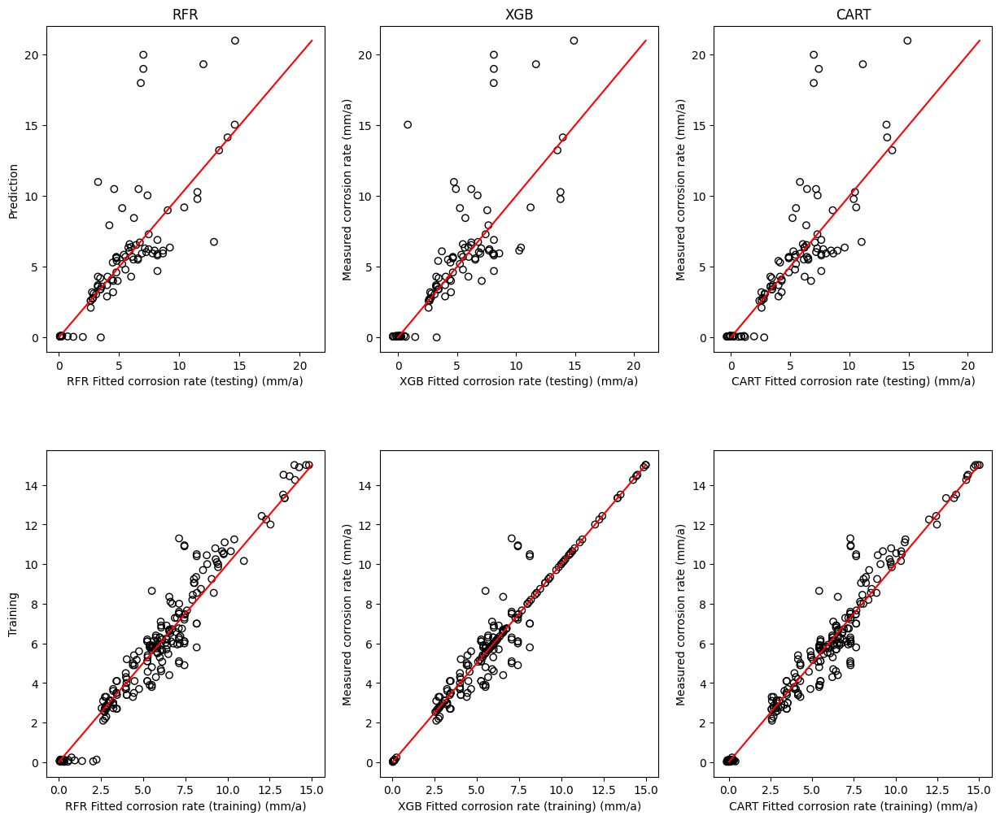

In [ ]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X_read,y_new, test_size = 0.3, random_state =7)

# Define models
models = {
    'RFR': RandomForestRegressor(n_estimators=300),
    'XGB': xgb.XGBRegressor(n_estimators=300),
    'CART': CART(iterations=300, learning_rate=0.1, random_seed=123)
}

# Train models
trained_models = {}
predictions_train = {}
predictions_test = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    trained_models[name] = model
    predictions_train[name] = model.predict(X_train)
    predictions_test[name] = model.predict(X_test)

# Plot results
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
fig.subplots_adjust(hspace=0.3)

for idx, (name, model) in enumerate(models.items()):
    # Training plot
    ax = axes[1, idx]
    ax.scatter(predictions_train[name], y_train, edgecolors="black", facecolors="none")
    ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r')
    ax.set_xlabel(f"{name} Fitted corrosion rate (training) (mm/a)")
    ax.set_ylabel("Measured corrosion rate (mm/a)")

    # Testing plot
    ax = axes[0, idx]
    ax.scatter(predictions_test[name], y_test, edgecolors="black", facecolors="none")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r')
    ax.set_xlabel(f"{name} Fitted corrosion rate (testing) (mm/a)")
    ax.set_ylabel("Measured corrosion rate (mm/a)")

# Add labels
axes[0, 0].set_title("RFR")
axes[0, 1].set_title("XGB")
axes[0, 2].set_title("CART")
# axes[0, 3].set_title("XGB")

axes[0, 0].set_ylabel("Prediction")
axes[1, 0].set_ylabel("Training")

plt.show()

0:	learn: 3.3999364	total: 523us	remaining: 157ms
1:	learn: 3.2370772	total: 1.23ms	remaining: 184ms
2:	learn: 3.1056189	total: 1.65ms	remaining: 163ms
3:	learn: 2.9852651	total: 2.03ms	remaining: 150ms
4:	learn: 2.8435829	total: 2.42ms	remaining: 143ms
5:	learn: 2.7326539	total: 2.79ms	remaining: 137ms
6:	learn: 2.6198572	total: 3.17ms	remaining: 133ms
7:	learn: 2.5306236	total: 3.54ms	remaining: 129ms
8:	learn: 2.4567327	total: 3.93ms	remaining: 127ms
9:	learn: 2.3620806	total: 4.31ms	remaining: 125ms
10:	learn: 2.2930907	total: 4.68ms	remaining: 123ms
11:	learn: 2.2274772	total: 5.07ms	remaining: 122ms
12:	learn: 2.1676078	total: 5.45ms	remaining: 120ms
13:	learn: 2.1115184	total: 5.83ms	remaining: 119ms
14:	learn: 2.0462275	total: 6.22ms	remaining: 118ms
15:	learn: 1.9997308	total: 6.6ms	remaining: 117ms
16:	learn: 1.9552178	total: 6.98ms	remaining: 116ms
17:	learn: 1.9085442	total: 7.34ms	remaining: 115ms
18:	learn: 1.8783863	total: 7.71ms	remaining: 114ms
19:	learn: 1.8309896	tot

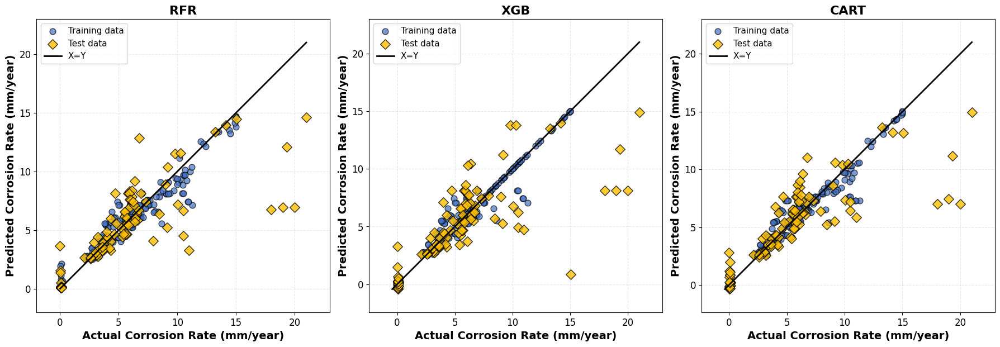

In [ ]:
#Same plot for Feature selection
#On the same plot
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor, ExtraTreesRegressor, GradientBoostingRegressor

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_read, y_new, test_size=0.3, random_state=7)

# Define models
models = {
    'RFR': RandomForestRegressor(n_estimators=300),
    'XGB': xgb.XGBRegressor(n_estimators=300),
    'CART': CART(iterations=300, learning_rate=0.1, random_seed=123)  # Replace with actual LightGBM if available
}

# Train models and get predictions
trained_models = {}
predictions_train = {}
predictions_test = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    trained_models[name] = model
    predictions_train[name] = model.predict(X_train)
    predictions_test[name] = model.predict(X_test)

# Create figure with 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, (name, model) in enumerate(models.items()):
    ax = axes[idx]

    # Plot training data (blue circles)
    ax.scatter(y_train, predictions_train[name],
               s=60, facecolors='#4472C4', edgecolors='black',
               linewidths=1, alpha=0.7, label='Training data')

    # Plot test data (yellow diamonds)
    ax.scatter(y_test, predictions_test[name],
               s=80, facecolors='#FFC000', edgecolors='black',
               marker='D', linewidths=1, alpha=0.8, label='Test data')

    # Perfect prediction line (X=Y)
    max_val = max(y_train.max(), y_test.max(),
                  predictions_train[name].max(), predictions_test[name].max())
    min_val = min(y_train.min(), y_test.min(),
                  predictions_train[name].min(), predictions_test[name].min())
    ax.plot([min_val, max_val], [min_val, max_val],
            'k-', linewidth=2, label='X=Y')

    # Labels and title (MODIFIED FOR CORROSION RATE)
    ax.set_xlabel('Actual Corrosion Rate (mm/year)', fontsize=14, fontweight='bold')
    ax.set_ylabel('Predicted Corrosion Rate (mm/year)', fontsize=14, fontweight='bold')
    ax.set_title(name, fontsize=16, fontweight='bold')

    # Set equal aspect ratio and limits
    ax.set_xlim(min_val-2, max_val+2)
    ax.set_ylim(min_val-2, max_val+2)
    ax.set_aspect('equal', adjustable='box')

    # Add legend
    ax.legend(loc='upper left', fontsize=11, frameon=True)

    # Grid
    ax.grid(True, alpha=0.3, linestyle='--')

    # Tick parameters
    ax.tick_params(axis='both', labelsize=12)

plt.tight_layout()
plt.show()

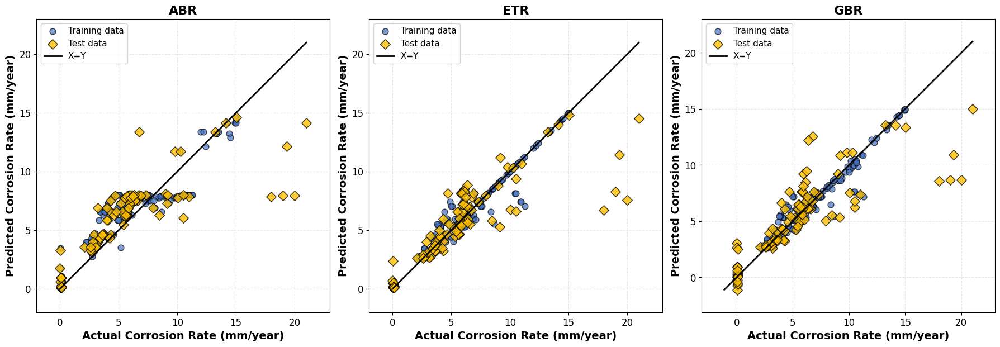

In [ ]:
#On the same plot

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_read, y_new, test_size=0.3, random_state=7)

# Define models
models = {
     'ABR': AdaBoostRegressor(n_estimators=300),
     'ETR': ExtraTreesRegressor(n_estimators=300),
     'GBR': GradientBoostingRegressor(n_estimators=300),
}

# Train models and get predictions
trained_models = {}
predictions_train = {}
predictions_test = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    trained_models[name] = model
    predictions_train[name] = model.predict(X_train)
    predictions_test[name] = model.predict(X_test)

# Create figure with 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, (name, model) in enumerate(models.items()):
    ax = axes[idx]

    # Plot training data (blue circles)
    ax.scatter(y_train, predictions_train[name],
               s=60, facecolors='#4472C4', edgecolors='black',
               linewidths=1, alpha=0.7, label='Training data')

    # Plot test data (yellow diamonds)
    ax.scatter(y_test, predictions_test[name],
               s=80, facecolors='#FFC000', edgecolors='black',
               marker='D', linewidths=1, alpha=0.8, label='Test data')

    # Perfect prediction line (X=Y)
    max_val = max(y_train.max(), y_test.max(),
                  predictions_train[name].max(), predictions_test[name].max())
    min_val = min(y_train.min(), y_test.min(),
                  predictions_train[name].min(), predictions_test[name].min())
    ax.plot([min_val, max_val], [min_val, max_val],
            'k-', linewidth=2, label='X=Y')

    # Labels and title (MODIFIED FOR CORROSION RATE)
    ax.set_xlabel('Actual Corrosion Rate (mm/year)', fontsize=14, fontweight='bold')
    ax.set_ylabel('Predicted Corrosion Rate (mm/year)', fontsize=14, fontweight='bold')
    ax.set_title(name, fontsize=16, fontweight='bold')

    # Set equal aspect ratio and limits
    ax.set_xlim(min_val-2, max_val+2)
    ax.set_ylim(min_val-2, max_val+2)
    ax.set_aspect('equal', adjustable='box')

    # Add legend
    ax.legend(loc='upper left', fontsize=11, frameon=True)

    # Grid
    ax.grid(True, alpha=0.3, linestyle='--')

    # Tick parameters
    ax.tick_params(axis='both', labelsize=12)

plt.tight_layout()
plt.show()

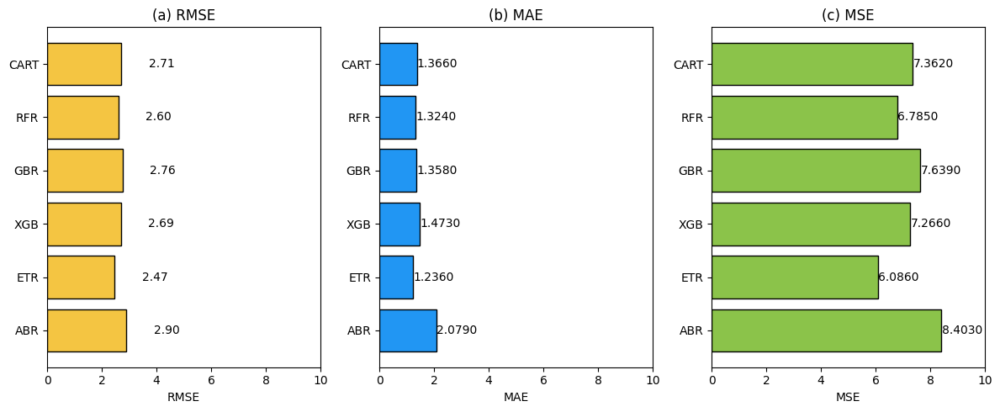

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for RMSE and MAE
models = ["ABR", "ETR", "XGB", "GBR", "RFR", "CART"]
rmse_values = [2.898, 2.467,  2.695, 2.763, 2.604, 2.713]  # Percentage values #0.2379
mae_values = [2.079, 1.236, 1.473, 1.358,  1.324,  1.366] #0.0685
mse_values = [8.403, 6.086, 7.266, 7.639, 6.785, 7.362] #0.0566

# Colors for bars
rmse_color = "#F4C542"  # Yellow
mae_color = "#2196F3"   # Blue
mse_color = "#8BC34A"   # Green

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 5))

# Plot RMSE
axes[0].barh(models, rmse_values, color=rmse_color, edgecolor="black")
axes[0].set_xlabel("RMSE")
axes[0].set_title("(a) RMSE")
axes[0].set_xlim(0, 10)

# Add values to bars
for i, v in enumerate(rmse_values):
    axes[0].text(v + 1, i, f"{v:.2f}", va='center', fontsize=10)

# Plot MAE
axes[1].barh(models, mae_values, color=mae_color, edgecolor="black")
axes[1].set_xlabel("MAE")
axes[1].set_title("(b) MAE")
axes[1].set_xlim(0, 10)

# Add values to bars
for i, v in enumerate(mae_values):
    axes[1].text(v + 0.01, i, f"{v:.4f}", va='center', fontsize=10)

# Plot MSE
axes[2].barh(models, mse_values, color=mse_color, edgecolor="black")
axes[2].set_xlabel("MSE")
axes[2].set_title("(c) MSE")
axes[2].set_xlim(0, 10)

# Add values to bars
for i, v in enumerate(mse_values):
    axes[2].text(v + 0.01, i, f"{v:.4f}", va='center', fontsize=10)

# Adjust layout and show
plt.tight_layout()
plt.show()

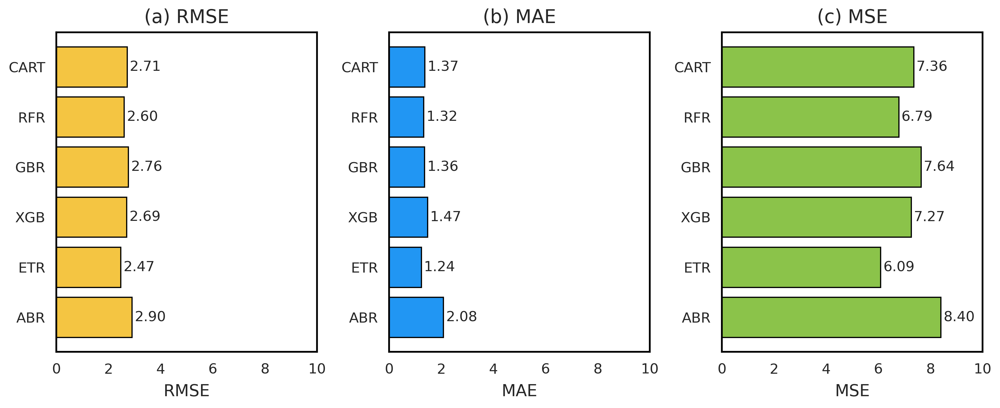

In [ ]:
#chatgpt
import matplotlib.pyplot as plt
import numpy as np

# Data for RMSE, MAE, MSE
models = ["ABR", "ETR", "XGB", "GBR", "RFR", "CART"]
rmse_values = [2.898, 2.467, 2.695, 2.763, 2.604, 2.713]
mae_values  = [2.079, 1.236, 1.473, 1.358, 1.324, 1.366]
mse_values  = [8.403, 6.086, 7.266, 7.639, 6.785, 7.362]

# Colors for bars
rmse_color = "#F4C542"  # Yellow
mae_color  = "#2196F3"  # Blue
mse_color  = "#8BC34A"  # Green

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 5))

# Common font sizes
title_fs = 16
label_fs = 14
tick_fs  = 12
text_fs  = 12

# --- RMSE ---
axes[0].barh(models, rmse_values, color=rmse_color, edgecolor="black")
axes[0].set_xlabel("RMSE", fontsize=label_fs)
axes[0].set_title("(a) RMSE", fontsize=title_fs)
axes[0].set_xlim(0, 10)
axes[0].tick_params(axis="both", labelsize=tick_fs)

for i, v in enumerate(rmse_values):
    axes[0].text(v + 0.1, i, f"{v:.2f}", va="center", fontsize=text_fs)

# --- MAE ---
axes[1].barh(models, mae_values, color=mae_color, edgecolor="black")
axes[1].set_xlabel("MAE", fontsize=label_fs)
axes[1].set_title("(b) MAE", fontsize=title_fs)
axes[1].set_xlim(0, 10)
axes[1].tick_params(axis="both", labelsize=tick_fs)

for i, v in enumerate(mae_values):
    axes[1].text(v + 0.1, i, f"{v:.2f}", va="center", fontsize=text_fs)

# --- MSE ---
axes[2].barh(models, mse_values, color=mse_color, edgecolor="black")
axes[2].set_xlabel("MSE", fontsize=label_fs)
axes[2].set_title("(c) MSE", fontsize=title_fs)
axes[2].set_xlim(0, 10)
axes[2].tick_params(axis="both", labelsize=tick_fs)

for i, v in enumerate(mse_values):
    axes[2].text(v + 0.1, i, f"{v:.2f}", va="center", fontsize=text_fs)

# Make axes boxes black and remove grid lines
for ax in axes:
    ax.grid(False)  # remove grid
    for spine in ax.spines.values():
        spine.set_edgecolor("black")
        spine.set_linewidth(1.5)

plt.tight_layout()
plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# # Data for RMSE and MAE
# models = ["BR", "DTR", "ETR", "XGB", "GBR", "RF", "LR", "R"]
# rmse_values = [0.2436, 0.2735, 0.2585,  0.2441, 0.2043, 0.2388, 0.4339, 0.4340]  # Percentage values
# mae_values = [0.1901, 0.1947, 0.1988, 0.1817, 0.1621,  0.1877,  0.3509, 0.3498]
# mse_values = [0.0593, 0.0748, 0.0668, 0.0596, 0.0417, 0.0570, 0.1883, 0.1883]

# # Colors for bars
# rmse_color = "#F4C542"  # Yellow
# mae_color = "#2196F3"   # Blue
# mse_color = "#8BC34A"   # Green

# # Create subplots
# fig, axes = plt.subplots(1, 3, figsize=(12, 5))

# # Plot RMSE
# axes[0].barh(models, rmse_values, color=rmse_color, edgecolor="black")
# axes[0].set_xlabel("RMSE (%)")
# axes[0].set_title("(a) RMSE")
# axes[0].set_xlim(0, 5)

# # Add values to bars
# for i, v in enumerate(rmse_values):
#     axes[0].text(v + 1, i, f"{v:.2f}%", va='center', fontsize=10)

# # Plot MAE
# axes[1].barh(models, mae_values, color=mae_color, edgecolor="black")
# axes[1].set_xlabel("MAE")
# axes[1].set_title("(b) MAE")
# axes[1].set_xlim(0, 0.7)

# # Add values to bars
# for i, v in enumerate(mae_values):
#     axes[1].text(v + 0.01, i, f"{v:.4f}", va='center', fontsize=10)

# # Plot MSE
# axes[2].barh(models, mse_values, color=mse_color, edgecolor="black")
# axes[2].set_xlabel("MSE")
# axes[2].set_title("(c) MSE")
# axes[2].set_xlim(0, 0.5)

# # Add values to bars
# for i, v in enumerate(mse_values):
#     axes[2].text(v + 0.01, i, f"{v:.4f}", va='center', fontsize=10)

# # Adjust layout and show
# plt.tight_layout()
# plt.show()

# Model Optimization - Hyper parameter Tuning

In [ ]:
#the best model is selected for hyper parameter tuning
from sklearn.model_selection import GridSearchCV

## GBR

In [ ]:
# Create parameter ranges
GBR_param = {
    'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'], # Updated loss parameter values
    'learning_rate': [0.001, 0.1, 0.2, 1, 10],
    'n_estimators': [100, 150, 200, 300, 400],
    'max_depth': [3, 5, 7, 10, 15, 20]
}

# Tune KNN algorithim to find best
GBR_opt = GridSearchCV(GradientBoostingRegressor(), GBR_param, verbose=1, cv=3, n_jobs=-1)

# Tune best fit model
GBR_best = GBR_opt.fit(X_train, y_train)

# Print best hyperparameters
print('Best hyperparameters: ', GBR_opt.best_estimator_)

# Test model against training and test set
GBR_best_train = GBR_best.predict(X_train)
GBR_best_test = GBR_best.predict(X_test)

# Errors for training and testing of model to check for overfitting
GBR_best_MSE_train = mean_squared_error(y_train, GBR_best_train)
GBR_best_r2_train = r2_score(y_train, GBR_best_train)
print('MSE train = ', GBR_best_MSE_train)
print("R-squared score for training is ", GBR_best_r2_train)

GBR_best_MSE_test = mean_squared_error(y_test, GBR_best_test)
GBR_best_r2_test = r2_score(y_test, GBR_best_test)
print('MSE test = ', GBR_best_MSE_test)
print('R-squared score for test is ', GBR_best_r2_test)

print(X_test, y_test, GBR_best_test)

Fitting 3 folds for each of 600 candidates, totalling 1800 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:1108: UserWarning: One or more of the test scores are non-finite: [ 1.10586801e-001  1.57799124e-001  2.01111177e-001  2.75560424e-001
  3.37714359e-001  1.29728095e-001  1.84711150e-001  2.33589063e-001
  3.17235155e-001  3.84169939e-001  1.32924718e-001  1.89418464e-001
  2.40525072e-001  3.28485938e-001  3.99319058e-001  1.33799344e-001
  1.90657200e-001  2.42149697e-001  3.28873798e-001  3.99372168e-001
  1.32006747e-001  1.87988634e-001  2.38343791e-001  3.23248205e-001
  3.92460808e-001  1.33788131e-001  1.90836969e-001  2.42322246e-001
  3.30166070e-001  4.00500820e-001  6.11727889e-002  8.84226790e-002
  1.13686000e-001  1.55617133e-001  1.96306993e-001  7.79836457e-002
  1.11551965e-001  1.43430406e-001  1.97340592e-001  2.46863136e-001
  9.38006025e-002  1.31055895e-001  1.63975841e-001  2.20382008e-001
  2.79717244e-001  9.81112583e-002  1.38820198e-001  1.76143622e-001
  2.38170734e-001  2.99269304e-

Best hyperparameters:  GradientBoostingRegressor(learning_rate=0.2, loss='absolute_error',
                          n_estimators=300)
MSE train =  1.7248147697483067
R-squared score for training is  0.8650416780916866
MSE test =  6.434364262495815
R-squared score for test is  0.7003873507838632
[[0.41124722 0.         0.6011179  0.62755058]
 [0.65968428 0.1883155  0.01549696 1.        ]
 [0.55610993 0.24298775 0.01485125 0.99079337]
 [0.40814657 0.         0.51656539 0.02102867]
 [0.26018322 0.09808945 0.01291413 0.22357446]
 [0.49692459 0.15642336 0.01549696 0.8987271 ]
 [0.11221986 0.11390051 0.01291413 0.22357446]
 [0.26079919 0.1324279  0.         0.26409729]
 [0.68927695 0.14883    0.03422246 0.69618131]
 [0.40814657 0.11979651 0.01291413 0.25426322]
 [0.68927695 0.12756857 0.03163963 0.69618131]
 [0.85094311 0.30004102 1.         0.        ]
 [1.         0.29917866 0.01291413 0.59183954]
 [0.26018322 0.11390051 0.00645707 0.28495198]
 [0.26018322 0.11498021 0.01291413 0.25426322

In [ ]:
#redo for plot
# Create parameter ranges
GBR_param = {
    'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'], # Updated loss parameter values
    'learning_rate': [0.001, 0.1, 0.2, 1, 10],
    'n_estimators': [100, 150, 200, 300, 400],
    'max_depth': [3, 5, 7, 10, 15, 20]
}

# Tune KNN algorithim to find best
GBR_opt = GridSearchCV(GradientBoostingRegressor(), GBR_param, verbose=1, cv=3, n_jobs=-1)

# Tune best fit model
GBR_best = GBR_opt.fit(X_train, y_train)

# Print best hyperparameters
print('Best hyperparameters: ', GBR_opt.best_estimator_)

# Test model against training and test set
GBR_best_train = GBR_best.predict(X_train)
GBR_best_test = GBR_best.predict(X_test)

# Errors for training and testing of model to check for overfitting
GBR_best_MSE_train = mean_squared_error(y_train, GBR_best_train)
GBR_best_r2_train = r2_score(y_train, GBR_best_train)
print('MSE train = ', GBR_best_MSE_train)
print("R-squared score for training is ", GBR_best_r2_train)

GBR_best_MSE_test = mean_squared_error(y_test, GBR_best_test)
GBR_best_r2_test = r2_score(y_test, GBR_best_test)
print('MSE test = ', GBR_best_MSE_test)
print('R-squared score for test is ', GBR_best_r2_test)

print(X_test, y_test, GBR_best_test)

Fitting 3 folds for each of 600 candidates, totalling 1800 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:1108: UserWarning: One or more of the test scores are non-finite: [ 5.88377908e-002  9.17239952e-002  1.22375839e-001  1.77508370e-001
  2.23360359e-001  8.81457184e-002  1.36771746e-001  1.79363308e-001
  2.53743400e-001  3.21209408e-001  1.01940422e-001  1.56094804e-001
  2.03968171e-001  2.84088897e-001  3.50943617e-001  1.04890284e-001
  1.60872178e-001  2.09500191e-001  2.93740365e-001  3.58856854e-001
  1.06820275e-001  1.62505964e-001  2.11531980e-001  2.91910928e-001
  3.52360641e-001  1.07255358e-001  1.62681574e-001  2.12503419e-001
  2.92914662e-001  3.54117823e-001  5.09259911e-002  8.33785037e-002
  1.10902014e-001  1.62237964e-001  2.05832833e-001  7.53960481e-002
  1.16846388e-001  1.54260618e-001  2.20149569e-001  2.70076453e-001
  8.05796897e-002  1.21091029e-001  1.58669081e-001  2.22465950e-001
  2.71433020e-001  7.97398786e-002  1.21626315e-001  1.59061206e-001
  2.21081113e-001  2.69732202e-

Best hyperparameters:  GradientBoostingRegressor(learning_rate=0.2, loss='absolute_error', max_depth=7)
MSE train =  1.1130802499047554
R-squared score for training is  0.9039319030373165
MSE test =  7.331594216532911
R-squared score for test is  0.6401137233492508
[[0.26448398 0.09893442 0.01298701 0.21588094]
 [0.33803559 0.2152892  0.01623377 0.72857417]
 [0.66166263 0.09534236 0.02077922 0.72857417]
 [0.41158719 0.         0.61688312 0.60794047]
 [0.26448398 0.1384002  0.01089218 0.23533939]
 [0.69108327 0.07073788 0.03506494 0.21588094]
 [0.11738078 0.1153335  0.00974026 0.24603937]
 [0.41158719 0.1384002  0.00974026 0.24603937]
 [0.69108327 0.17223136 0.03376623 0.30635622]
 [0.41158719 0.11041004 0.01298701 0.24603937]
 [0.45571815 0.08304012 0.01883117 0.68032069]
 [0.84533266 0.29919569 0.99122549 0.        ]
 [0.26448398 0.         0.37662338 0.09524724]
 [0.26448398 0.1153335  0.00649351 0.27619779]
 [0.26448398 0.10212431 0.01159952 0.24603937]
 [1.         0.84654788 0.012

## ETR

In [ ]:
# Create parameter ranges
ETR_param={
        'n_estimators': range(50,500,50),
        'max_features': range(50,250,50),
        'min_samples_leaf': range(5,50,5),
        'min_samples_split': range(5,40,5)}

# Tune KNN algorithim to find best
ETR_opt = GridSearchCV(ExtraTreesRegressor(), ETR_param, verbose=1, cv=3, n_jobs=-1)

# Tune best fit model
ETR_best = ETR_opt.fit(X_train, y_train)

# Print best hyperparameters
print('Best hyperparameters: ', ETR_opt.best_estimator_)

# Test model against training and test set
ETR_best_train = ETR_best.predict(X_train)
ETR_best_test = ETR_best.predict(X_test)

# Errors for training and testing of model to check for overfitting
ETR_best_MSE_train = mean_squared_error(y_train, ETR_best_train)
ETR_best_r2_train = r2_score(y_train, ETR_best_train)
print('MSE train = ', ETR_best_MSE_train)
print("R-squared score for training is ", ETR_best_r2_train)

ETR_best_MSE_test = mean_squared_error(y_test, ETR_best_test)
ETR_best_r2_test = r2_score(y_test, ETR_best_test)
print('MSE test = ', ETR_best_MSE_test)
print('R-squared score for test is ', ETR_best_r2_test)

print(X_test, y_test, ETR_best_test)

Fitting 3 folds for each of 2268 candidates, totalling 6804 fits
Best hyperparameters:  ExtraTreesRegressor(max_features=200, min_samples_leaf=5, min_samples_split=10,
                    n_estimators=50)
MSE train =  2.822701870766166
R-squared score for training is  0.7791373807741406
MSE test =  7.190879109592559
R-squared score for test is  0.6651606511033453
[[0.41124722 0.         0.6011179  0.62755058]
 [0.65968428 0.1883155  0.01549696 1.        ]
 [0.55610993 0.24298775 0.01485125 0.99079337]
 [0.40814657 0.         0.51656539 0.02102867]
 [0.26018322 0.09808945 0.01291413 0.22357446]
 [0.49692459 0.15642336 0.01549696 0.8987271 ]
 [0.11221986 0.11390051 0.01291413 0.22357446]
 [0.26079919 0.1324279  0.         0.26409729]
 [0.68927695 0.14883    0.03422246 0.69618131]
 [0.40814657 0.11979651 0.01291413 0.25426322]
 [0.68927695 0.12756857 0.03163963 0.69618131]
 [0.85094311 0.30004102 1.         0.        ]
 [1.         0.29917866 0.01291413 0.59183954]
 [0.26018322 0.11390051

## RFR

In [ ]:
# Create parameter ranges
RFR_param = {
    'max_depth': [30, 40, 50, 80, 90, 100],
    'max_features': [2, 3, 4, 5, 6, 8, 10],
    'min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 9, 10],
    'min_samples_split': [2, 4, 6, 8, 10, 12],
    'n_estimators': [100, 200, 300, 400, 500]}

# Tune KNN algorithim to find best
RFR_opt = GridSearchCV(RandomForestRegressor(), RFR_param, verbose=1, cv=3, n_jobs=-1)

# Tune best fit model
RFR_best = RFR_opt.fit(X_train, y_train)

# Print best hyperparameters
print('Best hyperparameters: ', RFR_opt.best_estimator_)

# Test model against training and test set
RFR_best_train = RFR_best.predict(X_train)
RFR_best_test = RFR_best.predict(X_test)

# Errors for training and testing of model to check for overfitting
RFR_best_MSE_train = mean_squared_error(y_train, RFR_best_train)
RFR_best_r2_train = r2_score(y_train, RFR_best_train)
print('MSE train = ', RFR_best_MSE_train)
print("R-squared score for training is ", RFR_best_r2_train)

RFR_best_MSE_test = mean_squared_error(y_test, RFR_best_test)
RFR_best_r2_test = r2_score(y_test, RFR_best_test)
print('MSE test = ', RFR_best_MSE_test)
print('R-squared score for test is ', RFR_best_r2_test)

print(X_test, y_test, RFR_best_test)

Fitting 3 folds for each of 11340 candidates, totalling 34020 fits
Best hyperparameters:  RandomForestRegressor(max_depth=50, max_features=2, min_samples_leaf=2,
                      min_samples_split=10, n_estimators=400)
MSE train =  1.5109069655084437
R-squared score for training is  0.8817789178287493
MSE test =  7.5933889209816146
R-squared score for test is  0.6464180021009116
[[0.41124722 0.         0.6011179  0.62755058]
 [0.65968428 0.1883155  0.01549696 1.        ]
 [0.55610993 0.24298775 0.01485125 0.99079337]
 [0.40814657 0.         0.51656539 0.02102867]
 [0.26018322 0.09808945 0.01291413 0.22357446]
 [0.49692459 0.15642336 0.01549696 0.8987271 ]
 [0.11221986 0.11390051 0.01291413 0.22357446]
 [0.26079919 0.1324279  0.         0.26409729]
 [0.68927695 0.14883    0.03422246 0.69618131]
 [0.40814657 0.11979651 0.01291413 0.25426322]
 [0.68927695 0.12756857 0.03163963 0.69618131]
 [0.85094311 0.30004102 1.         0.        ]
 [1.         0.29917866 0.01291413 0.59183954]
 [

In [ ]:
#redo for plot
# Create parameter ranges
RFR_param = {
    'max_depth': [30, 40, 50, 80, 90, 100],
    'max_features': [2, 3, 4, 5, 6, 8, 10],
    'min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 9, 10],
    'min_samples_split': [2, 4, 6, 8, 10, 12],
    'n_estimators': [100, 200, 300, 400, 500]}

# Tune KNN algorithim to find best
RFR_opt = GridSearchCV(RandomForestRegressor(), RFR_param, verbose=1, cv=3, n_jobs=-1)

# Tune best fit model
RFR_best = RFR_opt.fit(X_train, y_train)

# Print best hyperparameters
print('Best hyperparameters: ', RFR_opt.best_estimator_)

# Test model against training and test set
RFR_best_train = RFR_best.predict(X_train)
RFR_best_test = RFR_best.predict(X_test)

# Errors for training and testing of model to check for overfitting
RFR_best_MSE_train = mean_squared_error(y_train, RFR_best_train)
RFR_best_r2_train = r2_score(y_train, RFR_best_train)
print('MSE train = ', RFR_best_MSE_train)
print("R-squared score for training is ", RFR_best_r2_train)

RFR_best_MSE_test = mean_squared_error(y_test, RFR_best_test)
RFR_best_r2_test = r2_score(y_test, RFR_best_test)
print('MSE test = ', RFR_best_MSE_test)
print('R-squared score for test is ', RFR_best_r2_test)

print(X_test, y_test, RFR_best_test)

Fitting 3 folds for each of 11340 candidates, totalling 34020 fits
Best hyperparameters:  RandomForestRegressor(max_depth=100, max_features=2, min_samples_leaf=2,
                      n_estimators=200)
MSE train =  1.4337542109573147
R-squared score for training is  0.8762550691464617
MSE test =  5.023012932252494
R-squared score for test is  0.7534351508870366
[[0.26448398 0.09893442 0.01298701 0.21588094]
 [0.33803559 0.2152892  0.01623377 0.72857417]
 [0.66166263 0.09534236 0.02077922 0.72857417]
 [0.41158719 0.         0.61688312 0.60794047]
 [0.26448398 0.1384002  0.01089218 0.23533939]
 [0.69108327 0.07073788 0.03506494 0.21588094]
 [0.11738078 0.1153335  0.00974026 0.24603937]
 [0.41158719 0.1384002  0.00974026 0.24603937]
 [0.69108327 0.17223136 0.03376623 0.30635622]
 [0.41158719 0.11041004 0.01298701 0.24603937]
 [0.45571815 0.08304012 0.01883117 0.68032069]
 [0.84533266 0.29919569 0.99122549 0.        ]
 [0.26448398 0.         0.37662338 0.09524724]
 [0.26448398 0.1153335  

##BR

In [ ]:
param_grid = {
    'n_estimators': [20, 50, 100, 200, 300, 400, 500, 600],
    'max_samples': [0.5, 0.75, 1.0],
    'max_features': [0.5, 0.75, 1.0],
    'bootstrap':[True, False]
}

BR = GridSearchCV(BaggingRegressor(), param_grid=param_grid, cv=3, verbose=1, n_jobs=-1)
#BR.fit(X_train, y_train)

# Tune best fit model
BR_best = BR.fit(X_train, y_train)

# Print best hyperparameters
print('Best hyperparameters: ', BR.best_estimator_)

# Test model against training and test set
BR_best_train = BR_best.predict(X_train)
BR_best_test = BR_best.predict(X_test)

# Errors for training and testing of model to check for overfitting
BR_best_MSE_train = mean_squared_error(y_train, BR_best_train)
BR_best_r2_train = r2_score(y_train, BR_best_train)
print('MSE train = ', BR_best_MSE_train)
print("R-squared score for training is ", BR_best_r2_train)

BR_best_MSE_test = mean_squared_error(y_test, BR_best_test)
BR_best_r2_test = r2_score(y_test, BR_best_test)
print('MSE test = ', BR_best_MSE_test)
print('R-squared score for test is ', BR_best_r2_test)

print(X_test, y_test, BR_best_test)

Fitting 3 folds for each of 144 candidates, totalling 432 fits
Best hyperparameters:  BaggingRegressor(n_estimators=50)
MSE train =  0.017130919504229358
R-squared score for training is  0.9892521830483713
MSE test =  0.03620915479615335
R-squared score for test is  0.9789783497639419
[[0.57686761 0.         0.82181833 0.17241379]
 [0.         0.         0.2546879  0.17241379]
 [0.57686761 0.65741897 0.53825311 0.0862069 ]
 [0.35650418 0.97580698 0.53142661 0.95689655]
 [0.2884338  0.32870949 0.82181833 0.0862069 ]
 [0.57686761 0.65741897 0.53825311 0.0862069 ]
 [0.         0.65741897 0.2546879  0.        ]
 [0.2884338  0.65741897 0.2546879  0.        ]
 [0.         0.32870949 0.53825311 0.0862069 ]
 [0.57686761 0.32870949 0.2546879  0.0862069 ]
 [0.66310932 0.99322858 0.43819852 0.93965517]
 [0.2884338  0.32870949 0.2546879  0.0862069 ]
 [0.692818   0.99441194 0.93457395 0.93103448]
 [0.57686761 0.32870949 0.82181833 0.0862069 ]
 [0.57686761 0.32870949 0.53825311 0.0862069 ]
 [0.57686

##XGB

In [ ]:
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500, 600],
    'learning_rate': [0.01, 0.02, 0.03, 0.05, 0.1, 0.001, 0.1, 0.2, 1, 10],
    'booster': ['gbtree', 'gblinear'],
    'gamma': [0, 0.5, 1],
    'reg_alpha': [0, 0.2, 0.5, 1],
    'reg_lambda': [0.5, 1, 2, 3, 4, 5],
    'base_score': [0.2, 0.1, 0.4, 0.5, 0.8, 1]
}

XGB = GridSearchCV(xgb.XGBRegressor(), param_grid=param_grid, cv=3, verbose=1, n_jobs=-1)

# Tune best fit model
XGB_best = XGB.fit(X_train, y_train)

# Print best hyperparameters
print('Best hyperparameters: ', XGB.best_estimator_)

# Test model against training and test set
XGB_best_train = XGB_best.predict(X_train)
XGB_best_test = XGB_best.predict(X_test)

# Errors for training and testing of model to check for overfitting
XGB_best_MSE_train = mean_squared_error(y_train, XGB_best_train)
XGB_best_r2_train = r2_score(y_train, XGB_best_train)
print('MSE train = ', XGB_best_MSE_train)
print("R-squared score for training is ", XGB_best_r2_train)

XGB_best_MSE_test = mean_squared_error(y_test, XGB_best_test)
XGB_best_r2_test = r2_score(y_test, XGB_best_test)
print('MSE test = ', XGB_best_MSE_test)
print('R-squared score for test is ', XGB_best_r2_test)

print(X_test, y_test, XGB_best_test)

Fitting 3 folds for each of 51840 candidates, totalling 155520 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:1108: UserWarning: One or more of the test scores are non-finite: [0.24890031 0.24496403 0.20529645 ...        nan        nan        nan]
  warnings.warn(


Best hyperparameters:  XGBRegressor(base_score=0.4, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=1, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=1, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=None, num_parallel_tree=None, ...)
MSE train =  1.2626603655154536
R-squared score for training is  0.9012030004271301
MSE test =  8.830236168358551
R-squared score for test is  0.5888248871723283
[[0.41124722 0.         0.6011179  0.62755058]
 [0.65968428 0.1883155

In [ ]:
#redo for plot
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500, 600],
    'learning_rate': [0.01, 0.02, 0.03, 0.05, 0.1, 0.001, 0.1, 0.2, 1, 10],
    'booster': ['gbtree', 'gblinear'],
    'gamma': [0, 0.5, 1],
    'reg_alpha': [0, 0.2, 0.5, 1],
    'reg_lambda': [0.5, 1, 2, 3, 4, 5],
    'base_score': [0.2, 0.1, 0.4, 0.5, 0.8, 1]
}

XGB = GridSearchCV(xgb.XGBRegressor(), param_grid=param_grid, cv=3, verbose=1, n_jobs=-1)

# Tune best fit model
XGB_best = XGB.fit(X_train, y_train)

# Print best hyperparameters
print('Best hyperparameters: ', XGB.best_estimator_)

# Test model against training and test set
XGB_best_train = XGB_best.predict(X_train)
XGB_best_test = XGB_best.predict(X_test)

# Errors for training and testing of model to check for overfitting
XGB_best_MSE_train = mean_squared_error(y_train, XGB_best_train)
XGB_best_r2_train = r2_score(y_train, XGB_best_train)
print('MSE train = ', XGB_best_MSE_train)
print("R-squared score for training is ", XGB_best_r2_train)

XGB_best_MSE_test = mean_squared_error(y_test, XGB_best_test)
XGB_best_r2_test = r2_score(y_test, XGB_best_test)
print('MSE test = ', XGB_best_MSE_test)
print('R-squared score for test is ', XGB_best_r2_test)

print(X_test, y_test, XGB_best_test)

Fitting 3 folds for each of 51840 candidates, totalling 155520 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:1108: UserWarning: One or more of the test scores are non-finite: [0.15494513 0.14345563 0.11069535 ...        nan        nan        nan]
  warnings.warn(


Best hyperparameters:  XGBRegressor(base_score=1, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=1, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.01, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=500,
             n_jobs=None, num_parallel_tree=None, ...)
MSE train =  1.5131797787318806
R-squared score for training is  0.8693999810726808
MSE test =  6.243003833607349
R-squared score for test is  0.6935494057040443
[[0.26448398 0.09893442 0.01298701 0.21588094]
 [0.33803559 0.215289

##CART

In [ ]:
# Hyperparameter grid for CART (Decision Tree Regressor)
param_grid = {
    'max_depth': [3, 5, 7, 10, 15, 20, 25, None],
    'min_samples_split': [2, 5, 10, 20, 50],
    'min_samples_leaf': [1, 2, 4, 8, 10],
    'max_features': ['auto', 'sqrt', 'log2', None],
    'splitter': ['best', 'random'],
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error'],
    'min_impurity_decrease': [0.0, 0.01, 0.05, 0.1]
}

# Initialize GridSearchCV
CART = GridSearchCV(
    DecisionTreeRegressor(random_state=42),
    param_grid=param_grid,
    cv=5,
    verbose=1,
    n_jobs=-1,
    scoring='neg_mean_squared_error'
)

# Tune best fit model
CART_best = CART.fit(X_train, y_train)

# Print best hyperparameters
print('Best hyperparameters: ', CART.best_params_)
print('Best estimator: ', CART.best_estimator_)
print('Best cross-validation score: ', -CART.best_score_)

# Test model against training and test set
CART_best_train = CART_best.predict(X_train)
CART_best_test = CART_best.predict(X_test)

# Errors for training and testing of model to check for overfitting
CART_best_MSE_train = mean_squared_error(y_train, CART_best_train)
CART_best_r2_train = r2_score(y_train, CART_best_train)
print('\n--- Training Performance ---')
print('MSE train = ', CART_best_MSE_train)
print('RMSE train = ', np.sqrt(CART_best_MSE_train))
print('R-squared score for training is ', CART_best_r2_train)

CART_best_MSE_test = mean_squared_error(y_test, CART_best_test)
CART_best_r2_test = r2_score(y_test, CART_best_test)
print('\n--- Test Performance ---')
print('MSE test = ', CART_best_MSE_test)
print('RMSE test = ', np.sqrt(CART_best_MSE_test))
print('R-squared score for test is ', CART_best_r2_test)

# Check for overfitting
print('\n--- Overfitting Check ---')
print(f'R² difference (train - test): {CART_best_r2_train - CART_best_r2_test:.4f}')
if CART_best_r2_train - CART_best_r2_test > 0.1:
    print('Warning: Possible overfitting detected!')
else:
    print('Model generalization appears acceptable.')

# Display predictions
print('\n--- Sample Predictions ---')
comparison_df = pd.DataFrame({
    'Actual': y_test,
    'Predicted': CART_best_test,
    'Error': CART_best_test - y_test
})
print(comparison_df.head(10))

Fitting 5 folds for each of 19200 candidates, totalling 96000 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
24000 fits failed out of a total of 96000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24000 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.12/dist-packages/sklear

Best hyperparameters:  {'criterion': 'squared_error', 'max_depth': 7, 'max_features': None, 'min_impurity_decrease': 0.1, 'min_samples_leaf': 1, 'min_samples_split': 10, 'splitter': 'best'}
Best estimator:  DecisionTreeRegressor(max_depth=7, min_impurity_decrease=0.1,
                      min_samples_split=10, random_state=42)
Best cross-validation score:  3.0043246410240037

--- Training Performance ---
MSE train =  2.1305813253592136
RMSE train =  1.4596510971321925
R-squared score for training is  0.8332924291913218

--- Test Performance ---
MSE test =  10.047283428296936
RMSE test =  3.1697450099806033
R-squared score for test is  0.5321537478187818

--- Overfitting Check ---
R² difference (train - test): 0.3011

--- Sample Predictions ---
        Actual  Predicted      Error
84    7.935091   0.078529  -7.856562
423   0.082000   0.078529  -0.003471
357   0.070500   0.078529   0.008029
335  19.000000   7.275572 -11.724428
99   10.050000   7.275572  -2.774428
384   0.075000   0.0785

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:1108: UserWarning: One or more of the test scores are non-finite: [         nan          nan          nan ... -12.69883938  -4.73996763
 -12.69883938]
  warnings.warn(


GBR: r2_score = 0.660
MAE: 1.4123327560493006
MSE: 7.29533050273725
RMSE: 2.7009869497532284
RFR: r2_score = 0.623
MAE: 1.4659597972173497
MSE: 8.106365781614144
RMSE: 2.8471680283422236
XGB: r2_score = 0.598
MAE: 1.5198304720508131
MSE: 8.624193950824084
RMSE: 2.9366977969862824


<Figure size 1000x600 with 0 Axes>

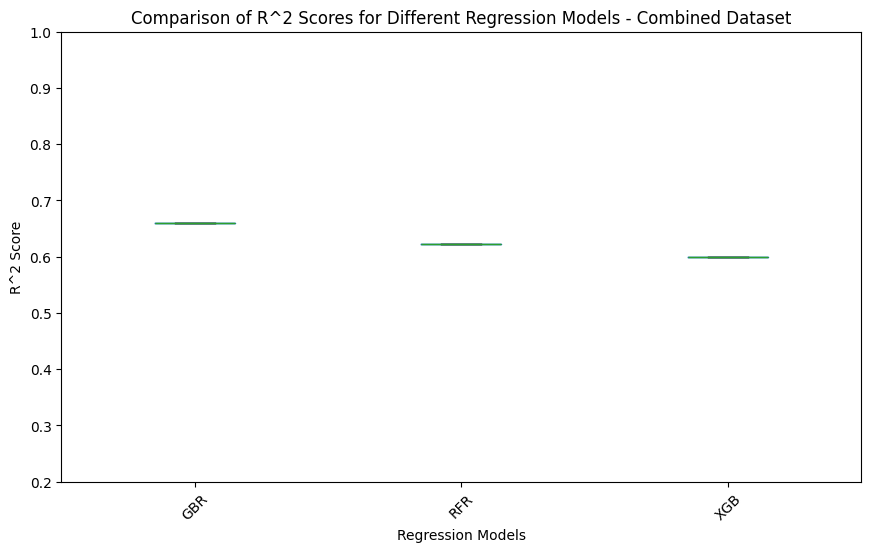

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_read,y_new, test_size = 0.3, random_state =7)

models = []
names = []
results = []

#models.append(('BR', BaggingRegressor(n_estimators=100)))
#models.append(('ETR', ExtraTreesRegressor(max_features=150, min_samples_leaf=20, min_samples_split=15, n_estimators=50)))
#models.append(('ETR', ExtraTreesRegressor(max_features=200, min_samples_leaf=20, min_samples_split=20, n_estimators=50)))
#models.append(('GBR', GradientBoostingRegressor(learning_rate=0.2, loss='huber', n_estimators=300)))
models.append(('GBR', GradientBoostingRegressor(learning_rate=0.2, loss='absolute_error', max_depth=7, n_estimators=400)))
models.append(('RFR', RandomForestRegressor(max_depth=90, max_features=2, min_samples_leaf=2, min_samples_split=6)))
models.append(('XGB', xgb.XGBRegressor(base_score=0.5, booster='gbtree', gamma=0.5, learning_rate=0.2, n_estimators=200)))

for name, model in models:
    model.fit(X_train, y_train)
    m_predict = model.predict(X_test)
    model_scores1=cross_val_score(model,X_train,y_train, cv=3)
    m_score = r2_score(y_test, m_predict)
    names.append(name)
    results.append(m_score)
    print("%s: r2_score = %.3f" % (name, m_score))
    print('MAE:',metrics.mean_absolute_error(y_test, m_predict))
    print('MSE:',metrics.mean_squared_error(y_test, m_predict))
    print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test, m_predict)))

# ##added the following
# # Create a DataFrame from results to facilitate plotting
# results_df = pd.DataFrame({'Model': names, 'R^2 Score': results})

# # Plotting the box plot
# plt.figure(figsize=(10, 6))
# plt.boxplot([results_df[results_df['Model'] == model]['R^2 Score'].values for model in results_df['Model'].unique()], labels=results_df['Model'].unique())
# plt.title("Comparison of R^2 Scores for Different Regression Models")
# plt.xlabel("Regression Models")
# plt.ylabel("R^2 Score")
# plt.xticks(rotation=45)
# plt.grid()
# plt.show()
# Create a DataFrame from results to facilitate plotting
results_df = pd.DataFrame({'Model': names, 'R^2 Score': results})

# Plotting the box plot
plt.figure(figsize=(10, 6))

# ***CHANGE***: Plot only the 'R^2 Score' column and use model names as labels
results_df.boxplot(column=['R^2 Score'], by='Model',  figsize=(10, 6))

plt.title("Comparison of R^2 Scores for Different Regression Models - Combined Dataset")
plt.suptitle('') # Remove the automatic suptitle
plt.xlabel("Regression Models")
plt.ylabel("R^2 Score")
plt.xticks(rotation=45)
plt.grid()

plt.ylim([0.2, 1])
#plt.show()
plt.show()



# X_train,X_test,y_train, y_test = train_test_split(X_read,y_new,test_size = 0.3 , random_state = 7 )
# models = []
# names = []
# results = []

# #models.append(('LR', LinearRegression()))
# #models.append(('R', Ridge()))
# #models.append(('L', Lasso()))
# #models.append(('BR', BayesianRidge(max_iter=1000)))
# #models.append(('KNR', KNeighborsRegressor()))
# #models.append(('DTR', DecisionTreeRegressor()))
# #models.append(('SVR', SVR()))
# models.append(('ABR', AdaBoostRegressor(n_estimators=300)))
# #models.append(('BR', BaggingRegressor(n_estimators=300)))
# models.append(('ETR', ExtraTreesRegressor(n_estimators=300)))
# models.append(('GBR', GradientBoostingRegressor(n_estimators=300)))
# models.append(('RFR', RandomForestRegressor(n_estimators=300)))
# models.append(('XGB', xgb.XGBRegressor()))
# models.append(('CART', CART(iterations=20, learning_rate=0.1, random_seed=123)))

# for name, model in models:
#     model.fit(X_train, y_train)
#     m_predict = model.predict(X_test)
#     model_scores1=cross_val_score(model,X_train,y_train,cv=15)
#     m_score = r2_score(y_test, m_predict)
#     names.append(name)
#     results.append(m_score)
#     print("%s: r2_score = %.3f" % (name, m_score))
#     #print("%s: r2_score = %.3f" % (name, model_scores1))

GBR: r2_score = 0.687
MAE: 1.3844546006286134
MSE: 6.370826957183003
RMSE: 2.524049713690878
RFR: r2_score = 0.738
MAE: 1.2652982513902258
MSE: 5.327385114257313
RMSE: 2.3081128902758015
XGB: r2_score = 0.763
MAE: 1.164510862661986
MSE: 4.831778675769022
RMSE: 2.1981307230847356


<Figure size 3000x1800 with 0 Axes>

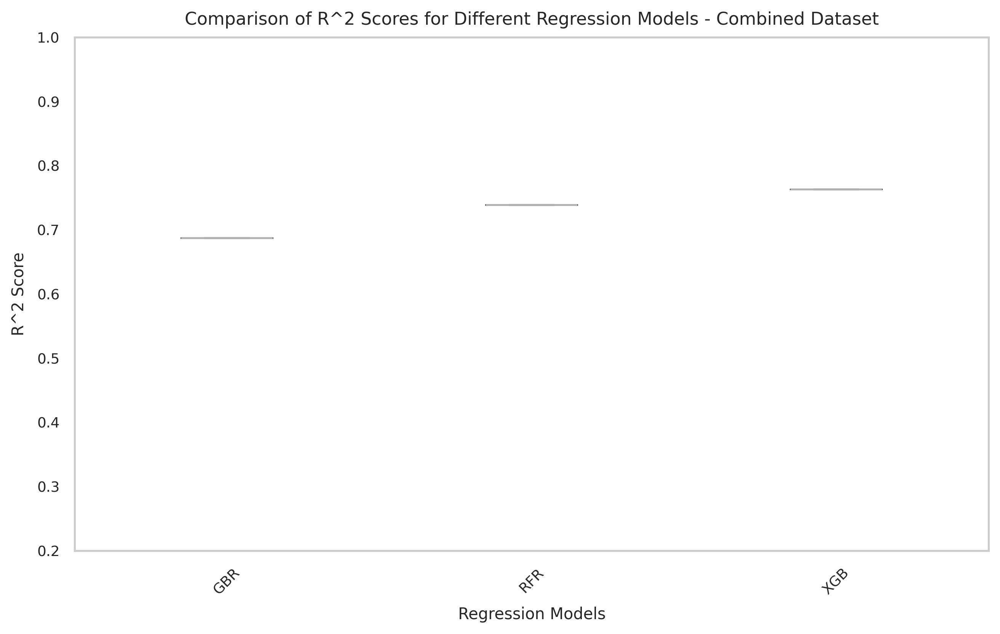

In [ ]:
#redo for plot of new graph
X_train, X_test, y_train, y_test = train_test_split(X_read,y_new, test_size = 0.3, random_state =7)

models = []
names = []
results = []

#models.append(('BR', BaggingRegressor(n_estimators=100)))
#models.append(('ETR', ExtraTreesRegressor(max_features=150, min_samples_leaf=20, min_samples_split=15, n_estimators=50)))
#models.append(('ETR', ExtraTreesRegressor(max_features=200, min_samples_leaf=20, min_samples_split=20, n_estimators=50)))
#models.append(('GBR', GradientBoostingRegressor(learning_rate=0.2, loss='huber', n_estimators=300)))
models.append(('GBR', GradientBoostingRegressor(learning_rate=0.2, loss='absolute_error', max_depth=7, n_estimators=400)))
models.append(('RFR', RandomForestRegressor(max_depth=90, max_features=2, min_samples_leaf=2, min_samples_split=6)))
models.append(('XGB', xgb.XGBRegressor(base_score=0.5, booster='gbtree', gamma=0.5, learning_rate=0.2, n_estimators=200)))

for name, model in models:
    model.fit(X_train, y_train)
    m_predict = model.predict(X_test)
    model_scores1=cross_val_score(model,X_train,y_train, cv=3)
    m_score = r2_score(y_test, m_predict)
    names.append(name)
    results.append(m_score)
    print("%s: r2_score = %.3f" % (name, m_score))
    print('MAE:',metrics.mean_absolute_error(y_test, m_predict))
    print('MSE:',metrics.mean_squared_error(y_test, m_predict))
    print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test, m_predict)))

# ##added the following
# # Create a DataFrame from results to facilitate plotting
# results_df = pd.DataFrame({'Model': names, 'R^2 Score': results})

# # Plotting the box plot
# plt.figure(figsize=(10, 6))
# plt.boxplot([results_df[results_df['Model'] == model]['R^2 Score'].values for model in results_df['Model'].unique()], labels=results_df['Model'].unique())
# plt.title("Comparison of R^2 Scores for Different Regression Models")
# plt.xlabel("Regression Models")
# plt.ylabel("R^2 Score")
# plt.xticks(rotation=45)
# plt.grid()
# plt.show()
# Create a DataFrame from results to facilitate plotting
results_df = pd.DataFrame({'Model': names, 'R^2 Score': results})

# Plotting the box plot
plt.figure(figsize=(10, 6))

# ***CHANGE***: Plot only the 'R^2 Score' column and use model names as labels
results_df.boxplot(column=['R^2 Score'], by='Model',  figsize=(10, 6))

plt.title("Comparison of R^2 Scores for Different Regression Models - Combined Dataset")
plt.suptitle('') # Remove the automatic suptitle
plt.xlabel("Regression Models")
plt.ylabel("R^2 Score")
plt.xticks(rotation=45)
plt.grid()

plt.ylim([0.2, 1])
#plt.show()
plt.show()

GBR: r2_score = 0.697
MAE: 1.2764897022637667
MSE: 6.503646906622417
RMSE: 2.5502248737361217
RFR: r2_score = 0.642
MAE: 1.406409759571859
MSE: 7.685514464557592
RMSE: 2.772276044075985
XGB: r2_score = 0.589
MAE: 1.5692283038006802
MSE: 8.830236168358551
RMSE: 2.9715713298452977


<Figure size 1000x600 with 0 Axes>

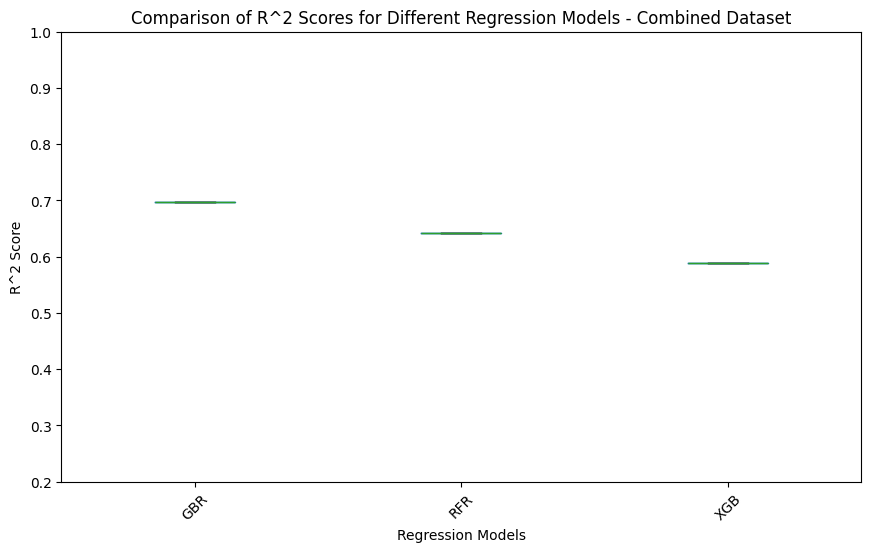

In [ ]:
# Instead of recreating the model, use the optimized one
best_gbr_model = GBR_opt.best_estimator_
best_rfr_model = RFR_opt.best_estimator_
best_xgb_model = XGB.best_estimator_

models = []
names = []
results = []

models.append(('GBR', best_gbr_model))  # Use the GridSearchCV result directly
models.append(('RFR', best_rfr_model))
models.append(('XGB', best_xgb_model))

for name, model in models:
    model.fit(X_train, y_train)
    m_predict = model.predict(X_test)
    model_scores1=cross_val_score(model,X_train,y_train)
    m_score = r2_score(y_test, m_predict)
    names.append(name)
    results.append(m_score)
    print("%s: r2_score = %.3f" % (name, m_score))
    print('MAE:',metrics.mean_absolute_error(y_test, m_predict))
    print('MSE:',metrics.mean_squared_error(y_test, m_predict))
    print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test, m_predict)))

results_df = pd.DataFrame({'Model': names, 'R^2 Score': results})

# Plotting the box plot
plt.figure(figsize=(10, 6))

# ***CHANGE***: Plot only the 'R^2 Score' column and use model names as labels
results_df.boxplot(column=['R^2 Score'], by='Model',  figsize=(10, 6))

plt.title("Comparison of R^2 Scores for Different Regression Models - Combined Dataset")
plt.suptitle('') # Remove the automatic suptitle
plt.xlabel("Regression Models")
plt.ylabel("R^2 Score")
plt.xticks(rotation=45)
plt.grid()

plt.ylim([0.2, 1])
#plt.show()
plt.show()

GBR: r2_score = 0.660
MAE: 1.3590546606561695
MSE: 6.9181779499553215
RMSE: 2.630242945044302
RFR: r2_score = 0.739
MAE: 1.2548973924625206
MSE: 5.3098748981625326
RMSE: 2.304316579414064
XGB: r2_score = 0.694
MAE: 1.2500119588526515
MSE: 6.243003833607349
RMSE: 2.4986003749314034


<Figure size 3000x1800 with 0 Axes>

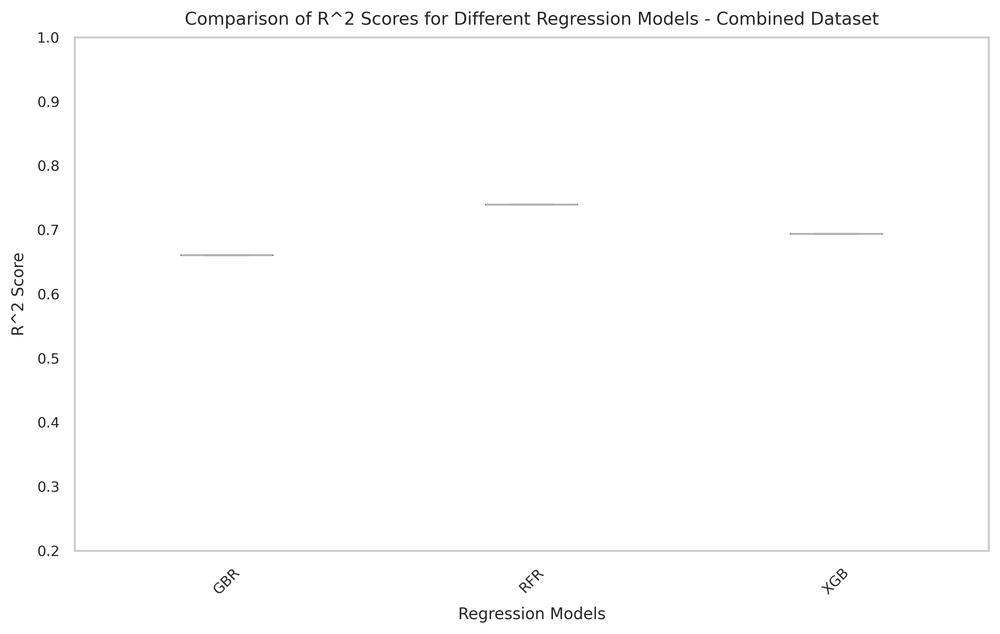

In [ ]:
#redo for plot
# Instead of recreating the model, use the optimized one
best_gbr_model = GBR_opt.best_estimator_
best_rfr_model = RFR_opt.best_estimator_
best_xgb_model = XGB.best_estimator_

models = []
names = []
results = []

models.append(('GBR', best_gbr_model))  # Use the GridSearchCV result directly
models.append(('RFR', best_rfr_model))
models.append(('XGB', best_xgb_model))

for name, model in models:
    model.fit(X_train, y_train)
    m_predict = model.predict(X_test)
    model_scores1=cross_val_score(model,X_train,y_train)
    m_score = r2_score(y_test, m_predict)
    names.append(name)
    results.append(m_score)
    print("%s: r2_score = %.3f" % (name, m_score))
    print('MAE:',metrics.mean_absolute_error(y_test, m_predict))
    print('MSE:',metrics.mean_squared_error(y_test, m_predict))
    print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test, m_predict)))

results_df = pd.DataFrame({'Model': names, 'R^2 Score': results})

# Plotting the box plot
plt.figure(figsize=(10, 6))

# ***CHANGE***: Plot only the 'R^2 Score' column and use model names as labels
results_df.boxplot(column=['R^2 Score'], by='Model',  figsize=(10, 6))

plt.title("Comparison of R^2 Scores for Different Regression Models - Combined Dataset")
plt.suptitle('') # Remove the automatic suptitle
plt.xlabel("Regression Models")
plt.ylabel("R^2 Score")
plt.xticks(rotation=45)
plt.grid()

plt.ylim([0.2, 1])
#plt.show()
plt.show()

## Final Model

In [ ]:
#Choose the best model
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.ensemble import GradientBoostingRegressor
#GBR = GradientBoostingRegressor(learning_rate=0.2, loss='absolute_error', n_estimators=150)
#GBR = GradientBoostingRegressor(learning_rate=0.2, loss='huber', n_estimators=300)
#XGB = xgb.XGBRegressor(base_score=0.5, booster='gbtree', gamma=0.5, learning_rate=0.2, n_estimators=200)
#Pipeline = make_pipeline(StandardScaler(), GradientBoostingRegressor(loss='absolute_error', max_depth=7, n_estimators=180))
XGB = best_gbr_model
XGB.fit(X_train, y_train)

# Set up K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=123)

# Perform cross-validation and get predictions
y_pred = cross_val_predict(XGB, X_test, y_test, cv=kf)

#y_pred = BR.predict(X_test)

In [ ]:
y_validation = y_test.reset_index(drop=True)
y_pred_df = pd.DataFrame({'Corrosion_rate_predict': y_pred.flatten()})

In [ ]:
#Comparison = y_test.join(y_pred_df) #Comparing the predicted price vs original price by joining them
Comparison= pd.merge(y_validation, y_pred_df, left_index=True, right_index=True)
Comparison.head(10)

,Corrosion rate,Corrosion_rate_predict
0,7.935091,8.149692
1,0.082000,0.141645
2,0.070500,3.278523
3,19.000000,17.848908
4,10.050000,7.074733
5,0.075000,0.092662
6,4.300000,4.497770
7,5.510529,5.604061
8,0.056000,0.034380
9,6.146341,6.468506


In [ ]:
#for replot
#Comparison = y_test.join(y_pred_df) #Comparing the predicted price vs original price by joining them
Comparison= pd.merge(y_validation, y_pred_df, left_index=True, right_index=True)
Comparison.head(10)

,Corrosion rate,Corrosion_rate_predict
0,5.692982,6.626550
1,0.046000,0.472390
2,0.063000,-0.012907
3,8.100000,2.734137
4,6.444615,6.445886
5,0.134000,5.181001
6,4.200000,4.229970
7,9.500000,5.549838
8,0.242000,2.610636
9,6.039669,7.223288


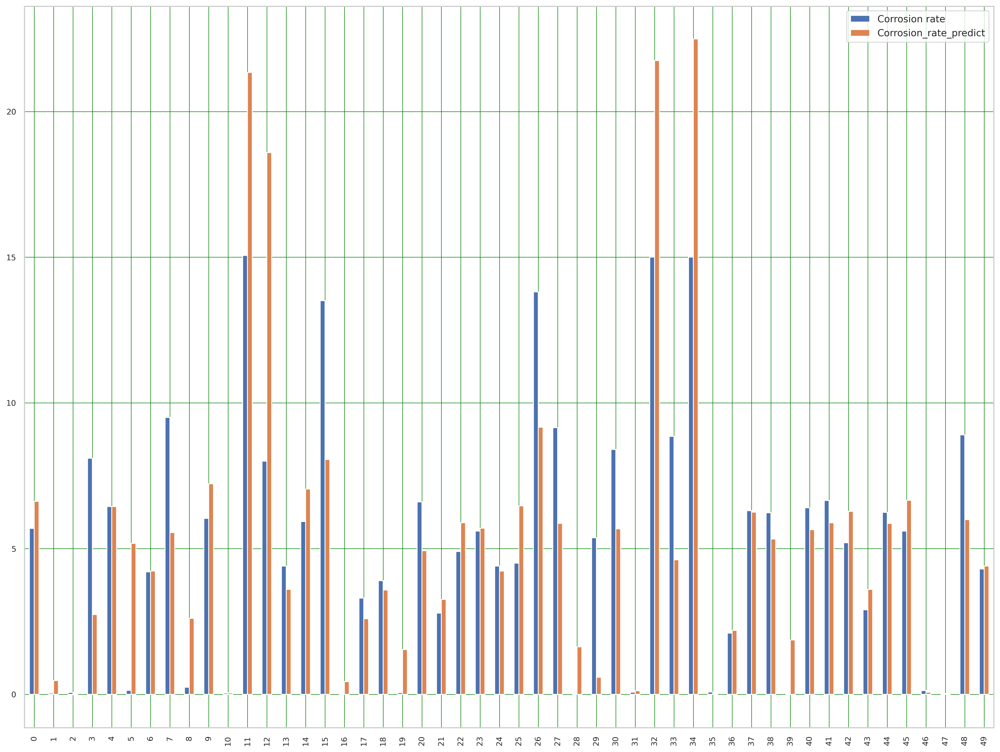

In [ ]:
x = 50
comparison = Comparison.head(x)
comparison.plot(kind = 'bar', figsize = (20,15))
bmw_pred = plt.grid(linestyle = '-', linewidth = '0.6', color = 'green', which = 'both')
plt.show()

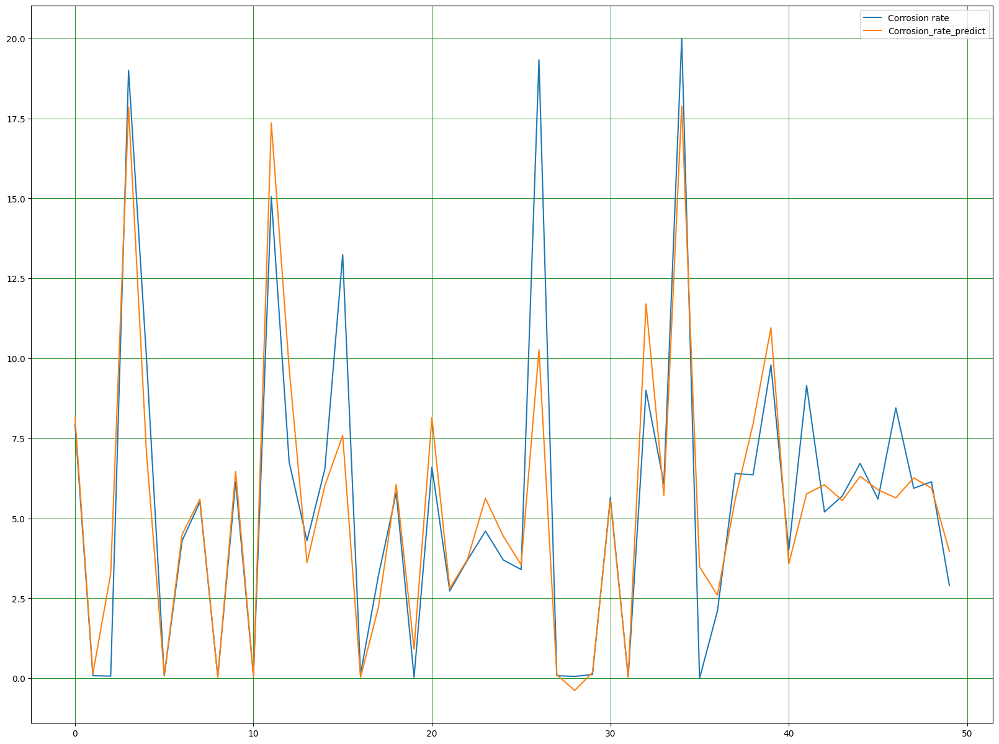

In [ ]:
x = 50
comparison = Comparison.head(x)
comparison.plot(kind = 'line', figsize = (20,15))
bmw_pred = plt.grid(linestyle = '-', linewidth = '0.6', color = 'green', which = 'both')
plt.show()

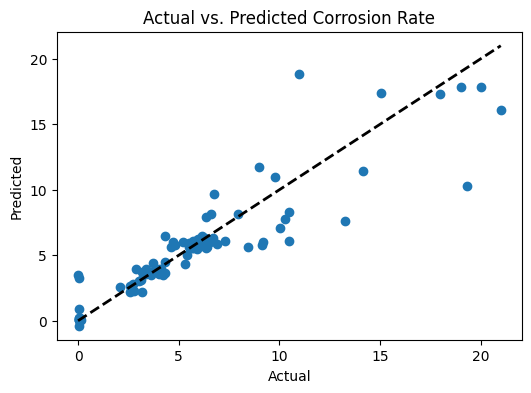

In [ ]:
# Plot the actual vs. predicted values
fig, ax = plt.subplots(figsize=(6, 4))
ax.scatter(y_validation, y_pred_df)
ax.plot([y_new.min(), y_new.max()], [y_new.min(), y_new.max()], "k--", lw=2)
ax.set_xlabel("Actual")
ax.set_ylabel("Predicted")
ax.set_title("Actual vs. Predicted Corrosion Rate")
plt.show()

In [ ]:
#plot histogram to compare distribution of actual outcomes vs. prediction
def plot_histogram_comp(x,y):
  plt.figure(figsize = (12,6))
  plt.hist(x, alpha=0.5, edgecolor='black', label='Actual')
  plt.hist(y, alpha=0.5, edgecolor='black', label='Predicted')
  plt.title("Histogram of actual outcomes vs predicted outcomes")
  plt.xlabel('Corrosion Rate')
  plt.ylabel('Frequency')
  plt.legend(loc='upper left')
  plt.show()

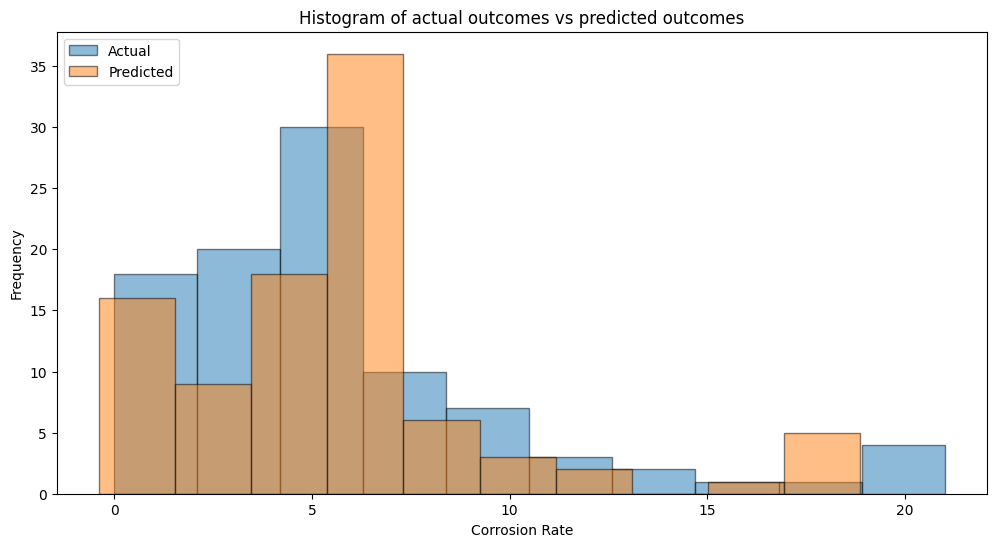

In [ ]:
#check to see ifdistribution of actual target values is close to the distribution
#of predicted target outcomes
plot_histogram_comp(y_validation, y_pred_df)

Text(0.5, 1.0, 'Residual Plot')

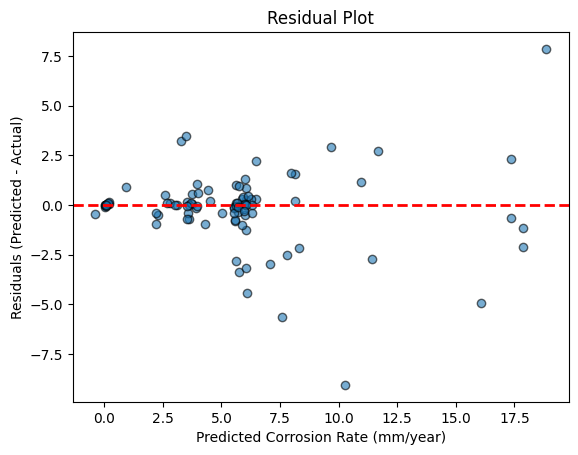

In [ ]:
residuals = y_pred - y_test
plt.scatter(y_pred, residuals, alpha=0.6, edgecolors='k')
plt.axhline(y=0, color='r', linestyle='--', lw=2)
plt.xlabel('Predicted Corrosion Rate (mm/year)')
plt.ylabel('Residuals (Predicted - Actual)')
plt.title('Residual Plot')

Text(0.5, 1.0, 'Prediction Error by Corrosion Severity')

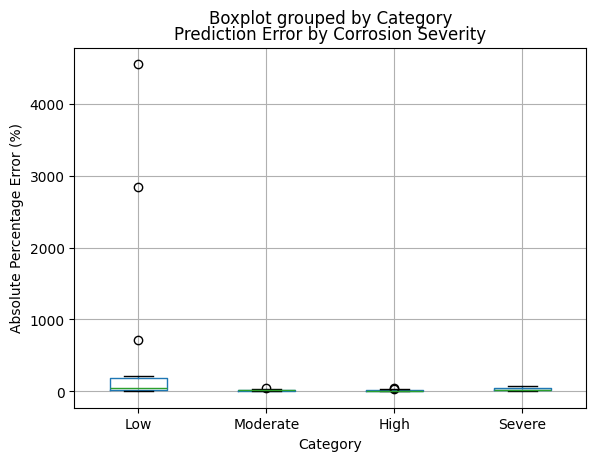

In [ ]:
# Categorize predictions
categories = pd.cut(y_test, bins=[0, 1, 5, 10, 50],
                    labels=['Low', 'Moderate', 'High', 'Severe'])
error_by_category = pd.DataFrame({
    'Category': categories,
    'Absolute_Error': np.abs(y_pred - y_test),
    'Percentage_Error': np.abs((y_pred - y_test) / y_test * 100)
})

# Box plot
error_by_category.boxplot(column='Percentage_Error', by='Category')
plt.ylabel('Absolute Percentage Error (%)')
plt.title('Prediction Error by Corrosion Severity')

Text(0.5, 1.0, 'Prediction Error by Corrosion Severity')

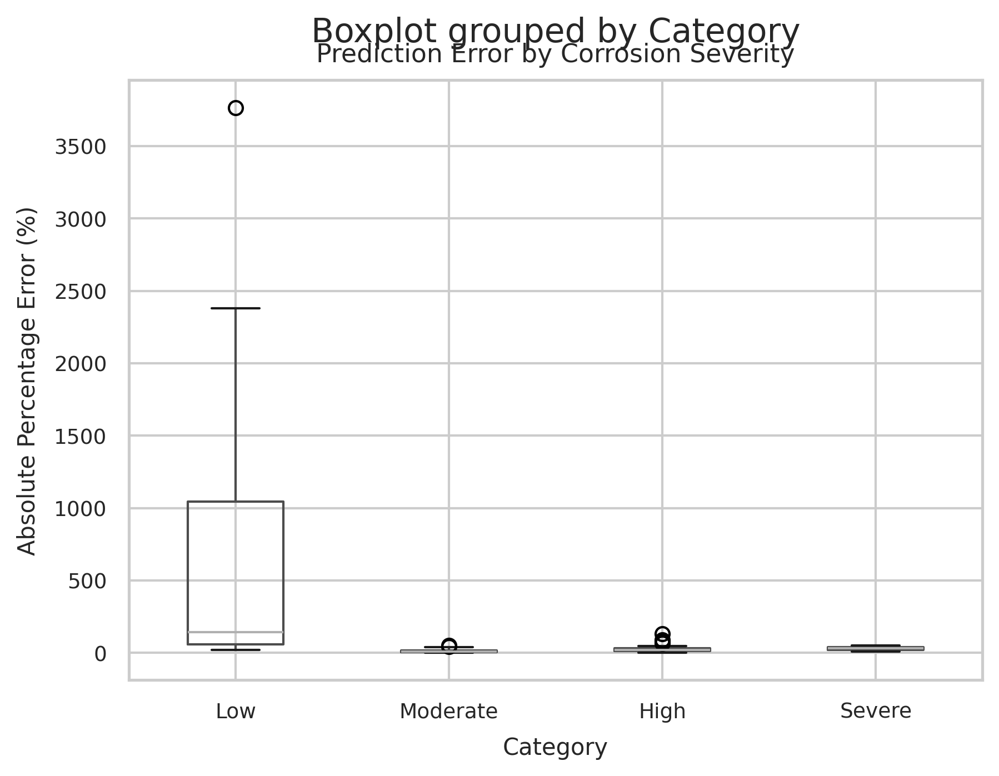

In [ ]:
#replot
# Categorize predictions
categories = pd.cut(y_test, bins=[0, 1, 5, 10, 50],
                    labels=['Low', 'Moderate', 'High', 'Severe'])
error_by_category = pd.DataFrame({
    'Category': categories,
    'Absolute_Error': np.abs(y_pred - y_test),
    'Percentage_Error': np.abs((y_pred - y_test) / y_test * 100)
})

# Box plot
error_by_category.boxplot(column='Percentage_Error', by='Category')
plt.ylabel('Absolute Percentage Error (%)')
plt.title('Prediction Error by Corrosion Severity')

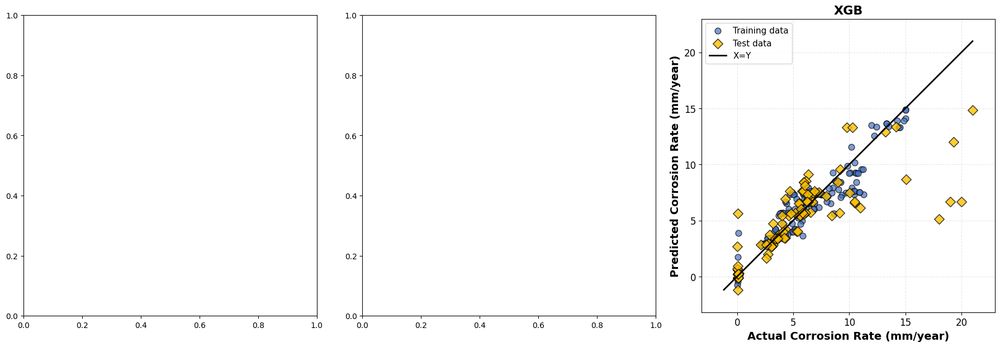

In [ ]:
#On the same plot

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_read, y_new, test_size=0.3, random_state=7)

# Define models
models = best_gbr_model

# Train models and get predictions
trained_models = {}
predictions_train = {}
predictions_test = {}

#for name, model in models.items():
model.fit(X_train, y_train)
trained_models[name] = model
predictions_train[name] = model.predict(X_train)
predictions_test[name] = model.predict(X_test)

# Create figure with 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

#for idx, (name, model) in enumerate(models.items()):
ax = axes[idx]

    # Plot training data (blue circles)
ax.scatter(y_train, predictions_train[name],
               s=60, facecolors='#4472C4', edgecolors='black',
               linewidths=1, alpha=0.7, label='Training data')

    # Plot test data (yellow diamonds)
ax.scatter(y_test, predictions_test[name],
               s=80, facecolors='#FFC000', edgecolors='black',
               marker='D', linewidths=1, alpha=0.8, label='Test data')

    # Perfect prediction line (X=Y)
max_val = max(y_train.max(), y_test.max(),
                  predictions_train[name].max(), predictions_test[name].max())
min_val = min(y_train.min(), y_test.min(),
                  predictions_train[name].min(), predictions_test[name].min())
ax.plot([min_val, max_val], [min_val, max_val],
            'k-', linewidth=2, label='X=Y')

    # Labels and title (MODIFIED FOR CORROSION RATE)
ax.set_xlabel('Actual Corrosion Rate (mm/year)', fontsize=14, fontweight='bold')
ax.set_ylabel('Predicted Corrosion Rate (mm/year)', fontsize=14, fontweight='bold')
ax.set_title(name, fontsize=16, fontweight='bold')

    # Set equal aspect ratio and limits
ax.set_xlim(min_val-2, max_val+2)
ax.set_ylim(min_val-2, max_val+2)
ax.set_aspect('equal', adjustable='box')

    # Add legend
ax.legend(loc='upper left', fontsize=11, frameon=True)

    # Grid
ax.grid(True, alpha=0.3, linestyle='--')

    # Tick parameters
ax.tick_params(axis='both', labelsize=12)

plt.tight_layout()
plt.show()

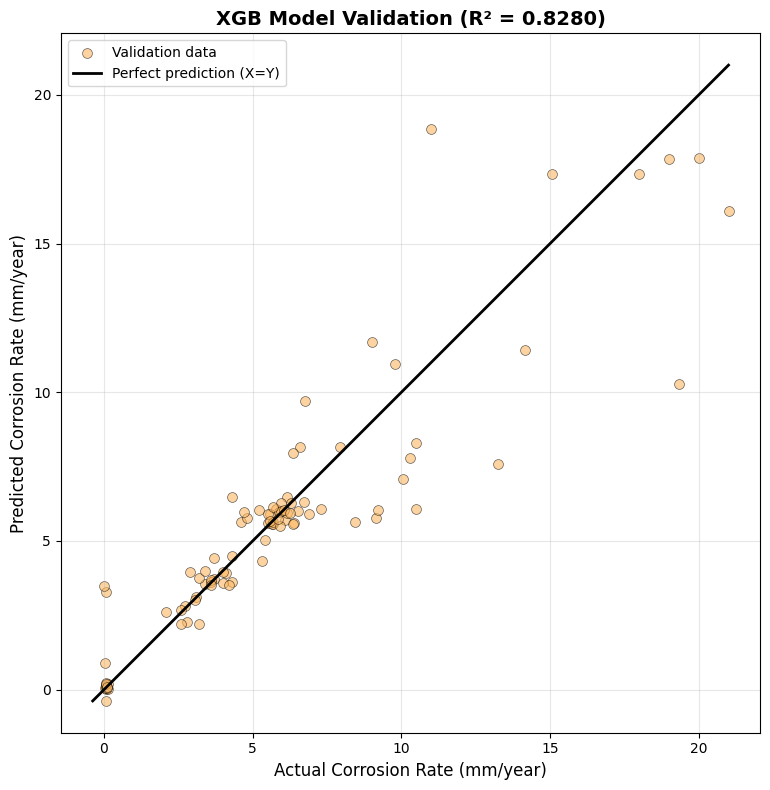

Validation R²: 0.8280
Validation MAE: 1.0560 mm/year
Validation RMSE: 1.9218 mm/year


In [ ]:
y_val_actual = y_test
y_val_pred = y_pred_df

# Assuming you have:
# y_val_actual: actual validation corrosion rates (can be Series or array)
# y_val_pred: predicted validation corrosion rates from your XGBoost model

# Convert to numpy arrays if they are pandas Series
if isinstance(y_val_actual, pd.Series):
    y_val_actual = y_val_actual.values
if isinstance(y_val_pred, pd.Series):
    y_val_pred = y_val_pred.values

fig, ax = plt.subplots(figsize=(10, 8))

# Plot validation data points
ax.scatter(y_val_actual, y_val_pred, alpha=0.6, s=50,
           color='#FDB863', edgecolors='black', linewidth=0.5,
           label='Validation data')

# Add perfect prediction line (X=Y)
min_val = min(np.min(y_val_actual), np.min(y_val_pred))
max_val = max(np.max(y_val_actual), np.max(y_val_pred))
ax.plot([min_val, max_val], [min_val, max_val], 'k-',
        linewidth=2, label='Perfect prediction (X=Y)')

# Calculate R² score for validation
from sklearn.metrics import r2_score
r2_val = r2_score(y_val_actual, y_val_pred)

# Add labels and title
ax.set_xlabel('Actual Corrosion Rate (mm/year)', fontsize=12)
ax.set_ylabel('Predicted Corrosion Rate (mm/year)', fontsize=12)
ax.set_title(f'GBR Model Validation (R² = {r2_val:.4f})', fontsize=14, fontweight='bold')

# Add grid
ax.grid(True, alpha=0.3)

# Add legend
ax.legend(loc='upper left')

# Make the plot square
ax.set_aspect('equal', adjustable='box')

plt.tight_layout()
plt.show()

# Optional: Print metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error
mae = mean_absolute_error(y_val_actual, y_val_pred)
rmse = np.sqrt(mean_squared_error(y_val_actual, y_val_pred))
print(f"Validation R²: {r2_val:.4f}")
print(f"Validation MAE: {mae:.4f} mm/year")
print(f"Validation RMSE: {rmse:.4f} mm/year")

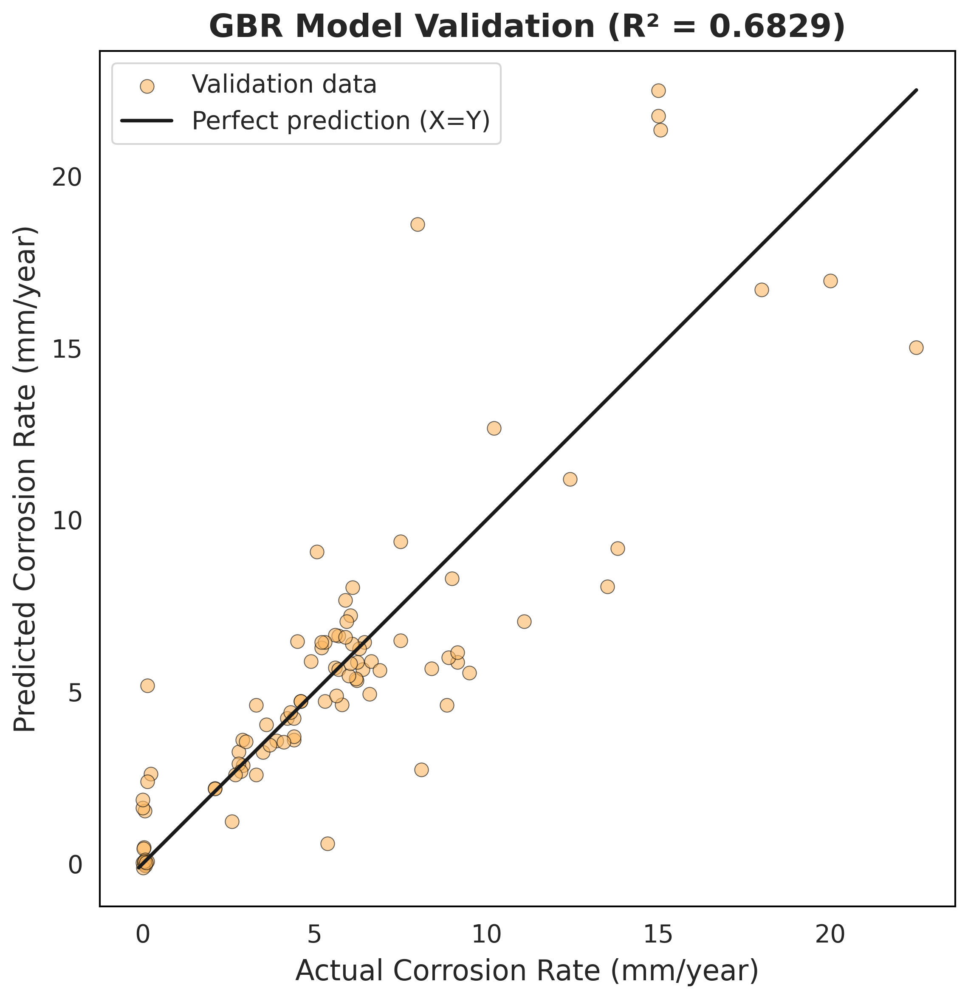

Validation R²: 0.6829
Validation MAE: 1.5601 mm/year
Validation RMSE: 2.5418 mm/year


In [ ]:
#Replot
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

plt.rcParams['figure.dpi'] = 300

y_val_actual = y_test
y_val_pred = y_pred_df

# Convert to numpy arrays if they are pandas Series
if isinstance(y_val_actual, pd.Series):
    y_val_actual = y_val_actual.values
if isinstance(y_val_pred, pd.Series):
    y_val_pred = y_val_pred.values

fig, ax = plt.subplots(figsize=(10, 8))

# Plot validation data points
ax.scatter(y_val_actual, y_val_pred, alpha=0.6, s=60,
           color='#FDB863', edgecolors='black', linewidth=0.5,
           label='Validation data')

# Add perfect prediction line (X=Y)
min_val = min(np.min(y_val_actual), np.min(y_val_pred))
max_val = max(np.max(y_val_actual), np.max(y_val_pred))
ax.plot([min_val, max_val], [min_val, max_val], 'k-',
        linewidth=2, label='Perfect prediction (X=Y)')

# Calculate R² score for validation
r2_val = r2_score(y_val_actual, y_val_pred)

# Add labels and title
ax.set_xlabel('Actual Corrosion Rate (mm/year)', fontsize=16)
ax.set_ylabel('Predicted Corrosion Rate (mm/year)', fontsize=16)
ax.set_title(f'GBR Model Validation (R² = {r2_val:.4f})', fontsize=18, fontweight='bold')

# Tick label sizes
ax.tick_params(axis='both', labelsize=14)

# Remove grid
ax.grid(False)

# Add legend
ax.legend(loc='upper left', fontsize=14)

# Set black box (spines) around plot
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1.0)

# Make the plot square
ax.set_aspect('equal', adjustable='box')

plt.tight_layout()
plt.savefig('gbr_validation.png', dpi=300, bbox_inches='tight')
plt.show()

# Print metrics
mae = mean_absolute_error(y_val_actual, y_val_pred)
rmse = np.sqrt(mean_squared_error(y_val_actual, y_val_pred))
print(f"Validation R²: {r2_val:.4f}")
print(f"Validation MAE: {mae:.4f} mm/year")
print(f"Validation RMSE: {rmse:.4f} mm/year")

#Test on new data set

In [ ]:
import pandas as pd
import numpy as np

# Set random seed for reproducibility
np.random.seed(42)

# Define the possible values for each parameter based on Table 1 and Table 3
temperature = [60, 70, 75]  # °C
pressure = [60, 65, 70]  # bar
pco2 = [0.3, 0.4, 0.5]  # bar
flow_velocity = [0.7, 1.1, 1.6]  # m/s
inhibitor_efficiency = [40, 50, 60]  # %

# Generate 10 rows of dummy data
n_rows = 10
data = {
    'T (°C)': np.random.choice(temperature, n_rows),
    'P (bar)': np.random.choice(pressure, n_rows),
    'pCO2 (bar)': np.random.choice(pco2, n_rows),
    'V (m/s)': np.random.choice(flow_velocity, n_rows),
    'I (%)': np.random.choice(inhibitor_efficiency, n_rows)
}

# Create DataFrame
df = pd.DataFrame(data)

# Calculate pH based on the ranges in the paper (4.2, 4.3, 4.4)
# Simplified calculation: lower pCO2 → higher pH
ph_values = []
for pco2_val in df['pCO2 (bar)']:
    if pco2_val == 0.3:
        ph_values.append(4.4)
    elif pco2_val == 0.4:
        ph_values.append(4.3)
    else:  # 0.5
        ph_values.append(4.2)

df['pH'] = ph_values

# Calculate Shear stress based on the ranges in the paper (1, 2, 4 Pa)
# Simplified: higher velocity → higher shear stress
shear_values = []
for vel in df['V (m/s)']:
    if vel == 0.7:
        shear_values.append(1)
    elif vel == 1.1:
        shear_values.append(2)
    else:  # 1.6
        shear_values.append(4)

df['Shear (Pa)'] = shear_values

# Simulate corrosion rate (mm/year) based on conditions
# Higher temperature, higher pCO2, higher velocity → higher corrosion rate
# Higher inhibitor efficiency → lower corrosion rate
corrosion_rates = []
for idx, row in df.iterrows():
    # Base rate calculation (simplified)
    base_rate = (row['T (°C)'] / 30) + (row['pCO2 (bar)'] * 5) + (row['V (m/s)'])
    # Apply inhibitor effect
    inhibitor_reduction = row['I (%)'] / 100
    final_rate = base_rate * (1 - inhibitor_reduction * 0.5)
    # Add some random variation
    final_rate += np.random.uniform(-0.3, 0.3)
    # Clip to reasonable range (1-4 mm/year as per paper)
    final_rate = np.clip(final_rate, 1.0, 4.0)
    corrosion_rates.append(round(final_rate, 1))

df['Corrosion rate (mm/year)'] = corrosion_rates

# Display the dataset
print("Oil Pipeline CO2 Corrosion Dataset")
print("=" * 80)
print(df.to_string(index=True))
print("\n" + "=" * 80)
print("\nDataset Statistics:")
print(df.describe().round(2))

# Save to CSV (optional)
df.to_csv('pipeline_corrosion_data.csv', index=False)
print("\n✓ Dataset saved to 'pipeline_corrosion_data.csv'")

Oil Pipeline CO2 Corrosion Dataset
   T (°C)  P (bar)  pCO2 (bar)  V (m/s)  I (%)   pH  Shear (Pa)  Corrosion rate (mm/year)
0      75       70         0.3      1.1     40  4.4           2                       4.0
1      60       70         0.3      1.6     60  4.4           4                       3.3
2      75       60         0.4      1.1     60  4.3           2                       3.8
3      75       70         0.4      1.1     40  4.3           2                       4.0
4      60       65         0.3      1.6     40  4.4           4                       4.0
5      60       60         0.3      1.1     60  4.4           2                       3.3
6      75       65         0.3      1.6     50  4.4           4                       4.0
7      70       65         0.5      1.6     40  4.2           4                       4.0
8      75       65         0.5      0.7     50  4.2           1                       4.0
9      75       65         0.5      1.6     50  4.2           4  

In [ ]:
Xd = pd.read_csv("/content/pipeline_corrosion_data.csv")
#Xd = pd.read_csv("//content/generated_dataset.csv")
#Xd = pd.read_csv("/content/China_pipeline_data.csv")

In [ ]:
Xd.describe()

,T (°C),P (bar),pCO2 (bar),V (m/s),I (%),pH,Shear (Pa),Corrosion rate (mm/year)
count,10.000000,10.000000,10.000000,10.000000,10.00000,10.000000,10.000000,10.000000
mean,70.000000,65.500000,0.380000,1.310000,49.00000,4.320000,2.900000,3.840000
std,7.071068,3.689324,0.091894,0.328126,8.75595,0.091894,1.197219,0.291357
min,60.000000,60.000000,0.300000,0.700000,40.00000,4.200000,1.000000,3.300000
25%,62.500000,65.000000,0.300000,1.100000,40.00000,4.225000,2.000000,3.850000
50%,75.000000,65.000000,0.350000,1.350000,50.00000,4.350000,3.000000,4.000000
75%,75.000000,68.750000,0.475000,1.600000,57.50000,4.400000,4.000000,4.000000
max,75.000000,70.000000,0.500000,1.600000,60.00000,4.400000,4.000000,4.000000


In [ ]:
Xd.shape

(10, 8)

In [ ]:
Xd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   T (°C)                    10 non-null     int64  
 1   P (bar)                   10 non-null     int64  
 2   pCO2 (bar)                10 non-null     float64
 3   V (m/s)                   10 non-null     float64
 4   I (%)                     10 non-null     int64  
 5   pH                        10 non-null     float64
 6   Shear (Pa)                10 non-null     int64  
 7   Corrosion rate (mm/year)  10 non-null     float64
dtypes: float64(4), int64(4)
memory usage: 772.0 bytes


In [ ]:
Xd.head()

,T (°C),P (bar),pCO2 (bar),V (m/s),I (%),pH,Shear (Pa),Corrosion rate (mm/year)
0,75,70,0.3,1.1,40,4.4,2,4.0
1,60,70,0.3,1.6,60,4.4,4,3.3
2,75,60,0.4,1.1,60,4.3,2,3.8
3,75,70,0.4,1.1,40,4.3,2,4.0
4,60,65,0.3,1.6,40,4.4,4,4.0


In [ ]:
Xd_test = Xd.drop(["fCO2_bar",	"u_m",	"D_m",	"rho_m",	"mu_m",	"friction_factor",	"glycol_wt",	"O2_ppm",	"H2S_ppm",	"m506_in_domain",	"m506_low_confidence",	"m506_in_scope",	"m506_messages"], axis=1)

In [ ]:
Xd_test.head()

,Temperature,Internal pressure,CO2 pressure,pH,S_Pa,Corrosion Inhibitor efficiency,CR_no_inhib_mm_per_y,Corrosion rate
0,97.422958,71.029447,8.277995,5.738449,1.558931,45.912058,15.923950,8.612937
1,100.561389,40.954858,5.162964,6.250549,13.772465,52.376069,17.249920,8.215090
2,88.247634,69.061346,7.312534,6.369371,16.421136,52.248638,21.483731,10.258774
3,24.467689,78.230926,8.482617,6.233288,23.374368,40.518240,18.470045,10.986308
4,91.546033,70.876676,8.314055,6.304800,1.164806,34.104228,14.525664,9.571799


In [ ]:
Xd_check = Xd_test.drop(["S_Pa", "CR_no_inhib_mm_per_y"], axis=1)

In [ ]:
Xd_check.head()

,Temperature,Internal pressure,CO2 pressure,pH,Corrosion Inhibitor efficiency,Corrosion rate
0,97.422958,71.029447,8.277995,5.738449,45.912058,8.612937
1,100.561389,40.954858,5.162964,6.250549,52.376069,8.215090
2,88.247634,69.061346,7.312534,6.369371,52.248638,10.258774
3,24.467689,78.230926,8.482617,6.233288,40.518240,10.986308
4,91.546033,70.876676,8.314055,6.304800,34.104228,9.571799


In [ ]:
Xd_check.describe()

,Temperature,Internal pressure,CO2 pressure,pH,Corrosion Inhibitor efficiency,Corrosion rate
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,95.934399,75.490882,6.197064,5.959283,51.192886,9.559110
std,35.147362,40.128413,2.561407,0.449650,24.412300,6.766429
min,12.022596,5.707905,0.496792,3.990278,1.277433,0.431877
25%,74.021433,41.845157,4.070065,5.728525,31.884765,4.419700
50%,100.624087,71.706235,6.868941,6.061065,51.212880,7.758379
75%,127.403310,106.268165,8.332718,6.278331,74.178748,12.690808
max,148.741990,149.903957,9.951485,6.486522,89.603682,31.930175


In [ ]:
Xd_check.isnull().sum()

,0
Temperature,0
Internal pressure,0
CO2 pressure,0
pH,0
Corrosion Inhibitor efficiency,0
Corrosion rate,0


In [ ]:
#Check for outliers
def detect_outlier(Xd):
    List_outliers = []
    threshold=3
    mean = Xd.mean()
    std = Xd.std()
    for y in range(0, len(Xd.columns)):
        outliers = 0
        for x in range(0, len(Xd.index)):
            z_score= (Xd.iloc[x,y] - mean[y])/std[y]
            if abs(z_score) > threshold:
                outliers += 1
                List_outliers.append(Xd.columns[y])
        print("\n Column ", y, " has",outliers,"outliers")
    List_outliers = set(List_outliers)
    print("\nThe columns with outliers are as follows: \n", List_outliers)
    return outliers
out_X = detect_outlier(Xd)


 Column  0  has 0 outliers

 Column  1  has 0 outliers

 Column  2  has 0 outliers

 Column  3  has 0 outliers

 Column  4  has 0 outliers

 Column  5  has 0 outliers

 Column  6  has 0 outliers

 Column  7  has 0 outliers

The columns with outliers are as follows: 
 set()


/tmp/ipython-input-3483845378.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  z_score= (Xd.iloc[x,y] - mean[y])/std[y]


In [ ]:
Xcheck = Xd.drop(['Corrosion rate (mm/year)'], axis=1)
ycheck = Xd['Corrosion rate (mm/year)']

# Xcheck = Xd.drop(['Corrosion rate'], axis=1)
# ycheck = Xd['Corrosion rate']

In [ ]:
Xcheck = Xcheck.drop(['Shear (Pa)','P (bar)'], axis=1)

In [ ]:
Xcheck.head()

,T (°C),pCO2 (bar),V (m/s),I (%),pH
0,75,0.3,1.1,40,4.4
1,60,0.3,1.6,60,4.4
2,75,0.4,1.1,60,4.3
3,75,0.4,1.1,40,4.3
4,60,0.3,1.6,40,4.4


In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
rescaledX = scaler.fit_transform(Xcheck)
X_check =rescaledX

In [ ]:
#split data into train and test dataset
X_train,X_test,y_train, y_test = train_test_split(X_check,ycheck,test_size = 0.3 , random_state = 7 )

In [ ]:
# Predict corrosion rate (no true labels)
y_unseen_pred = XGB.predict(X_check)

# Add to DataFrame for inspection
unseen_results = pd.DataFrame({
    "Predicted_Corrosion_Rate": y_unseen_pred
})
print(unseen_results.head())

   Predicted_Corrosion_Rate
0                  1.380648
1                  1.513505
2                 13.017350
3                 12.801055
4                  1.535733


In [ ]:
import pandas as pd
import numpy as np

# Assume these exist:
y_test = ycheck
y_pred = y_unseen_pred

# Compute percentage error
percentage_error = np.abs((y_test - y_pred) / y_test) * 100

# Combine into a comparison table
comparison_df = pd.DataFrame({
    "Actual (y_test)": y_test,
    "Predicted (y_pred)": y_pred,
    "Percentage Error (%)": percentage_error
})

# Round for readability
comparison_df = comparison_df.round(4)

# Print summary table
print(comparison_df.head(10))  # display first 10 rows

# Optionally compute the mean percentage error
mape = np.mean(percentage_error)
print(f"\nMean Absolute Percentage Error (MAPE): {mape:.2f}%")


   Actual (y_test)  Predicted (y_pred)  Percentage Error (%)
0              4.0              1.3806               65.4838
1              3.3              1.5135               54.1362
2              3.8             13.0174              242.5618
3              4.0             12.8011              220.0264
4              4.0              1.5357               61.6067
5              3.3              1.4997               54.5543
6              4.0              1.2993               67.5173
7              4.0             13.5314              238.2856
8              4.0             13.5688              239.2205
9              4.0             13.5314              238.2856

Mean Absolute Percentage Error (MAPE): 148.17%


In [ ]:
from sklearn.metrics import r2_score
import pandas as pd

# Example: if you already have predictions and actual values
# y_unseen_pred = model.predict(X_unseen)
# y_actual = y_unseen  # true values from unseen dataset

# Compute R² score
r2 = r2_score(y_test, y_unseen_pred)

# Print the result
print(f"R² Score on unseen data: {r2:.4f}")

# Optional — make a comparison table
comparison_df = pd.DataFrame({
    'Actual Corrosion Rate': y_test,
    'Predicted Corrosion Rate': y_unseen_pred
})

print("\nComparison (first 10 rows):")
print(comparison_df.head(10))


R² Score on unseen data: -604.1524

Comparison (first 10 rows):
   Actual Corrosion Rate  Predicted Corrosion Rate
0                    4.0                  1.380648
1                    3.3                  1.513505
2                    3.8                 13.017350
3                    4.0                 12.801055
4                    4.0                  1.535733
5                    3.3                  1.499708
6                    4.0                  1.299309
7                    4.0                 13.531425
8                    4.0                 13.568818
9                    4.0                 13.531425


In [ ]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import make_scorer, r2_score, mean_squared_error
import numpy as np

# Define 10-fold cross-validation
kfold = KFold(n_splits=10, shuffle=True, random_state=7)

# Containers for results
names = []
results = []

# Evaluate each model using cross-validation
for name, model in models:
    cv_results = cross_val_score(model, X_read, y_new, cv=kfold, scoring='r2')
    results.append(cv_results)
    names.append(name)
    print(f"{name}: Mean R² = {cv_results.mean():.4f} | Std = {cv_results.std():.4f}")


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_read, y_new, test_size=0.3, random_state=7)

for name, model in models:
    cv_results = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')
    print(f"{name}: CV Mean R² = {cv_results.mean():.4f}")

    # Fit and test final model
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    r2 = r2_score(y_test, preds)
    print(f"   Test R² = {r2:.4f}")


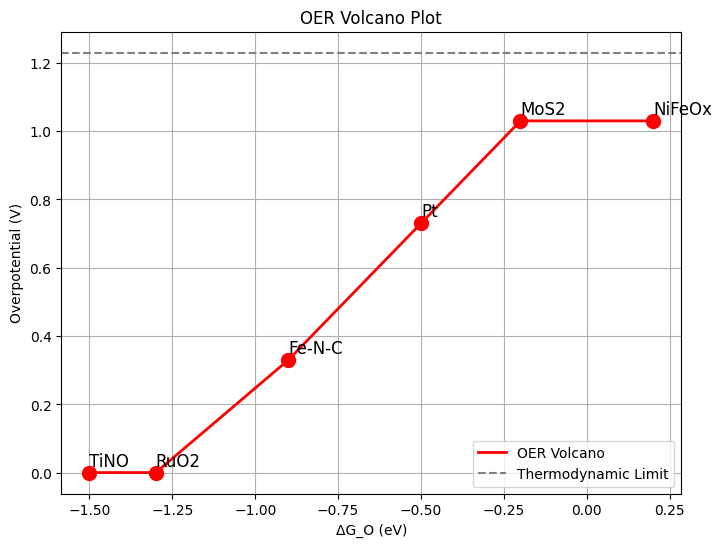

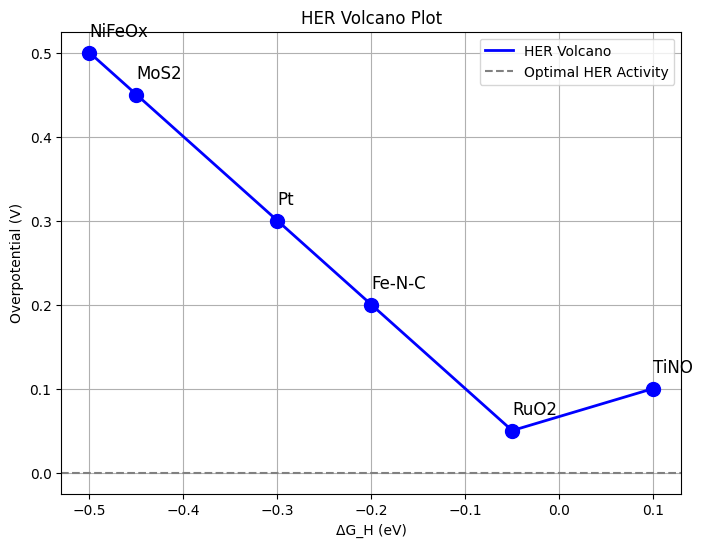

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define adsorption energies (ΔG) and overpotentials (η) for various catalysts
catalysts = ["TiNO", "RuO2", "Fe-N-C", "Pt", "MoS2", "NiFeOx"]
G_O = [-1.5, -1.3, -0.9, -0.5, -0.2, 0.2]  # OER Gibbs free energy (eV)
G_H = [0.1, -0.05, -0.2, -0.3, -0.45, -0.5]  # HER Gibbs free energy (eV)

# Compute volcano curve values
volcano_OER = [max(1.23 - abs(g), 0) for g in G_O]  # OER theoretical trend
volcano_HER = [max(abs(g), 0) for g in G_H]  # HER theoretical trend

# Plot OER Volcano
plt.figure(figsize=(8, 6))
plt.plot(G_O, volcano_OER, "r-", label="OER Volcano", linewidth=2)
plt.scatter(G_O, volcano_OER, color="red", s=100, zorder=3)

# Annotate catalysts
for i, name in enumerate(catalysts):
    plt.text(G_O[i], volcano_OER[i] + 0.02, name, fontsize=12)

plt.axhline(y=1.23, linestyle="--", color="gray", label="Thermodynamic Limit")
plt.xlabel("ΔG_O (eV)")
plt.ylabel("Overpotential (V)")
plt.title("OER Volcano Plot")
plt.legend()
plt.grid()
plt.show()

# Plot HER Volcano
plt.figure(figsize=(8, 6))
plt.plot(G_H, volcano_HER, "b-", label="HER Volcano", linewidth=2)
plt.scatter(G_H, volcano_HER, color="blue", s=100, zorder=3)

# Annotate catalysts
for i, name in enumerate(catalysts):
    plt.text(G_H[i], volcano_HER[i] + 0.02, name, fontsize=12)

plt.axhline(y=0, linestyle="--", color="gray", label="Optimal HER Activity")
plt.xlabel("ΔG_H (eV)")
plt.ylabel("Overpotential (V)")
plt.title("HER Volcano Plot")
plt.legend()
plt.grid()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Load computed Gibbs free energy values
data = np.loadtxt("Gibbs_Free_Energies_TiNO.txt", dtype=str)
labels = data[:, 0]
G_values = data[:, 1].astype(float)

# Volcano trend lines
volcano_OER = [max(1.23 - abs(G), 0) for G in G_values[:3]]  # OER volcano
volcano_HER = [max(abs(G), 0) for G in G_values[3:]]  # HER volcano

# OER Plot
plt.figure(figsize=(8, 6))
plt.plot(G_values[:3], volcano_OER, "r-", label="OER Volcano", linewidth=2)
plt.scatter(G_values[:3], volcano_OER, color="red", s=100, zorder=3)
for i, name in enumerate(labels[:3]):
    plt.text(G_values[i], volcano_OER[i] + 0.02, name, fontsize=12)
plt.axhline(y=1.23, linestyle="--", color="gray", label="Thermodynamic Limit")
plt.xlabel("ΔG (eV)")
plt.ylabel("Overpotential (V)")
plt.title("OER Volcano Plot for TiNO")
plt.legend()
plt.grid()
plt.show()

# HER Plot
plt.figure(figsize=(8, 6))
plt.plot(G_values[3:], volcano_HER, "b-", label="HER Volcano", linewidth=2)
plt.scatter(G_values[3:], volcano_HER, color="blue", s=100, zorder=3)
for i, name in enumerate(labels[3:]):
    plt.text(G_values[i+3], volcano_HER[i] + 0.02, name, fontsize=12)
plt.axhline(y=0, linestyle="--", color="gray", label="Optimal HER Activity")
plt.xlabel("ΔG_H (eV)")
plt.ylabel("Overpotential (V)")
plt.title("HER Volcano Plot for TiNO")
plt.legend()
plt.grid()
plt.show()


FileNotFoundError: Gibbs_Free_Energies_TiNO.txt not found.

In [ ]:
%%capture
!pip install qiskit
!pip install qiskit-nature
!pip install qiskit-aer

In [ ]:
from qiskit.providers.aer import AerProvider
#from qiskit import Aer
from qiskit_nature.drivers import PySCFDriver
from qiskit_nature.converters.second_quantization import QubitConverter
from qiskit_nature.algorithms.ground_state_solvers import VQEUCCFactory
from qiskit_nature.mappers.second_quantization import JordanWignerMapper
from qiskit.algorithms.optimizers import COBYLA

# Define the molecular structure of TiNO active site
driver = PySCFDriver(atom='Ti 0 0 0; O 0 0 1.6; N 0 0 -1.6', basis='sto-3g')

# Convert to qubit Hamiltonian
qubit_converter = QubitConverter(mapper=JordanWignerMapper())

# Use VQE with UCC ansatz
vqe_solver = VQEUCCFactory(qubit_converter, optimizer=COBYLA())

# Solve for ground-state energy
result = vqe_solver.solve(driver.run())

# Print optimized energy
print(f"VQE Computed Energy for TiNO Active Site: {result.electronic_energies.total:.6f} Hartree")



ModuleNotFoundError: No module named 'qiskit.providers.aer'